```text
QDM Synthetic Data + 3D Inversion + Magnetic source location, direction, intensity Detection

 This script performs the full workflow:
 1. Create synthetic magnetic observations (dipole moment equation)
 2. Generate synthetic data using TomoFast-x forward calculation
 3. Run TomoFast-x 3D inversion (WSL or Linux)
 4. Extract best-fit dipole 3D location for each grain (anomaly)
 5. Compute dipole moment, declination, and inclination


 Every step in an independent tool
```

# 1- Create Synthetic Data

#### VIP_Note Conversion rule between Tomofast and QDM

**QDM:** Z-axis positive *up*  
**Tomofast:** Z-axis positive *down*

| Conversion | Rule |
|-----------|------|
| **QDM → Tomofast** | Flip both **Bz** and **Mz** |
| **Tomofast → QDM** | Flip both **Bz** and **Mz** |
| **Tomofast → Tomofast** | Don’t flip **Bz** and don’t flip **Mz** |
| **QDM → QDM** | Don’t flip **Bz** and don’t flip **Mz** |


In [1]:
# Create Folder

import os

base_dir = os.getcwd()
folder_path = os.path.join(base_dir, "1-Synthetic_Data")

if os.path.exists(folder_path):
    print("Folder already exists:", folder_path)
else:
    os.mkdir(folder_path)
    print("Folder created:", folder_path)



Folder already exists: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\1-Synthetic_Data



--- Dipole 1 ---
mx= 0.0 my= 7.071067811865477e-14 mz= 7.071067811865477e-14

--- Note Mz are flipped from qdm to tomofast convention positive down ---

--- Dipole 1---
Mx(meters)= 0.0 My(meters)= 8838.834764831847 Mz(meters)= -8838.834764831847

--- Dipole 2 ---
mx= 5.303300858899108e-14 my= 5.303300858899108e-14 mz= 1.2990381056766579e-13

--- Note Mz are flipped from qdm to tomofast convention positive down ---

--- Dipole 2---
Mx(meters)= 6629.1260736238855 My(meters)= 6629.1260736238855 Mz(meters)= -16237.976320958225

--- Dipole 3 ---
mx= 1.2246467991473532e-29 my= 7.498798913309289e-46 mz= 2e-13

--- Note Mz are flipped from qdm to tomofast convention positive down ---

--- Dipole 3---
Mx(meters)= 1.5308084989341917e-12 My(meters)= 9.373498641636612e-29 Mz(meters)= -25000.000000000004

--- Dipole 4 ---
mx= 1.2247448713915894e-13 my= -1.2247448713915891e-13 mz= 9.999999999999999e-14

--- Note Mz are flipped from qdm to tomofast convention positive down ---

--- Dipole 4---
Mx(me

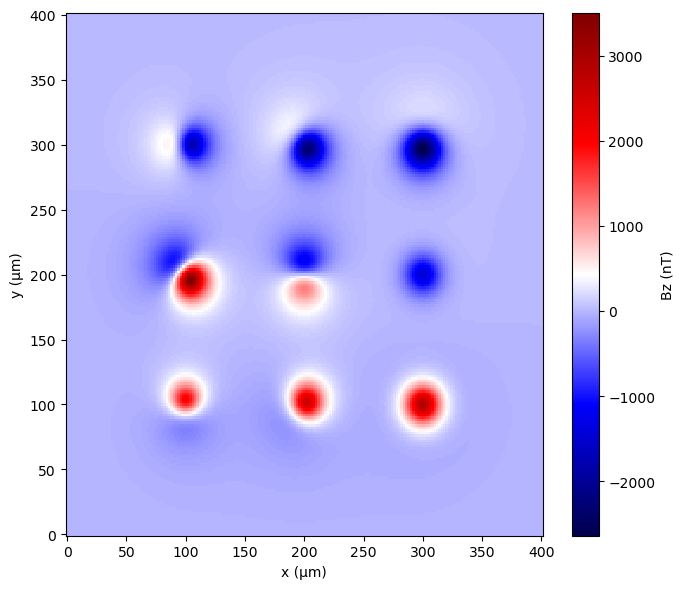

Wrote: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\1-Synthetic_Data\dipole_field_Bz_4dipoles_Sep_35.2Mm.mat
Wrote: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\1-Synthetic_Data\dipoles_moments.txt
Wrote: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\1-Synthetic_Data\dipoles_magnetization.txt


In [2]:
# The line creates synthetic data using user defined inputs (X, Y, Z, I, D, Amp)

import numpy as np
import matplotlib.pyplot as plt
import scipy.io as sio
import pandas as pd
import os


# Force full array printing
#np.set_printoptions(threshold=np.inf)

# Get the absolute folder path where this script is located
base_dir = os.getcwd()  # current working directory


# -----------------------------
# Constants & grid
# -----------------------------
MU0_OVER_4PI = 1e-7  # T·m/A

# define x , y , and spacing
x_um = np.arange(0, 400+1, 2)
y_um = np.arange(0, 400+1, 2)
X, Y = np.meshgrid(x_um, y_um)
sensor_z_um = 5.0

# Flatten grid (for field calculation)
Xf = X.ravel() * 1e-6
Yf = Y.ravel() * 1e-6
Zf = np.full_like(Xf, sensor_z_um * 1e-6)
Bz_total = np.zeros_like(Xf, dtype=float)

# storage for any number of dipoles ----
mx_list, my_list, mz_list = [], [], []
Mx_list, My_list, Mz_list = [], [], []   # Mz will be stored flipped (Tomofast convention)

# =============================
#  Dipole 1 
# =============================
xd_um, yd_um, zd_um = 100, 100, -15
inc_deg, dec_deg, amplitude = -45, 0, 1e-13
inc = np.radians(inc_deg); dec = np.radians(dec_deg)
h = amplitude * np.cos(inc)
mx = h * np.sin(dec); my = h * np.cos(dec); mz = -amplitude * np.sin(inc)
xd, yd, zd = xd_um*1e-6, yd_um*1e-6, zd_um*1e-6
rx, ry, rz = Xf - xd, Yf - yd, Zf - zd
r = np.sqrt(rx*rx + ry*ry + rz*rz); r = np.where(r == 0, np.finfo(float).eps, r)
rhat_x, rhat_y, rhat_z = rx/r, ry/r, rz/r
mdotr = mx*rhat_x + my*rhat_y + mz*rhat_z
Bz_total += MU0_OVER_4PI * (3.0*mdotr*rhat_z - mz) / (r**3)

print("\n--- Dipole 1 ---")
print("mx=", mx, "my=", my, "mz=", mz)
#print("Bz3 (T)", Bz_total)

# ---- : store dipole  moments ----
mx_list.append(mx)
my_list.append(my)
mz_list.append(mz)

#convert from moment to magnetization vector by dividing by voxel (cell) volume 
dx_micro = 2e-6
dy_micro = 2e-6
dz_micro = 2e-6
V_micro = dx_micro * dy_micro * dz_micro
Mx = mx / V_micro
My = my / V_micro
Mz = mz / V_micro

print("\n--- Note Mz are flipped from qdm to tomofast convention positive down ---")
print("\n--- Dipole 1---")
print("Mx(meters)=", Mx, "My(meters)=", My, "Mz(meters)=", -Mz)

# store dipole magnetization (with flipped Mz, as printed) ----
Mx_list.append(Mx)
My_list.append(My)
Mz_list.append(-Mz)


# =============================
#  Dipole 2 
# =============================
xd_um, yd_um, zd_um = 200, 100, -17
inc_deg, dec_deg, amplitude = -60, 45, 1.5e-13
inc = np.radians(inc_deg); dec = np.radians(dec_deg)
h = amplitude * np.cos(inc)
mx = h * np.sin(dec); my = h * np.cos(dec); mz = -amplitude * np.sin(inc)
xd, yd, zd = xd_um*1e-6, yd_um*1e-6, zd_um*1e-6
rx, ry, rz = Xf - xd, Yf - yd, Zf - zd
r = np.sqrt(rx*rx + ry*ry + rz*rz); r = np.where(r == 0, np.finfo(float).eps, r)
rhat_x, rhat_y, rhat_z = rx/r, ry/r, rz/r
mdotr = mx*rhat_x + my*rhat_y + mz*rhat_z
Bz_total += MU0_OVER_4PI * (3.0*mdotr*rhat_z - mz) / (r**3)

print("\n--- Dipole 2 ---")
print("mx=", mx, "my=", my, "mz=", mz)
#print("Bz3 (T)", Bz_total)

# ---- : store dipole  moments ----
mx_list.append(mx)
my_list.append(my)
mz_list.append(mz)

#convert from moment to magnetization vector by dividing by voxel (cell) volume 
dx_micro = 2e-6
dy_micro = 2e-6
dz_micro = 2e-6
V_micro = dx_micro * dy_micro * dz_micro
Mx = mx / V_micro
My = my / V_micro
Mz = mz / V_micro

print("\n--- Note Mz are flipped from qdm to tomofast convention positive down ---")
print("\n--- Dipole 2---")
print("Mx(meters)=", Mx, "My(meters)=", My, "Mz(meters)=", -Mz)

# store dipole magnetization (with flipped Mz, as printed) ----
Mx_list.append(Mx)
My_list.append(My)
Mz_list.append(-Mz)


# =============================
#  Dipole 3 
# =============================
xd_um, yd_um, zd_um = 300, 100, -19
inc_deg, dec_deg, amplitude = -90, 90, 2e-13
inc = np.radians(inc_deg); dec = np.radians(dec_deg)
h = amplitude * np.cos(inc)
mx = h * np.sin(dec); my = h * np.cos(dec); mz = -amplitude * np.sin(inc)
xd, yd, zd = xd_um*1e-6, yd_um*1e-6, zd_um*1e-6
rx, ry, rz = Xf - xd, Yf - yd, Zf - zd
r = np.sqrt(rx*rx + ry*ry + rz*rz); r = np.where(r == 0, np.finfo(float).eps, r)
rhat_x, rhat_y, rhat_z = rx/r, ry/r, rz/r
mdotr = mx*rhat_x + my*rhat_y + mz*rhat_z
Bz_total += MU0_OVER_4PI * (3.0*mdotr*rhat_z - mz) / (r**3)

print("\n--- Dipole 3 ---")
print("mx=", mx, "my=", my, "mz=", mz)
#print("Bz3 (T)", Bz_total)

# ---- : store dipole  moments ----
mx_list.append(mx)
my_list.append(my)
mz_list.append(mz)

#convert from moment to magnetization vector by dividing by voxel (cell) volume 
dx_micro = 2e-6
dy_micro = 2e-6
dz_micro = 2e-6
V_micro = dx_micro * dy_micro * dz_micro
Mx = mx / V_micro
My = my / V_micro
Mz = mz / V_micro

print("\n--- Note Mz are flipped from qdm to tomofast convention positive down ---")
print("\n--- Dipole 3---")
print("Mx(meters)=", Mx, "My(meters)=", My, "Mz(meters)=", -Mz)

# store dipole magnetization (with flipped Mz, as printed) ----
Mx_list.append(Mx)
My_list.append(My)
Mz_list.append(-Mz)


# =============================
#  Dipole 4
# =============================
xd_um, yd_um, zd_um = 100, 200, -15
inc_deg, dec_deg, amplitude = -30.0, 135, 2e-13
inc = np.radians(inc_deg); dec = np.radians(dec_deg)
h = amplitude * np.cos(inc)
mx = h * np.sin(dec); my = h * np.cos(dec); mz = -amplitude * np.sin(inc)
xd, yd, zd = xd_um*1e-6, yd_um*1e-6, zd_um*1e-6
rx, ry, rz = Xf - xd, Yf - yd, Zf - zd
r = np.sqrt(rx*rx + ry*ry + rz*rz); r = np.where(r == 0, np.finfo(float).eps, r)
rhat_x, rhat_y, rhat_z = rx/r, ry/r, rz/r
mdotr = mx*rhat_x + my*rhat_y + mz*rhat_z
Bz_total += MU0_OVER_4PI * (3.0*mdotr*rhat_z - mz) / (r**3)

print("\n--- Dipole 4 ---")
print("mx=", mx, "my=", my, "mz=", mz)
#print("Bz3 (T)", Bz_total)

# ---- : store dipole  moments ----
mx_list.append(mx)
my_list.append(my)
mz_list.append(mz)

#convert from moment to magnetization vector by dividing by voxel (cell) volume 
dx_micro = 2e-6
dy_micro = 2e-6
dz_micro = 2e-6
V_micro = dx_micro * dy_micro * dz_micro
Mx = mx / V_micro
My = my / V_micro
Mz = mz / V_micro

print("\n--- Note Mz are flipped from qdm to tomofast convention positive down ---")
print("\n--- Dipole 4---")
print("Mx(meters)=", Mx, "My(meters)=", My, "Mz(meters)=", -Mz)

# store dipole magnetization (with flipped Mz, as printed) ----
Mx_list.append(Mx)
My_list.append(My)
Mz_list.append(-Mz)


# =============================
#  Dipole 5
# =============================
xd_um, yd_um, zd_um = 200, 200, -17
inc_deg, dec_deg, amplitude = 0, 180, 1.5e-13
inc = np.radians(inc_deg); dec = np.radians(dec_deg)
h = amplitude * np.cos(inc)
mx = h * np.sin(dec); my = h * np.cos(dec); mz = -amplitude * np.sin(inc)
xd, yd, zd = xd_um*1e-6, yd_um*1e-6, zd_um*1e-6
rx, ry, rz = Xf - xd, Yf - yd, Zf - zd
r = np.sqrt(rx*rx + ry*ry + rz*rz); r = np.where(r == 0, np.finfo(float).eps, r)
rhat_x, rhat_y, rhat_z = rx/r, ry/r, rz/r
mdotr = mx*rhat_x + my*rhat_y + mz*rhat_z
Bz_total += MU0_OVER_4PI * (3.0*mdotr*rhat_z - mz) / (r**3)

print("\n--- Dipole 5 ---")
print("mx=", mx, "my=", my, "mz=", mz)
#print("Bz3 (T)", Bz_total)

# ---- : store dipole  moments ----
mx_list.append(mx)
my_list.append(my)
mz_list.append(mz)

#convert from moment to magnetization vector by dividing by voxel (cell) volume 
dx_micro = 2e-6
dy_micro = 2e-6
dz_micro = 2e-6
V_micro = dx_micro * dy_micro * dz_micro
Mx = mx / V_micro
My = my / V_micro
Mz = mz / V_micro

print("\n--- Note Mz are flipped from qdm to tomofast convention positive down ---")
print("\n--- Dipole 5---")
print("Mx(meters)=", Mx, "My(meters)=", My, "Mz(meters)=", -Mz)

# store dipole magnetization (with flipped Mz, as printed) ----
Mx_list.append(Mx)
My_list.append(My)
Mz_list.append(-Mz)


# =============================
#  Dipole 6
# =============================
xd_um, yd_um, zd_um = 300, 200, -19
inc_deg, dec_deg, amplitude = 90, 225, 1e-13
inc = np.radians(inc_deg); dec = np.radians(dec_deg)
h = amplitude * np.cos(inc)
mx = h * np.sin(dec); my = h * np.cos(dec); mz = -amplitude * np.sin(inc)
xd, yd, zd = xd_um*1e-6, yd_um*1e-6, zd_um*1e-6
rx, ry, rz = Xf - xd, Yf - yd, Zf - zd
r = np.sqrt(rx*rx + ry*ry + rz*rz); r = np.where(r == 0, np.finfo(float).eps, r)
rhat_x, rhat_y, rhat_z = rx/r, ry/r, rz/r
mdotr = mx*rhat_x + my*rhat_y + mz*rhat_z
Bz_total += MU0_OVER_4PI * (3.0*mdotr*rhat_z - mz) / (r**3)

print("\n--- Dipole 6 ---")
print("mx=", mx, "my=", my, "mz=", mz)
#print("Bz3 (T)", Bz_total)

# ---- : store dipole  moments ----
mx_list.append(mx)
my_list.append(my)
mz_list.append(mz)

#convert from moment to magnetization vector by dividing by voxel (cell) volume 
dx_micro = 2e-6
dy_micro = 2e-6
dz_micro = 2e-6
V_micro = dx_micro * dy_micro * dz_micro
Mx = mx / V_micro
My = my / V_micro
Mz = mz / V_micro

print("\n--- Note Mz are flipped from qdm to tomofast convention positive down ---")
print("\n--- Dipole 6---")
print("Mx(meters)=", Mx, "My(meters)=", My, "Mz(meters)=", -Mz)

# store dipole magnetization (with flipped Mz, as printed) ----
Mx_list.append(Mx)
My_list.append(My)
Mz_list.append(-Mz)


# =============================
#  Dipole 7
# =============================
xd_um, yd_um, zd_um = 100, 300, -15
inc_deg, dec_deg, amplitude = 30.0, 270, 1e-13
inc = np.radians(inc_deg); dec = np.radians(dec_deg)
h = amplitude * np.cos(inc)
mx = h * np.sin(dec); my = h * np.cos(dec); mz = -amplitude * np.sin(inc)
xd, yd, zd = xd_um*1e-6, yd_um*1e-6, zd_um*1e-6
rx, ry, rz = Xf - xd, Yf - yd, Zf - zd
r = np.sqrt(rx*rx + ry*ry + rz*rz); r = np.where(r == 0, np.finfo(float).eps, r)
rhat_x, rhat_y, rhat_z = rx/r, ry/r, rz/r
mdotr = mx*rhat_x + my*rhat_y + mz*rhat_z
Bz_total += MU0_OVER_4PI * (3.0*mdotr*rhat_z - mz) / (r**3)

print("\n--- Dipole 7 ---")
print("mx=", mx, "my=", my, "mz=", mz)
#print("Bz3 (T)", Bz_total)

# ---- : store dipole  moments ----
mx_list.append(mx)
my_list.append(my)
mz_list.append(mz)

#convert from moment to magnetization vector by dividing by voxel (cell) volume 
dx_micro = 2e-6
dy_micro = 2e-6
dz_micro = 2e-6
V_micro = dx_micro * dy_micro * dz_micro
Mx = mx / V_micro
My = my / V_micro
Mz = mz / V_micro

print("\n--- Note Mz are flipped from qdm to tomofast convention positive down ---")
print("\n--- Dipole 7---")
print("Mx(meters)=", Mx, "My(meters)=", My, "Mz(meters)=", -Mz)

# store dipole magnetization (with flipped Mz, as printed) ----
Mx_list.append(Mx)
My_list.append(My)
Mz_list.append(-Mz)


# =============================
#  Dipole 8
# =============================
xd_um, yd_um, zd_um = 200, 300, -17
inc_deg, dec_deg, amplitude = 45, 315, 1.5e-13
inc = np.radians(inc_deg); dec = np.radians(dec_deg)
h = amplitude * np.cos(inc)
mx = h * np.sin(dec); my = h * np.cos(dec); mz = -amplitude * np.sin(inc)
xd, yd, zd = xd_um*1e-6, yd_um*1e-6, zd_um*1e-6
rx, ry, rz = Xf - xd, Yf - yd, Zf - zd
r = np.sqrt(rx*rx + ry*ry + rz*rz); r = np.where(r == 0, np.finfo(float).eps, r)
rhat_x, rhat_y, rhat_z = rx/r, ry/r, rz/r
mdotr = mx*rhat_x + my*rhat_y + mz*rhat_z
Bz_total += MU0_OVER_4PI * (3.0*mdotr*rhat_z - mz) / (r**3)

print("\n--- Dipole 8 ---")
print("mx=", mx, "my=", my, "mz=", mz)
#print("Bz3 (T)", Bz_total)

# ---- : store dipole  moments ----
mx_list.append(mx)
my_list.append(my)
mz_list.append(mz)

#convert from moment to magnetization vector by dividing by voxel (cell) volume 
dx_micro = 2e-6
dy_micro = 2e-6
dz_micro = 2e-6
V_micro = dx_micro * dy_micro * dz_micro
Mx = mx / V_micro
My = my / V_micro
Mz = mz / V_micro

print("\n--- Note Mz are flipped from qdm to tomofast convention positive down ---")
print("\n--- Dipole 8---")
print("Mx(meters)=", Mx, "My(meters)=", My, "Mz(meters)=", -Mz)

# store dipole magnetization (with flipped Mz, as printed) ----
Mx_list.append(Mx)
My_list.append(My)
Mz_list.append(-Mz)


# =============================
#  Dipole 9
# ============================
xd_um, yd_um, zd_um = 300, 300, -19
inc_deg, dec_deg, amplitude = 60, 360, 2e-13
inc = np.radians(inc_deg); dec = np.radians(dec_deg)
h = amplitude * np.cos(inc)
mx = h * np.sin(dec); my = h * np.cos(dec); mz = -amplitude * np.sin(inc)
xd, yd, zd = xd_um*1e-6, yd_um*1e-6, zd_um*1e-6
rx, ry, rz = Xf - xd, Yf - yd, Zf - zd
r = np.sqrt(rx*rx + ry*ry + rz*rz); r = np.where(r == 0, np.finfo(float).eps, r)
rhat_x, rhat_y, rhat_z = rx/r, ry/r, rz/r
mdotr = mx*rhat_x + my*rhat_y + mz*rhat_z
Bz_total += MU0_OVER_4PI * (3.0*mdotr*rhat_z - mz) / (r**3)

print("\n--- Dipole 9 ---")
print("mx=", mx, "my=", my, "mz=", mz)
#print("Bz3 (T)", Bz_total)

# ---- : store dipole  moments ----
mx_list.append(mx)
my_list.append(my)
mz_list.append(mz)

#convert from moment to magnetization vector by dividing by voxel (cell) volume 
dx_micro = 2e-6
dy_micro = 2e-6
dz_micro = 2e-6
V_micro = dx_micro * dy_micro * dz_micro
Mx = mx / V_micro
My = my / V_micro
Mz = mz / V_micro

print("\n--- Note Mz are flipped from qdm to tomofast convention positive down ---")
print("\n--- Dipole 9---")
print("Mx(meters)=", Mx, "My(meters)=", My, "Mz(meters)=", -Mz)

# store dipole magnetization (with flipped Mz, as printed) ----
Mx_list.append(Mx)
My_list.append(My)
Mz_list.append(-Mz)


# -----------------------------
# Finish: reshape and noise
# -----------------------------
Bz_T = Bz_total.reshape(X.shape)
Bz_nT = Bz_T * 1e9 # To nanoTesla
rng = np.random.default_rng(42)
Bz_nT = Bz_nT #+ 400.0 + rng.normal(0, 50, size=Bz_nT.shape) # add noise (not recommended)

# -----------------------------
# Plot
# -----------------------------
plt.figure(figsize=(7,6))
im = plt.pcolormesh(X, Y, Bz_nT, shading='auto', cmap='seismic')
plt.colorbar(im, label='Bz (nT)')
plt.xlabel('x (µm)')
plt.ylabel('y (µm)')
plt.tight_layout()
plt.savefig(os.path.join(base_dir,"1-Synthetic_Data", "dipole_field_Bz.png"), dpi=300)   # <-- save plot as PNG
plt.show()

# -----------------------------
# Save data to .CSV and .MAT
# -----------------------------
# ===================
# Flatten for output
x_out = X.ravel()
y_out = Y.ravel()
z_out = np.full_like(x_out, sensor_z_um)
bz_out = Bz_nT.ravel()

# --- CSV ---
df = pd.DataFrame({
    "x_um": x_out,
    "y_um": y_out,
    "z_um": z_out,
    "Bz_nT": bz_out
})
df.to_csv(os.path.join(base_dir, "1-Synthetic_Data","dipole_field_Bz.csv"), index=False)

# ----- Make a MATLAB-style "Bz.mat" output  -----
# Note: Units in the QDMLAB MATLAB  are Tesla and we use nT for our QDM 
Bz = (Bz_nT * 1e-9).astype(float)  # convert nT -> T
Bu = Bz.copy()                      # test stub: use Bz as Bu
Bt = np.abs(Bz)                     # test stub: |Bz| as total field

# Geometry/metadata
step = float(np.diff(x_um).mean() * 1e-6)   # pixel size in meters
h = float(sensor_z_um * 1e-6)               # NV-sample distance in meters
Ny, Nx = Bz.shape
corners = np.array([[1, 1], [Ny, Nx]], dtype=np.int32)  # full image (MATLAB 1-based indexing)
newLED = np.linspace(0, 1, Bz_nT.size).reshape(Bz_nT.shape) * 1e-3

# Save with the same variable names the MATLAB code writes
matlab_like_path = os.path.join(base_dir, "1-Synthetic_Data", "dipole_field_Bz_4dipoles_Sep_35.2Mm.mat")
sio.savemat(matlab_like_path, {
    "Bz": Bz,
    "Bt": Bt,
    "Bu": Bu,
    "h": h,
    "step": step,
    "corners": corners,
    "newLED": newLED,
})
print("Wrote:", matlab_like_path)

#  write TXT files for moments and magnetization ----
n_dip = len(mx_list)

moments_path = os.path.join(base_dir, "1-Synthetic_Data", "dipoles_moments.txt")
mag_path     = os.path.join(base_dir,"1-Synthetic_Data", "dipoles_magnetization.txt")

# 1) mx my mz (original moments)
with open(moments_path, "w") as f:
    f.write(f"{n_dip}\n")  # header: number of cells (dipoles)
    for a, b, c in zip(mx_list, my_list, mz_list):
        f.write(f"{a:.16e} {b:.16e} {c:.16e}\n")

# 2) Mx My Mz (magnetization, with Mz already flipped above)
with open(mag_path, "w") as f:
    f.write(f"{n_dip}\n")  # header: number of cells (dipoles)
    for a, b, c in zip(Mx_list, My_list, Mz_list):
        f.write(f"{a:.16e} {b:.16e} {c:.16e}\n")

print("Wrote:", moments_path)
print("Wrote:", mag_path)

In [3]:
# Vector Direction Calculation (Double Check Step)
import os
import numpy as np

# --- paths ---
base_dir  = os.getcwd()  # or whatever you already use
mag_path  = os.path.join(base_dir, "1-Synthetic_Data", "dipoles_magnetization.txt")

# --- read Mx, My, Mz from file (skip first line = number of vectors) ---
data = np.loadtxt(mag_path, skiprows=1)   # shape: (N, 3) or (3,) if only one row
if data.ndim == 1:
    data = data[None, :]                  # force 2D if single row

# === Declination & Inclination for each row ===
for idx, (Mx, My, Mz) in enumerate(data, start=1):

    # ----  original code ----
    Mz = -Mz
    m = np.sqrt(Mx**2 + My**2 + Mz**2)

    if m == 0:
        dec, inc = np.nan, np.nan
    else:
        theta = np.degrees(np.arccos(Mz / m))
        phi   = np.degrees(np.arctan2(My, Mx))

        inc = theta - 90
        #inc = 90 -  theta
        #dec= phi - 90
        dec = 90- phi

        change = True
        while change:
            change = False

            if inc > 90:
                inc = 180 - inc # i' = 180-i
                dec = dec + 180 # d' = d+180
                change = True

            if inc < -90:
                inc = -180 - inc # i' = -180-i
                dec = dec + 180 #d' = d+180
                change = True

            if dec < 0:
                dec = dec + 360 #d' = d+360
                change = True

            if dec >= 360:
                dec = dec - 360 #d' = d-360
                change = True

    print(f"Vector {idx}:")
    if m != 0:
        print("  phi=", phi,   "theta=", theta)
    print("  dec=", dec, "inc=", inc)


Vector 1:
  phi= 90.0 theta= 45.0
  dec= 0.0 inc= -45.0
Vector 2:
  phi= 45.0 theta= 30.000000000000018
  dec= 45.0 inc= -59.999999999999986
Vector 3:
  phi= 3.508354649267438e-15 theta= 0.0
  dec= 90.0 inc= -90.0
Vector 4:
  phi= -44.99999999999999 theta= 60.00000000000001
  dec= 135.0 inc= -29.999999999999993
Vector 5:
  phi= -90.0 theta= 90.0
  dec= 180.0 inc= 0.0
Vector 6:
  phi= -135.0 theta= 180.0
  dec= 225.0 inc= 90.0
Vector 7:
  phi= -180.0 theta= 120.00000000000001
  dec= 270.0 inc= 30.000000000000014
Vector 8:
  phi= 135.00000000000003 theta= 135.0
  dec= 315.0 inc= 45.0
Vector 9:
  phi= 90.00000000000001 theta= 150.0
  dec= 0.0 inc= 60.0


# 2- Tomofast Synthetic Data (Forward Calculation)

In [4]:
# Create Folder
import os

base_dir = os.getcwd()
folder_path = os.path.join(base_dir, "2-Forward_Data") 

if os.path.exists(folder_path):
    print("Folder already exists:", folder_path)
else:
    os.mkdir(folder_path)
    print("Folder created:", folder_path)


Folder already exists: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\2-Forward_Data


### 1. Data Prep

(40401, 4)
Plot saved to D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\2-Forward_Data\bz.png


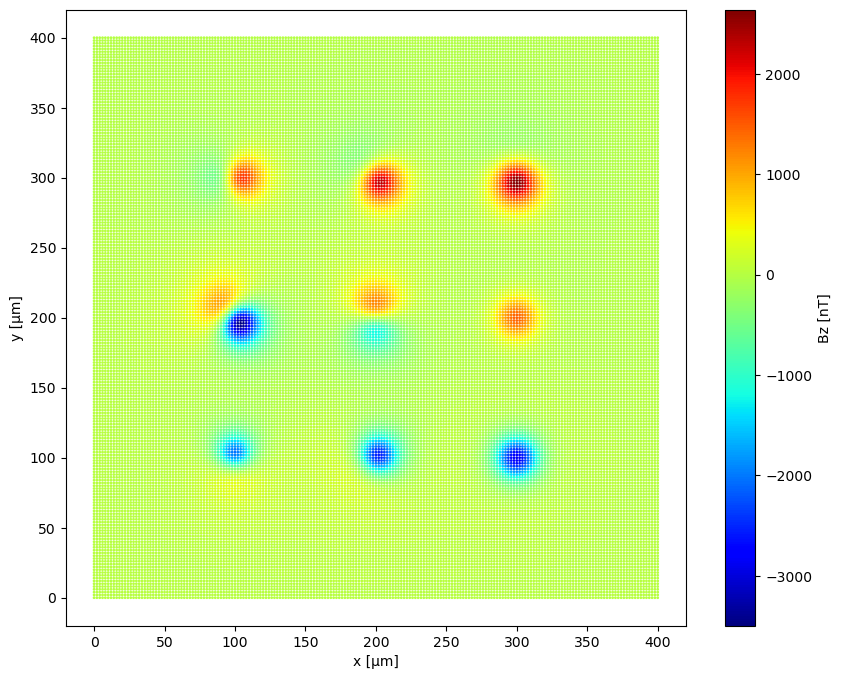

Grid dimensions: 201 201
(201, 201)
Plot saved to D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\2-Forward_Data\Clipped_bz.png


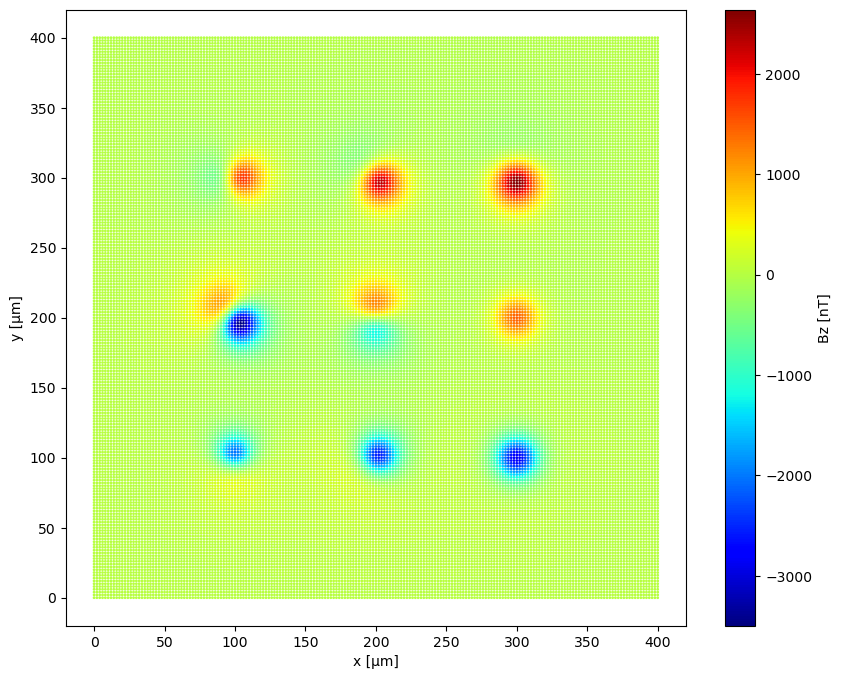

Xmin, Xmax = 0.0 400.0
Ymin, Ymax = 0.0 400.0
Ndata = 40401


In [5]:
#Data Perp. full scan ( or clip optional)
import os
import numpy as np
import matplotlib.pyplot as plt

base_dir = os.getcwd()  # current working directory
    
def plot_data(x_coords, y_coords, values, title, out_dir= os.path.join(base_dir, "2-Forward_Data")):
    # Make sure output directory exists
    os.makedirs(out_dir, exist_ok=True)

    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(x_coords, y_coords, c=values, cmap='jet', s=1)
    #plt.axis('equal')
    plt.colorbar(scatter, label='Bz [nT]')
    plt.xlabel('x [µm]')
    plt.ylabel('y [µm]')
    #plt.title(title)

    # Save plot to file
    filename = os.path.join(out_dir, f"{title.replace(' ', '_')}.png")
    plt.savefig(filename, dpi=300, bbox_inches="tight")
    print(f"Plot saved to {filename}")

    plt.show()
    
#filename_z = os.path.join(base_dir, "I=90", "data", "mag_calc_prior_data.txt")
#data_z = np.loadtxt(filename_z, skiprows=1)

filename_z = os.path.join(base_dir, "1-Synthetic_Data", "dipole_field_Bz.csv")
data_z = np.loadtxt(filename_z, delimiter=",", skiprows=1)

print(data_z.shape)

x_coords = data_z[:, 0]
y_coords = data_z[:, 1]
z_coords = data_z[:, 2]
z_coords = 0*data_z[:, 2] #Make Z=0

bz = data_z[:, 3]

bz = -1*data_z[:, 3] #Flipping Bz for tomofast coordiante system Z is positive down, the QDM Bz is positive up

#bx = data_z[:, 3]
#by = data_z[:, 4]

#amplitude
#b_mag = np.sqrt(bx**2 + by**2 + bz**2)


# Plot the image of data.
plot_data(x_coords, y_coords, bz, 'bz')

#==============================================================
# Find unique coordinates to determine grid dimensions.
unique_x = np.unique(x_coords)
unique_y = np.unique(y_coords)

nx = len(unique_x)  # number of points in X direction
ny = len(unique_y)  # number of points in Y direction

print("Grid dimensions:", nx, ny)

x_coords = x_coords.reshape(ny, nx)
y_coords = y_coords.reshape(ny, nx)
z_coords = z_coords.reshape(ny, nx)

bz = bz.reshape(ny, nx)
#==============================================================
# Clipping the data.
#enter the cell index (given the one index equal 4.4 increment)
# to cover the full range (min → max)
x_start = 0
x_end   = nx
y_start = 0
y_end   = ny

x_coords = x_coords[y_start:y_end, x_start:x_end]
y_coords = y_coords[y_start:y_end, x_start:x_end]
z_coords = z_coords[y_start:y_end, x_start:x_end]
bz = bz[y_start:y_end, x_start:x_end]

print(bz.shape)

# Convert back to 1D array.
x_coords = x_coords.flatten()
y_coords = y_coords.flatten()
z_coords = z_coords.flatten()
bz = bz.flatten()

# Plot the image of data.
plot_data(x_coords, y_coords, bz, 'Clipped bz')

print('Xmin, Xmax =', np.min(x_coords), np.max(x_coords))
print('Ymin, Ymax =', np.min(y_coords), np.max(y_coords))

#==============================================================
# Write tomofast data grid.
# Bz only
data_combined = np.column_stack((x_coords, y_coords, z_coords, bz))
#data_combined = np.column_stack((x_coords, y_coords, z_coords, bx, by, bz))

Ndataz = len(bz)
print('Ndata =', Ndataz)

np.savetxt(os.path.join(base_dir, "2-Forward_Data", "Mag_Forward.obs"), data_combined, delimiter=' ', fmt="%f %f %f %f", header=str(Ndataz), comments='')

### 2. Mesh Creation

In [6]:
#Mesh Creation of Dipoles

import os
import numpy as np

base_dir = os.getcwd()
out_path = os.path.join(base_dir, "2-Forward_Data", "Meshgrid_Forward.txt")
os.makedirs(os.path.dirname(out_path), exist_ok=True)

# =====================================================
# 1) DEFINE  CELLS HERE of each dipole
#    Each tuple: (xmin, xmax, ymin, ymax, zmin, zmax)
# =====================================================
cells = [
    # dipole 1
    (99, 101, 99, 101, 14, 16),

   # dipole 2
    (199, 201, 99, 101, 16, 18),

      # dipole 3
    (299, 301, 99, 101, 18, 20),

      # dipole 4
    (99, 101, 199, 201, 14, 16),

      # dipole 5
    (199, 201, 199, 201, 16, 18),

      # dipole 6
    (299, 301, 199, 201, 18, 20),
    
      # dipole 7
    (99, 101, 299, 301, 14, 16),

      # dipole 8
    (199, 201, 299, 301, 16, 18),

      # dipole 9
    (299, 301, 299, 301, 18, 20),
    
]

# =====================================================
# 2) BUILD LINE DATA (3 data components, i,j,k indices)
# =====================================================
line_data = []
for idx, (xmin, xmax, ymin, ymax, zmin, zmax) in enumerate(cells, start=1):
    # data comps = 0.0, indices = idx, 1, 1 (change if you want)
    line_data.append([
        xmin, xmax,
        ymin, ymax,
        zmin, zmax,
        0.0, 0.0, 0.0,   # 3 data components
        idx, 1, 1        # i, j, k
    ])

line_data = np.array(line_data)
num_cells = line_data.shape[0]
print("num_cells =", num_cells)

# =====================================================
# 3) WRITE TOMOFAST MESH FILE
# =====================================================
with open(out_path, "w") as f:
    f.write(f"{num_cells}\n")
    np.savetxt(
        f,
        line_data,
        fmt="%.6f %.6f %.6f %.6f %.6f %.6f %.6f %.6f %.6f %d %d %d"
    )

print("Saved:", out_path)


num_cells = 9
Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\2-Forward_Data\Meshgrid_Forward.txt


### 3. Create Parfile

In [7]:
# Create Folder
import os

base_dir = os.getcwd()
folder_path = os.path.join(base_dir,  "0-Parfiles")  

if os.path.exists(folder_path):
    print("Folder already exists:", folder_path)
else:
    os.mkdir(folder_path)
    print("Folder created:", folder_path)


Folder already exists: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\0-Parfiles


In [8]:
# Create forward parfile
#define num of true dipoles as nx and num of data points as ndata
import os

base_dir = os.getcwd()
output_path = os.path.join(base_dir,"0-Parfiles", "Parfile_QDM_Forward.txt")

par_text = """==================================================================================
GLOBAL
==================================================================================
global.outputFolderPath         = ./output/QDM
global.description              = QDM inversion data

==================================================================================
MODEL GRID parameters
==================================================================================
# nx ny nz
modelGrid.size                        = 9 1 1
modelGrid.magn.file                   = data/QDM/Meshgrid_Forward.txt
modelGrid.magn.nModelComponents       = 3
==================================================================================
DATA parameters
==================================================================================
forward.data.magn.nData                = 40401
forward.data.magn.dataGridFile         = data/QDM/Mag_Forward.obs
forward.data.magn.dataValuesFile       = data/QDM/Mag_Forward.obs
forward.data.magn.nDataComponents      = 1

==================================================================================
MAGNETIC FIELD constants
==================================================================================
forward.magneticField.inclination              = 90.0
forward.magneticField.declination              = 0.0
forward.magneticField.intensity_nT             = 53829. 
forward.magneticField.XaxisDeclination         = 0.d0

==================================================================================
DEPTH WEIGHTING
==================================================================================
# 1-depth weight, 2-distance weight.
forward.depthWeighting.type                    = 1

==================================================================================
SENSITIVITY KERNEL
==================================================================================
# 0-calculate the sensitivity, 1-read from files at the specified folder.
sensit.readFromFiles                  = 0
sensit.folderPath                     = ./SENSIT/

==================================================================================
MATRIX COMPRESSION
==================================================================================
# 0-none, 1-wavelet compression.
forward.matrixCompression.type                        = 0
# The minimum compressed sensitivity absolute value.
forward.matrixCompression.rate                        = 0.02

==================================================================================
PRIOR MODEL
==================================================================================
# 1-set value, 2-read from file.
inversion.priorModel.type             = 2
inversion.priorModel.magn.file        = data/QDM/dipoles_magnetization.txt

==================================================================================
INVERSION parameters
==================================================================================
inversion.nMajorIterations              = 0
inversion.nMinorIterations              = 100

==================================================================================
MODEL DAMPING (m - m_prior)
==================================================================================
inversion.modelDamping.magn.weight      = 0.0

==================================================================================
JOINT INVERSION parameters
==================================================================================
inversion.joint.grav.problemWeight      = 0.00000000
inversion.joint.magn.problemWeight      = 1.00000000

==================================================================================
DISJOINT INTERVAL BOUND constraints (ADMM)
==================================================================================
inversion.admm.enableADMM               = 0
inversion.admm.nLithologies             = 1
inversion.admm.magn.bounds              = 0. 1.
inversion.admm.magn.weight              = 100.

inversion.admm.dataCostThreshold        = 3.e-3
inversion.admm.weightMultiplier         = 2.0
inversion.admm.maxWeight                = 1.e+6
"""

with open(output_path, "w") as f:
    f.write(par_text)

print("Parfile created:", output_path)


Parfile created: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\0-Parfiles\Parfile_QDM_Forward.txt


### 3. Tomofast Run

In [9]:
### Run Tomofast Forward Data

# Before Running this line check the Forward Parfile data number Ndata (In the data prep line above) and the model data number (dipoles cells)
# For ubuntu don't use dir_wsl and work on base dir and remove "bash" from run lines 

import subprocess
import sys
import os

# ===== USER DEFINED TOMOFAST-x DIRECTORY =====
# Change this ONCE for each machine
TOMOFAST_HOME_WSL = "/home/abekhit/Tomofast-X"


# Detect current Jupyter directory (where your files are)
base_dir = os.getcwd()
print("Current working directory (Windows):", base_dir)

# Convert Windows path (e.g. C:\Users\USER\...) to WSL path (/mnt/c/Users/USER/...)
def to_wsl_path(win_path: str) -> str:
    win_path = win_path.replace("\\", "/")   # C:/Users/USER/OneDrive - Curtin/...
    drive = win_path[0].lower()              # 'c'
    rest = win_path[2:]                      # /Users/USER/OneDrive - Curtin/...
    return f"/mnt/{drive}/{rest}"

base_dir_wsl = to_wsl_path(base_dir)
print("WSL version of current dir:", base_dir_wsl)


WSL = r"C:\Windows\System32\wsl.exe"

# Helper function to run a WSL command with live output
def run_live(cmd):
    process = subprocess.Popen(
        [WSL, "bash", "-lc", cmd],  # If running directly in Ubuntu VM, use cmd only
        stdout=subprocess.PIPE,
        stderr=subprocess.STDOUT,
        text=True,
        bufsize=1
    )
    for line in process.stdout:
        print(line, end="")
        sys.stdout.flush()
    process.wait()
    print(f"\n[Return code: {process.returncode}]\n")


print("=== COPYING FILES TO TOMOFAST-x ===\n")

# ---------------------------------------------------------
# UPDATED COPY COMMANDS
# ---------------------------------------------------------
run_live(f"cp '{base_dir_wsl}/0-Parfiles/Parfile_QDM_Forward.txt'        {TOMOFAST_HOME_WSL}/parfiles/")
run_live(f"cp '{base_dir_wsl}/1-Synthetic_Data/dipoles_magnetization.txt' {TOMOFAST_HOME_WSL}/data/QDM/")
run_live(f"cp '{base_dir_wsl}/2-Forward_Data/Mag_Forward.obs'            {TOMOFAST_HOME_WSL}/data/QDM/")
run_live(f"cp '{base_dir_wsl}/2-Forward_Data/Meshgrid_Forward.txt'      {TOMOFAST_HOME_WSL}/data/QDM/")

print("\n=== RUNNING TOMOFAST-X ===\n")

# Single-core mode in case of single cell or small models or Forward Data
run_live(f"cd {TOMOFAST_HOME_WSL} && ./tomofastx -p ./parfiles/Parfile_QDM_Forward.txt | tee ./output/QDM/QDM_log.txt")

# MPI example (after OpenMPI installed):
# run_live(f"cd {TOMOFAST_HOME_WSL} && mpirun -np 4 ./tomofastx -p ./parfiles/Parfile_QDM_Inversion.txt | tee ./output/QDM/QDM_log.txt")


Current working directory (Windows): D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario
WSL version of current dir: /mnt/d//My_Work/Paper/Work/Synthetic_applications/Simple_scenario
=== COPYING FILES TO TOMOFAST-x ===


[Return code: 0]


[Return code: 0]


[Return code: 0]


[Return code: 0]


=== RUNNING TOMOFAST-X ===

 MEMORY USED (mpi init) [GB] =   9.2849731445312500E-003
 Started Tomofast-x, version >= 2.0.8.4
 global.outputFolderPath =./output/QDM
 global.description = QDM inversion data
 modelGrid.size =           9           1           1
 modelGrid.magn.file =data/QDM/Meshgrid_Forward.txt
 modelGrid.magn.nModelComponents =           3
 forward.data.magn.nData =       40401
 forward.data.magn.dataGridFile =data/QDM/Mag_Forward.obs
 forward.data.magn.dataValuesFile =data/QDM/Mag_Forward.obs
 forward.data.magn.nDataComponents =           1
 forward.magneticField.inclination =   90.000000000000000     
 forward.magneticField.declination =   0.0000000000000000     
 for

In [10]:
# Create Folder
import os

base_dir = os.getcwd()
folder_path = os.path.join(base_dir, "2-Forward_Data", "Tomofast_Output")    

if os.path.exists(folder_path):
    print("Folder already exists:", folder_path)
else:
    os.mkdir(folder_path)
    print("Folder created:", folder_path)


Folder already exists: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\2-Forward_Data\Tomofast_Output


In [11]:
# Copy Outputs 

# === COPY TOMOFAST OUTPUT FROM LINUX  -> WINDOWS ===

# Windows folder to receive Tomofast output
output_win = os.path.join(base_dir, "2-Forward_Data","Tomofast_Output")  
os.makedirs(output_win, exist_ok=True)

# Convert to WSL path
output_wsl = to_wsl_path(output_win)

print("Copying Tomofast-x output from Linux → Windows folder:")
print("Linux source:   /home/abekhit/Tomofast-x/output/QDM/")
print("Windows target:", output_win)


run_live(f"cp -r  {TOMOFAST_HOME_WSL}/output/QDM/data '{output_wsl}/'")
run_live(f"cp -r  {TOMOFAST_HOME_WSL}/output/QDM/model '{output_wsl}/'")
run_live(f"cp -r  {TOMOFAST_HOME_WSL}/output/QDM/Paraview '{output_wsl}/'")
run_live(f"cp -r  {TOMOFAST_HOME_WSL}/output/QDM/QDM_log.txt '{output_wsl}/'")
run_live(f"cp -r  {TOMOFAST_HOME_WSL}/output/QDM/Parfile_copy.txt '{output_wsl}/'")
run_live(f"cp -r  {TOMOFAST_HOME_WSL}/output/QDM/costs.txt '{output_wsl}/'")
#run_live(f"cp -r  {TOMOFAST_HOME_WSL}/output/QDM/SENSIT '{output_wsl}/'") #Very large and not needed




Copying Tomofast-x output from Linux → Windows folder:
Linux source:   /home/abekhit/Tomofast-x/output/QDM/
Windows target: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\2-Forward_Data\Tomofast_Output

[Return code: 0]


[Return code: 0]


[Return code: 0]


[Return code: 0]


[Return code: 0]


[Return code: 0]



### 4. Data Prep (Output)

(40401, 4)
Plot saved to D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\2-Forward_Data\bz.png


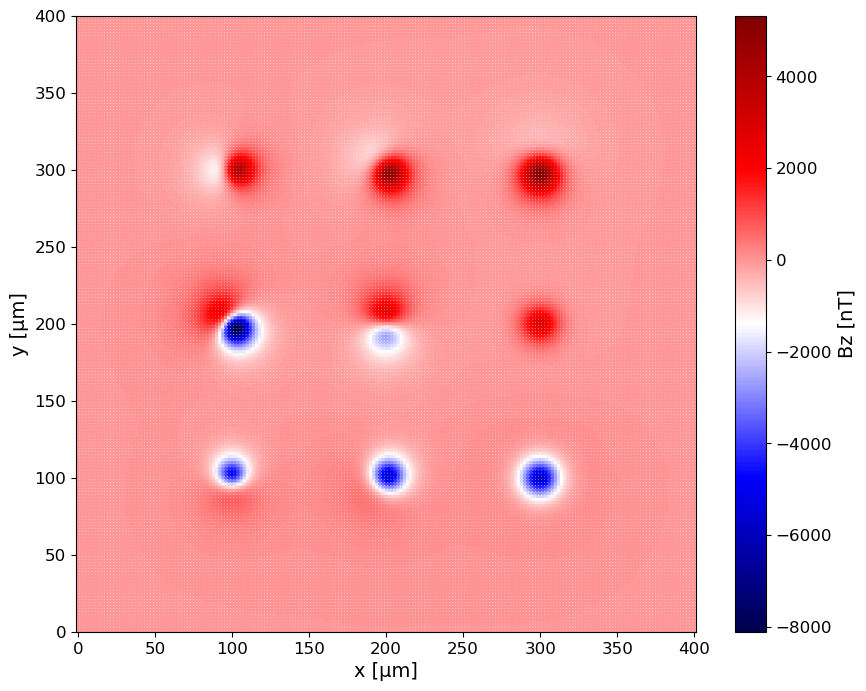

Grid dimensions: 201 201
(201, 201)
Plot saved to D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\2-Forward_Data\Clipped_bz.png


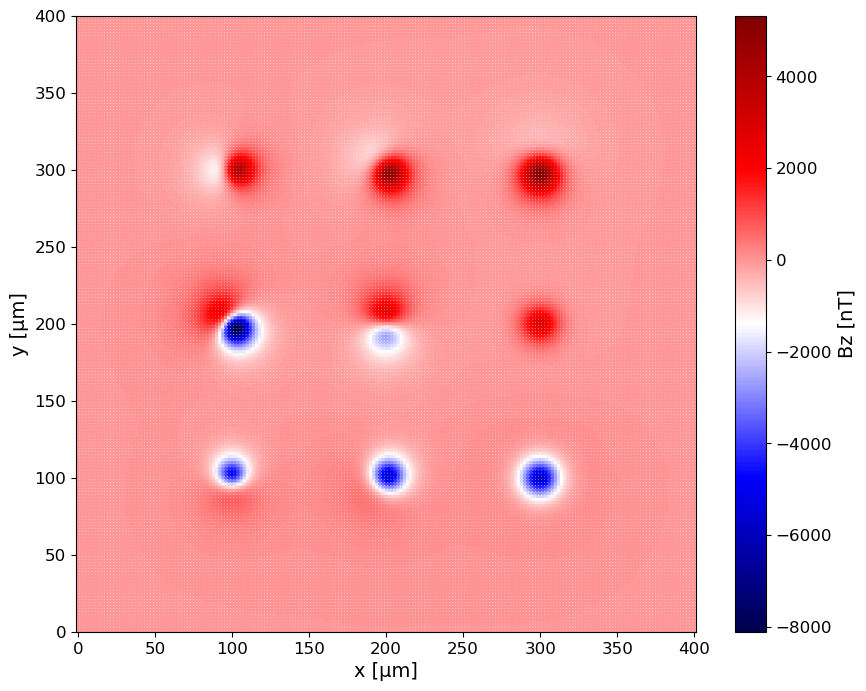

Xmin, Xmax = 0.0 400.0
Ymin, Ymax = 0.0 400.0
Ndata = 40401


In [12]:
#Data Perp. full scan ( or clip optional)
# Note this will overwrite the Synthetic Data which used to create the data ground
import os
import numpy as np
import matplotlib.pyplot as plt

base_dir = os.getcwd()  # current working directory
    
def plot_data(x_coords, y_coords, values, title, out_dir= os.path.join(base_dir, "2-Forward_Data")):
    # Make sure output directory exists
    os.makedirs(out_dir, exist_ok=True)

    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(x_coords, y_coords, c=values, cmap='seismic', s=3)#
    plt.axis('equal')
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    cbar = plt.colorbar(scatter)
    cbar.set_label('Bz [nT]', fontsize=14)
    cbar.ax.tick_params(labelsize=12)
    plt.xlabel('x [µm]', fontsize=14)
    plt.ylabel('y [µm]', fontsize=14)
    #plt.title(title)
    plt.margins(0)
    

    # Save plot to file
    filename = os.path.join(out_dir, f"{title.replace(' ', '_')}.png")
    plt.savefig(filename, dpi=300, bbox_inches="tight")
    print(f"Plot saved to {filename}")

    plt.show()
    
filename_z = os.path.join(base_dir, "2-Forward_Data","Tomofast_Output", "data", "mag_calc_prior_data.txt")
data_z = np.loadtxt(filename_z, skiprows=1)

#filename_z = os.path.join(base_dir, "Synthetic_Data", "dipole_field_Bz.csv")
#data_z = np.loadtxt(filename_z, delimiter=",", skiprows=1)

print(data_z.shape)

x_coords = data_z[:, 0]
y_coords = data_z[:, 1]
z_coords = data_z[:, 2]
z_coords = 0*data_z[:, 2] #Make Z=0

bz = data_z[:, 3]
#bz = -1*data_z[:, 3] #Flipping Bz for tomofast coordiante system Z is positive down, the QDM Bz is positive up

#bx = data_z[:, 3]
#by = data_z[:, 4]

#amplitude
#b_mag = np.sqrt(bx**2 + by**2 + bz**2)


# Plot the image of data.
plot_data(x_coords, y_coords, bz, 'bz')

#==============================================================
# Find unique coordinates to determine grid dimensions.
unique_x = np.unique(x_coords)
unique_y = np.unique(y_coords)

nx = len(unique_x)  # number of points in X direction
ny = len(unique_y)  # number of points in Y direction

print("Grid dimensions:", nx, ny)

x_coords = x_coords.reshape(ny, nx)
y_coords = y_coords.reshape(ny, nx)
z_coords = z_coords.reshape(ny, nx)

bz = bz.reshape(ny, nx)
#==============================================================
# Clipping the data.
#enter the cell index (given the one index equal 4.4 increment)
# to cover the full range (min → max)
x_start = 0
x_end   = nx
y_start = 0
y_end   = ny

x_coords = x_coords[y_start:y_end, x_start:x_end]
y_coords = y_coords[y_start:y_end, x_start:x_end]
z_coords = z_coords[y_start:y_end, x_start:x_end]
bz = bz[y_start:y_end, x_start:x_end]

print(bz.shape)

# Convert back to 1D array.
x_coords = x_coords.flatten()
y_coords = y_coords.flatten()
z_coords = z_coords.flatten()
bz = bz.flatten()

# Plot the image of data.
plot_data(x_coords, y_coords, bz, 'Clipped bz')

print('Xmin, Xmax =', np.min(x_coords), np.max(x_coords))
print('Ymin, Ymax =', np.min(y_coords), np.max(y_coords))

#==============================================================
# Write tomofast data grid.
# Bz only
data_combined = np.column_stack((x_coords, y_coords, z_coords, bz))
#data_combined = np.column_stack((x_coords, y_coords, z_coords, bx, by, bz))

Ndataz = len(bz)
print('Ndata =', Ndataz)

np.savetxt(os.path.join(base_dir, "2-Forward_Data", "Mag_Forward.obs"), data_combined, delimiter=' ', fmt="%f %f %f %f", header=str(Ndataz), comments='')


# 3-  3D Inversion

## a. Inversion

### 1. Anomalies Detection

In [13]:
# Create Folder
import os

base_dir = os.getcwd()
folder_path = os.path.join(base_dir, "4-3D_Inversion_Filtered")       

if os.path.exists(folder_path):
    print("Folder already exists:", folder_path)
else:
    os.mkdir(folder_path)
    print("Folder created:", folder_path)

Folder already exists: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered


(40401, 4)
Plot saved to D:\My_Work\Tomofast-x-µ\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\bz.png


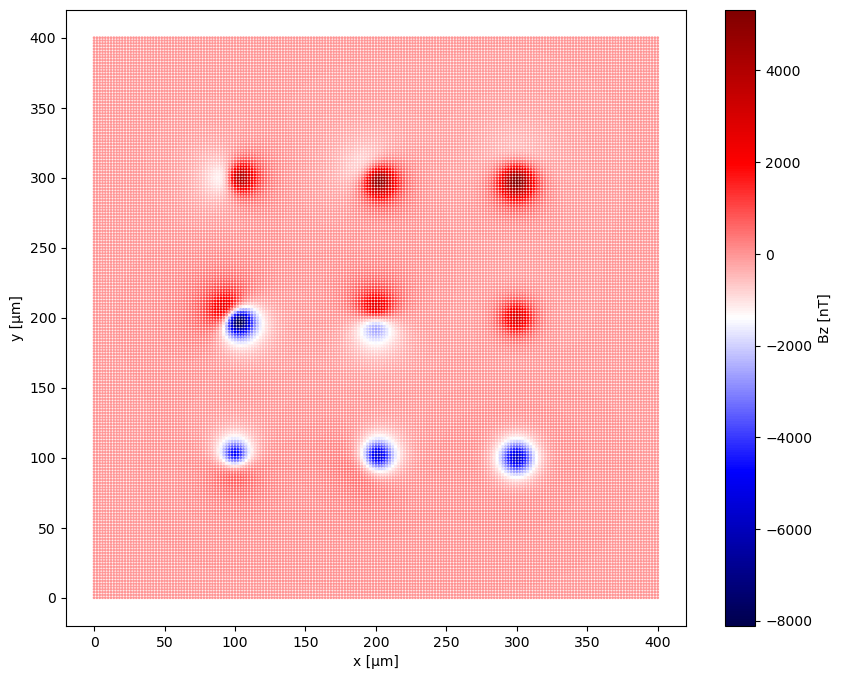

Grid dimensions: 201 201
(201, 201)
Plot saved to D:\My_Work\Tomofast-x-µ\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Clipped_bz.png


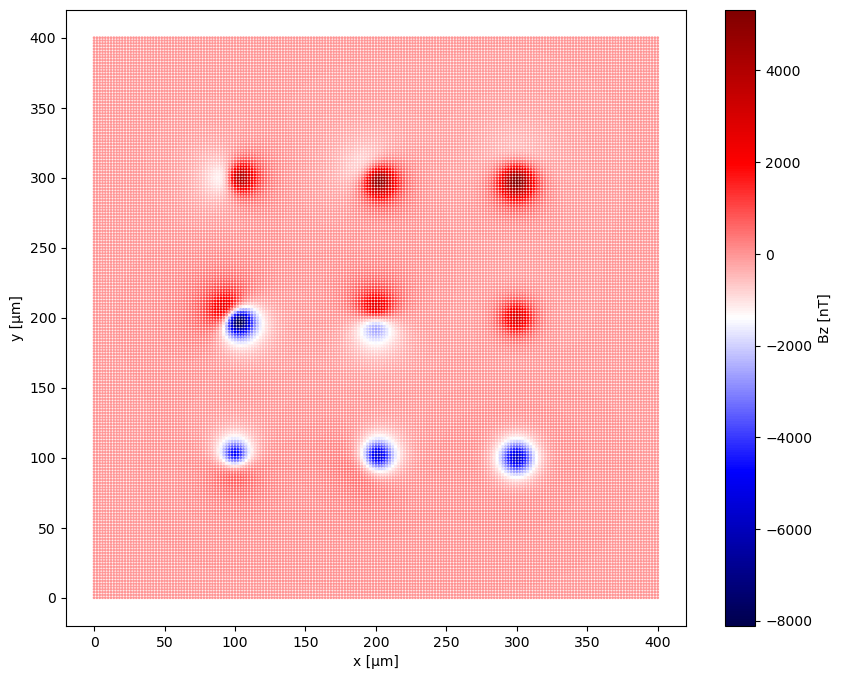

Xmin, Xmax = 0.0 400.0
Ymin, Ymax = 0.0 400.0
Ndata = 40401


In [9]:
#Data Perp. full scan ( or clip optional)
import os
import numpy as np
import matplotlib.pyplot as plt

base_dir = os.getcwd()  # current working directory
    
def plot_data(x_coords, y_coords, values, title, out_dir= os.path.join(base_dir, "4-3D_Inversion_Filtered")):
    #  output directory 
    os.makedirs(out_dir, exist_ok=True)

    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(x_coords, y_coords, c=values, cmap='seismic', s=1)#, vmax=500000, vmin=-500000)
    #plt.axis('equal')
    plt.colorbar(scatter, label='Bz [nT]')
    plt.xlabel('x [µm]')
    plt.ylabel('y [µm]')
    #plt.title(title)

    # Save plot to file
    filename = os.path.join(out_dir, f"{title.replace(' ', '_')}.png")
    plt.savefig(filename, dpi=300, bbox_inches="tight")
    print(f"Plot saved to {filename}")

    plt.show()
    
filename_z = os.path.join(base_dir, "2-Forward_Data","Tomofast_Output", "data", "mag_calc_prior_data.txt")
data_z = np.loadtxt(filename_z, skiprows=1)

#filename_z = os.path.join(base_dir, "NC07-002-26Bz_uc0.csv")
#data_z = np.loadtxt(filename_z, delimiter=",", skiprows=1)

print(data_z.shape)

x_coords = data_z[:, 0]
y_coords = data_z[:, 1]
z_coords = data_z[:, 2]
z_coords = 0*data_z[:, 2] #Make Z=0

#bz = data_z[:, 3] # dont flip  tomofast forwarded

bz = data_z[:, 3] #Flipping Bz for tomofast coordiante system Z is positive down, the QDM Bz is positive up

#bx = data_z[:, 3]
#by = data_z[:, 4]

#amplitude
#b_mag = np.sqrt(bx**2 + by**2 + bz**2)


# Plot the image of data.
plot_data(x_coords, y_coords, bz, 'bz')

#==============================================================
# Find unique coordinates to determine grid dimensions.
unique_x = np.unique(x_coords)
unique_y = np.unique(y_coords)

nx = len(unique_x)  # number of points in X direction
ny = len(unique_y)  # number of points in Y direction

print("Grid dimensions:", nx, ny)

x_coords = x_coords.reshape(ny, nx)
y_coords = y_coords.reshape(ny, nx)
z_coords = z_coords.reshape(ny, nx)

bz = bz.reshape(ny, nx)
#==============================================================
# Clipping the data.
#enter the cell index (given the one index equal 4.4 increment)
# to cover the full range (min → max)
x_start = 0
x_end   = nx
y_start = 0
y_end   = ny

x_coords = x_coords[y_start:y_end, x_start:x_end]
y_coords = y_coords[y_start:y_end, x_start:x_end]
z_coords = z_coords[y_start:y_end, x_start:x_end]
bz = bz[y_start:y_end, x_start:x_end]

print(bz.shape)

# Convert back to 1D array.
x_coords = x_coords.flatten()
y_coords = y_coords.flatten()
z_coords = z_coords.flatten()
bz = bz.flatten()

# Plot the image of data.
plot_data(x_coords, y_coords, bz, 'Clipped bz')

print('Xmin, Xmax =', np.min(x_coords), np.max(x_coords))
print('Ymin, Ymax =', np.min(y_coords), np.max(y_coords))

#==============================================================
# Write tomofast data grid.
# Bz only
data_combined = np.column_stack((x_coords, y_coords, z_coords, bz))
#data_combined = np.column_stack((x_coords, y_coords, z_coords, bx, by, bz))

Ndataz = len(bz)
print('Ndata =', Ndataz)

np.savetxt(os.path.join(base_dir, "4-3D_Inversion_Filtered", "Mag_Inversion.obs"), data_combined, delimiter=' ', fmt="%f %f %f %f", header=str(Ndataz), comments='')

Grid: 201 201
Blobs detected (raw): 9
Blob 1: 222 cells
Blob 2: 280 cells
Blob 3: 231 cells
Blob 4: 417 cells
Blob 5: 489 cells
Blob 6: 189 cells
Blob 7: 280 cells
Blob 8: 297 cells
Blob 9: 269 cells

Blob 1:
  X range: [74.000, 126.000] µm
  Y range: [66.000, 132.000] µm
  nx ny nz: 27 34 30
  nData   : 918
  Saved obs: D:\My_Work\Tomofast-x-µ\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Blob_Clipped_obs_RECT\Blob_001_RECT.obs

Blob 2:
  X range: [270.000, 330.000] µm
  Y range: [70.000, 130.000] µm
  nx ny nz: 31 31 30
  nData   : 961
  Saved obs: D:\My_Work\Tomofast-x-µ\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Blob_Clipped_obs_RECT\Blob_002_RECT.obs

Blob 3:
  X range: [176.000, 232.000] µm
  Y range: [76.000, 132.000] µm
  nx ny nz: 29 29 30
  nData   : 841
  Saved obs: D:\My_Work\Tomofast-x-µ\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Blob_Clipped_obs_RECT\Blob_003_RECT.obs

Blob 4:
  X range: [170.000, 230

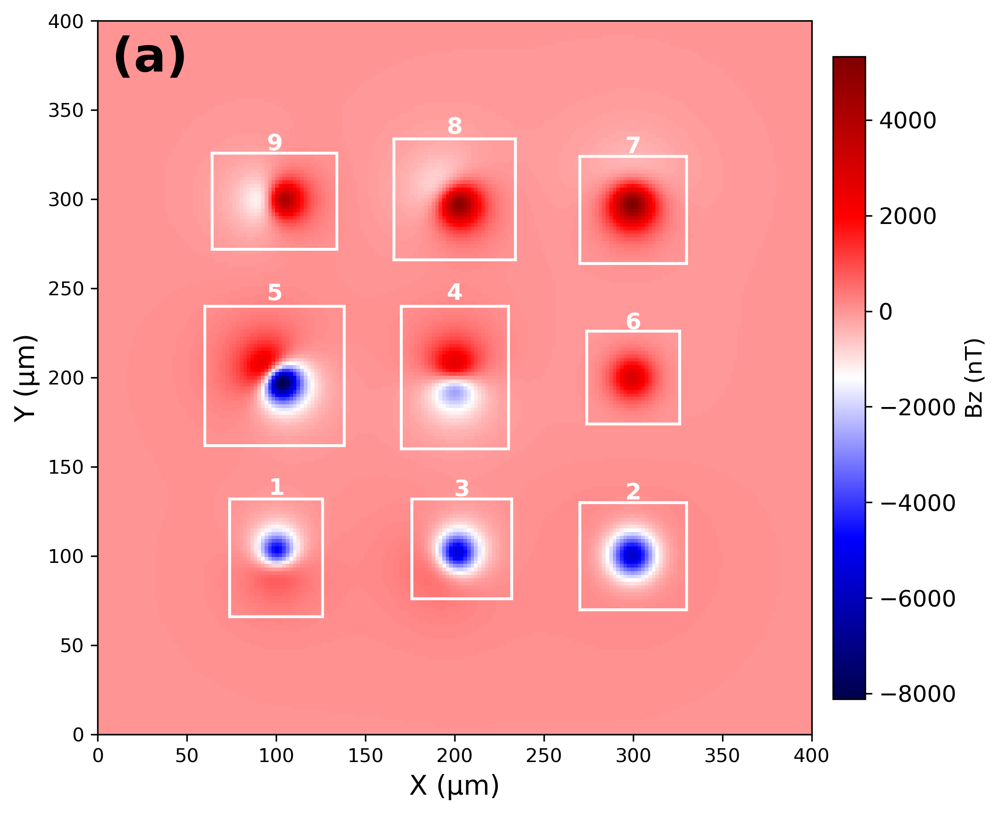


DONE
Kept blobs: 9
Obs folder: D:\My_Work\Tomofast-x-µ\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Blob_Clipped_obs_RECT
Windows file: D:\My_Work\Tomofast-x-µ\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\blob_windows.txt
Summary file: D:\My_Work\Tomofast-x-µ\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\blob_window_summary.txt


In [10]:
import os
import numpy as np
from scipy import ndimage as ndi
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from scipy.ndimage import binary_dilation

# ============================================================
# SETTINGS
# ============================================================
base_dir = os.getcwd()

threshold_factor = 1

PAD_X = 5   # extend rectangle in X (cols)
PAD_Y = 5   # extend rectangle in Y (rows)

MIN_BLOB_CELLS = 1   # ignore tiny blobs (set 1 to keep everything)
NZ_FIXED = 30        # nz for Tomofast (same for all blobs)

# ============================================================
# PATHS
# ============================================================
obs_path = os.path.join(base_dir, "4-3D_Inversion_Filtered", "Mag_Inversion.obs")

out_obs_dir = os.path.join(base_dir, "4-3D_Inversion_Filtered", "Blob_Clipped_obs_RECT")

# clear old outputs
if os.path.exists(out_obs_dir):
    for fname in os.listdir(out_obs_dir):
        fpath = os.path.join(out_obs_dir, fname)
        if os.path.isfile(fpath):
            os.remove(fpath)
else:
    os.makedirs(out_obs_dir)


# Output 1: blob windows (xmin xmax ymin ymax)
windows_path = os.path.join(base_dir, "4-3D_Inversion_Filtered", "blob_windows.txt")

# Output 2: summary for parfiles (nx ny nz ndata)
summary_path = os.path.join(base_dir, "4-3D_Inversion_Filtered", "blob_window_summary.txt")

# Write headers (overwrite each run)
with open(windows_path, "w") as fw:
    fw.write("# blob_id x_min x_max y_min y_max\n")

with open(summary_path, "w") as fs:
    fs.write("# blob_id nx ny nz ndata\n")

# ============================================================
# 1) READ OBS
# ============================================================
with open(obs_path, "r") as f:
    header_line = f.readline().strip()

data = np.loadtxt(obs_path, skiprows=1)
x  = data[:, 0]
y  = data[:, 1]
bz = data[:, 3]

# ============================================================
# 2) GRID RESHAPE
# ============================================================
nx = len(np.unique(x))
ny = len(np.unique(y))

# assumes grid-ordered obs
x_grid  = x.reshape(ny, nx)
y_grid  = y.reshape(ny, nx)
bz_grid = bz.reshape(ny, nx)

print("Grid:", nx, ny)

# ============================================================
# 3) DETECT BLOBS
# ============================================================
thr = threshold_factor * np.std(bz_grid)
mask = np.abs(bz_grid) > thr


# allows nearby high-amplitude regions to connect if they are spatially close.
structure = np.ones((3, 3))  # allows diagonal + small gaps
mask_dilated = binary_dilation(mask, structure=structure, iterations=1)

labels, n_blobs = ndi.label(mask_dilated)

# not merging .
#labels, n_blobs = ndi.label(mask)

print("Blobs detected (raw):", n_blobs)

sizes = ndi.sum(mask, labels, index=np.arange(1, n_blobs + 1))
for i, sz in enumerate(sizes, start=1):
    print(f"Blob {i}: {int(sz)} cells")

slices = ndi.find_objects(labels)

# ============================================================
# helper: write obs file with updated Ndata in header
# ============================================================
def write_obs(out_path, header, arr):
    parts = header.split()
    try:
        int(parts[0])           # if header starts with Ndata
        parts[0] = str(arr.shape[0])
        header = " ".join(parts)
    except:
        pass

    with open(out_path, "w") as f:
        f.write(header + "\n")
        np.savetxt(f, arr, fmt="%.6f")

# ============================================================
# 4) OVERVIEW PLOT
# ============================================================
plt.figure(figsize=(8, 6), dpi=300)
#im = plt.imshow(
#    bz_grid,
#    origin="lower",
#    extent=[x_grid.min(), x_grid.max(), y_grid.min(), y_grid.max()],
#    cmap="seismic",
 #   aspect="equal"
#)

im = plt.imshow(
    bz_grid,
    origin="lower",
    extent=[x_grid.min(), x_grid.max(), y_grid.min(), y_grid.max()],
    cmap="seismic",
    #vmin=bz_min,
   # vmax=bz_max,
    aspect="equal"
)

cbar = plt.colorbar(im, pad=0.02, shrink=0.9)
cbar.set_label("Bz (nT)", fontsize=12)
cbar.ax.tick_params(labelsize=12)

plt.xlabel("X (µm)", fontsize=14)
plt.ylabel("Y (µm)", fontsize=14)

ax = plt.gca()
ax.tick_params(axis="both", labelsize=10)
#ax.grid(True, linestyle="--", alpha=0.3)
ax.margins(0)
ax.text(
    0.02, 0.98, "(a)",
    transform=ax.transAxes,
    fontsize=25,
    fontweight="bold",
    va="top",
    ha="left"
)

plt.tight_layout()

# ============================================================
# 5) LOOP BLOBS: SAVE obs + SAVE windows + SAVE summary
# ============================================================
kept = 0

for i, sl in enumerate(slices, start=1):
    if sl is None:
        continue

    # skip tiny blobs
    if sizes[i-1] < MIN_BLOB_CELLS:
        print(f"Skipping Blob {i} (too small: {int(sizes[i-1])} cells)")
        continue

    ys, xs = sl
    r0, r1 = ys.start, ys.stop - 1
    c0, c1 = xs.start, xs.stop - 1

    # extend bbox (Y longer)
    r0e = max(0, r0 - PAD_Y)
    r1e = min(ny - 1, r1 + PAD_Y)
    c0e = max(0, c0 - PAD_X)
    c1e = min(nx - 1, c1 + PAD_X)

    # rectangular mask
    rect_mask = np.zeros((ny, nx), dtype=bool)
    rect_mask[r0e:r1e+1, c0e:c1e+1] = True

    # clip rows (RECTANGLE)
    blob_data = data[rect_mask.ravel(), :]

    # rectangle coords (µm)
    x_min = x_grid[r0e, c0e]
    x_max = x_grid[r1e, c1e]
    y_min = y_grid[r0e, c0e]
    y_max = y_grid[r1e, c1e]

    # window size in CELLS (for parfile modelGrid.size)
    nx_win = (c1e - c0e + 1)  # X = columns
    ny_win = (r1e - r0e + 1)  # Y = rows
    nz_win = NZ_FIXED

    # number of data points in clipped obs (for parfile nData)
    ndata = blob_data.shape[0]

    print(f"\nBlob {i}:")
    print(f"  X range: [{x_min:.3f}, {x_max:.3f}] µm")
    print(f"  Y range: [{y_min:.3f}, {y_max:.3f}] µm")
    print(f"  nx ny nz: {nx_win} {ny_win} {nz_win}")
    print(f"  nData   : {ndata}")

    # --------------------------
    # (A) SAVE BLOB OBS
    # --------------------------
    obs_out = os.path.join(out_obs_dir, f"Blob_{i:03d}_RECT.obs")
    write_obs(obs_out, header_line, blob_data)

    # --------------------------
    # (B) SAVE WINDOW FILE LINE
    # --------------------------
    with open(windows_path, "a") as fw:
        fw.write(f"{i} {x_min:.6f} {x_max:.6f} {y_min:.6f} {y_max:.6f}\n")

    # --------------------------
    # (C) SAVE SUMMARY FILE LINE
    # --------------------------
    with open(summary_path, "a") as fs:
        fs.write(f"{i} {nx_win} {ny_win} {nz_win} {ndata}\n")

    # draw rectangle + label on overview
    ax.add_patch(
        patches.Rectangle(
            (x_min, y_min),
            x_max - x_min, y_max - y_min,
            edgecolor="white", facecolor="none", linewidth=1.5
        )
    )
    ax.text(
        0.5*(x_min+x_max), y_max + 0.9 * (y_max - y_min) * 0.1, str(i),
       color="white", ha="center", va="center", fontsize=12, weight="bold"
    )

    kept += 1
    print("  Saved obs:", obs_out)

plt.tight_layout()
out_png = os.path.join(base_dir, "4-3D_Inversion_Filtered", "BZ_Blobs.png")
plt.savefig(out_png, dpi=300, bbox_inches='tight')
plt.show()

print("\n====================================")
print("DONE")
print("Kept blobs:", kept)
print("Obs folder:", out_obs_dir)
print("Windows file:", windows_path)
print("Summary file:", summary_path)
print("====================================")


### 3. Create Meshs

#### 3.1. Uniform

In [16]:
### Mesh Creation 
# uniform Mesh Grid create dipole center(s) cells 
import os
import numpy as np

base_dir = os.getcwd()

# -----------------------------
# INPUT: blob windows file
# -----------------------------
# Format per line:
# blob_id x_min x_max y_min y_max
windows_path = os.path.join(base_dir, "4-3D_Inversion_Filtered", "blob_windows.txt")

# -----------------------------
# OUTPUT folder for meshgrids
# -----------------------------
out_dir = os.path.join(base_dir, "4-3D_Inversion_Filtered", "Blob_Meshgrids")
os.makedirs(out_dir, exist_ok=True)

# -----------------------------
# Mesh settings (edit only these)
# -----------------------------
CELL = 2          # cell size (µm)
NZ   = 30           # number of cells in z
ZMIN = 0.0
ZMAX = NZ * CELL    # positive down

# ------------------------------------------------
# Write Tomofast meshgrid file (3-component model)
# ------------------------------------------------
def write_meshgrid_tomofast(filename, line_data):
    with open(filename, "w") as f:
        f.write(f"{line_data.shape[0]}\n")
        np.savetxt(
            f, line_data,
            fmt="%f %f %f %f %f %f %f %f %f %d %d %d"  # 3-comp model
        )

# ------------------------------------------------
# Build uniform grid for one window
# ------------------------------------------------
def build_mesh_for_window(x_min, x_max, y_min, y_max, out_file,
                          cell=CELL, nz=NZ, zmin=ZMIN):
    # Expand half-cell so points fall inside cells nicely
    x0 = x_min - 0.5 * cell
    x1 = x_max + 0.5 * cell
    y0 = y_min - 0.5 * cell
    y1 = y_max + 0.5 * cell

    nx = int(np.round((x1 - x0) / cell))
    ny = int(np.round((y1 - y0) / cell))



    # cell centers
    xc = x0 + (np.arange(nx) + 0.5) * cell
    yc = y0 + (np.arange(ny) + 0.5) * cell
    zc = zmin + (np.arange(nz) + 0.5) * cell

    # indices start at 1 for Tomofast
    i_idx = np.arange(1, nx + 1)
    j_idx = np.arange(1, ny + 1)
    k_idx = np.arange(1, nz + 1)

    # create 3D grid (same ordering as your old script idea)
    Yc, Zc, Xc = np.meshgrid(yc, zc, xc)          # shapes (nz, ny, nx)
    J,  K,  I  = np.meshgrid(j_idx, k_idx, i_idx) # shapes (nz, ny, nx)

    Xc = Xc.ravel(); Yc = Yc.ravel(); Zc = Zc.ravel()
    I  = I.ravel();  J  = J.ravel();  K  = K.ravel()

    # cell bounds
    X1 = Xc - 0.5 * cell
    X2 = Xc + 0.5 * cell
    Y1 = Yc - 0.5 * cell
    Y2 = Yc + 0.5 * cell
    Z1 = Zc - 0.5 * cell
    Z2 = Zc + 0.5 * cell

    zeros = np.zeros_like(Xc)

    # 3-comp model format
    line_data = np.vstack([
        X1, X2, Y1, Y2, Z1, Z2,
        zeros, zeros, zeros,
        I, J, K
    ]).T

    write_meshgrid_tomofast(out_file, line_data)
    return nx, ny, nz

# ------------------------------------------------
# MAIN
# ------------------------------------------------
windows = np.loadtxt(windows_path, comments="#", ndmin=2)

print("Windows loaded:", windows.shape[0])
print("Output folder:", out_dir)

for row in windows:
    blob_id = int(row[0])
    x_min, x_max, y_min, y_max = row[1], row[2], row[3], row[4]

    out_file = os.path.join(out_dir, f"Meshgrid_Blob_{blob_id:03d}.txt")

    nx, ny, nz = build_mesh_for_window(x_min, x_max, y_min, y_max, out_file)

    print(f"Blob {blob_id:03d}: X[{x_min:.2f},{x_max:.2f}] "
          f"Y[{y_min:.2f},{y_max:.2f}] -> nx={nx}, ny={ny}, nz={nz}")
    print("  saved:", out_file)

print("\nDone.")


Windows loaded: 9
Output folder: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Blob_Meshgrids
Blob 001: X[74.00,126.00] Y[66.00,132.00] -> nx=27, ny=34, nz=30
  saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Blob_Meshgrids\Meshgrid_Blob_001.txt
Blob 002: X[270.00,330.00] Y[70.00,130.00] -> nx=31, ny=31, nz=30
  saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Blob_Meshgrids\Meshgrid_Blob_002.txt
Blob 003: X[176.00,232.00] Y[76.00,132.00] -> nx=29, ny=29, nz=30
  saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Blob_Meshgrids\Meshgrid_Blob_003.txt
Blob 004: X[170.00,230.00] Y[160.00,240.00] -> nx=31, ny=41, nz=30
  saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Blob_Meshgrids\Meshgrid_Blob_004.txt
Blob 005: X[60.00,138.00] Y[162.00,240.00] -> nx=40, ny=40, nz=30
  saved: D:\M

#### 3.2. Non-Uniform

### 4. Create Parfiles

In [17]:
# Create Folder
import os

base_dir = os.getcwd()
folder_path = os.path.join(base_dir, "0-Parfiles")       

if os.path.exists(folder_path):
    print("Folder already exists:", folder_path)
else:
    os.mkdir(folder_path)
    print("Folder created:", folder_path)

Folder already exists: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\0-Parfiles


In [18]:
import os
import numpy as np

base_dir = os.getcwd()

# ------------------------------------------------
# INPUT: window summary file
# ------------------------------------------------
# Format:
# blob_id nx ny nz ndata
summary_path = os.path.join(
    base_dir,
    "4-3D_Inversion_Filtered",
    "blob_window_summary.txt"
)

# ------------------------------------------------
# OUTPUT: parfiles
# ------------------------------------------------
par_out_dir = os.path.join(base_dir, "0-Parfiles")
os.makedirs(par_out_dir, exist_ok=True)

# ------------------------------------------------
# Parfile template 
# ------------------------------------------------
PAR_TEMPLATE = """==================================================================================
GLOBAL
==================================================================================
global.outputFolderPath         = ./output/QDM/Blob_{blob_id:03d}
global.description              = QDM inversion – Blob {blob_id}

==================================================================================
MODEL GRID parameters
==================================================================================
# nx ny nz
modelGrid.size                        = {nx} {ny} {nz}
modelGrid.magn.file                   = data/QDM/Meshgrid_Blob_{blob_id:03d}.txt
modelGrid.magn.nModelComponents       = 3

==================================================================================
DATA parameters
==================================================================================
forward.data.magn.nData                = {ndata}
forward.data.magn.dataGridFile         = data/QDM/Blob_{blob_id:03d}_RECT.obs
forward.data.magn.dataValuesFile       = data/QDM/Blob_{blob_id:03d}_RECT.obs
forward.data.magn.nDataComponents      = 1

==================================================================================
MAGNETIC FIELD constants
==================================================================================
forward.magneticField.inclination              = 90.0
forward.magneticField.declination              = 0.0
forward.magneticField.XaxisDeclination         = 0.d0

==================================================================================
DEPTH WEIGHTING
==================================================================================
# 1-depth weight, 2-distance weight.
forward.depthWeighting.type                    = 1

==================================================================================
SENSITIVITY KERNEL
==================================================================================
sensit.readFromFiles                  = 0
sensit.folderPath                     = ./output/QDM/SENSIT/

==================================================================================
MATRIX COMPRESSION
==================================================================================
forward.matrixCompression.type                        = 1
forward.matrixCompression.rate                        = 0.1

==================================================================================
PRIOR MODEL
==================================================================================
inversion.priorModel.type                  = 1
inversion.priorModel.magn.value            = 0.000000

==================================================================================
INVERSION parameters
==================================================================================
inversion.nMajorIterations              = 3
inversion.nMinorIterations              = 100

==================================================================================
MODEL DAMPING (m - m_prior)
==================================================================================
inversion.modelDamping.magn.weight      = 0.0

==================================================================================
JOINT INVERSION parameters
==================================================================================
inversion.joint.grav.problemWeight      = 0.00000000
inversion.joint.magn.problemWeight      = 1.00000000
"""

# ------------------------------------------------
# LOAD SUMMARY + WRITE PARFILES
# ------------------------------------------------
summary = np.loadtxt(summary_path, comments="#", ndmin=2)

print("Creating Parfiles...")

for row in summary:
    blob_id = int(row[0])
    nx      = int(row[1])
    ny      = int(row[2])
    nz      = int(row[3])
    ndata   = int(row[4])

    par_text = PAR_TEMPLATE.format(
        blob_id=blob_id,
        nx=nx,
        ny=ny,
        nz=nz,
        ndata=ndata
    )

    out_path = os.path.join(
        par_out_dir,
        f"Parfile_QDM_Inversion_Blob_{blob_id:03d}.txt"
    )

    with open(out_path, "w") as f:
        f.write(par_text)

    print(f"  Blob {blob_id:03d}: nx={nx}, ny={ny}, nz={nz}, nData={ndata}")
    print("    ->", out_path)

print("\nDone. Parfiles written to:", par_out_dir)


Creating Parfiles...
  Blob 001: nx=27, ny=34, nz=30, nData=918
    -> D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\0-Parfiles\Parfile_QDM_Inversion_Blob_001.txt
  Blob 002: nx=31, ny=31, nz=30, nData=961
    -> D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\0-Parfiles\Parfile_QDM_Inversion_Blob_002.txt
  Blob 003: nx=29, ny=29, nz=30, nData=841
    -> D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\0-Parfiles\Parfile_QDM_Inversion_Blob_003.txt
  Blob 004: nx=31, ny=41, nz=30, nData=1271
    -> D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\0-Parfiles\Parfile_QDM_Inversion_Blob_004.txt
  Blob 005: nx=40, ny=40, nz=30, nData=1600
    -> D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\0-Parfiles\Parfile_QDM_Inversion_Blob_005.txt
  Blob 006: nx=27, ny=27, nz=30, nData=729
    -> D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\0-Parfiles\Parfile_QDM_Inversion_Blob_006.txt
  Blob 007: nx=31, ny=31, nz=30, nD

### 5. Run Tomofast

In [19]:
import os
import glob
import subprocess
import sys

# -----------------------------
# SETTINGS (edit these)
# -----------------------------
TOMOFAST_HOME_WSL = "/home/abekhit/Tomofast-X"
WSL = r"C:\Windows\System32\wsl.exe"
NPROC = 7  # mpirun -np

# Where  blob files are (Windows paths)
BASE_DIR = os.getcwd()

OBS_DIR  = os.path.join(BASE_DIR, "4-3D_Inversion_Filtered", "Blob_Clipped_obs_RECT")
MESH_DIR = os.path.join(BASE_DIR, "4-3D_Inversion_Filtered","Blob_Meshgrids")               # change if different
PAR_DIR  = os.path.join(BASE_DIR, "0-Parfiles")

# Where to copy outputs back (Windows)
OUT_WIN_ROOT = os.path.join(BASE_DIR,  "4-3D_Inversion_Filtered","Tomofast_Output_Blobs")
os.makedirs(OUT_WIN_ROOT, exist_ok=True)

print("Base dir:", BASE_DIR)
print("Obs dir :", OBS_DIR)
print("Mesh dir:", MESH_DIR)
print("Par dir :", PAR_DIR)
print("Out dir :", OUT_WIN_ROOT)

# -----------------------------
# Helpers
# -----------------------------
def to_wsl_path(win_path: str) -> str:
    win_path = win_path.replace("\\", "/")
    drive = win_path[0].lower()
    rest = win_path[2:]
    return f"/mnt/{drive}/{rest}"

def run_live(cmd):
    """Run WSL bash command with live output."""
    p = subprocess.Popen(
        [WSL, "bash", "-lc", cmd],
        stdout=subprocess.PIPE,
        stderr=subprocess.STDOUT,
        text=True,
        bufsize=1
    )
    for line in p.stdout:
        print(line, end="")
        sys.stdout.flush()
    p.wait()
    print(f"\n[Return code: {p.returncode}]\n")
    if p.returncode != 0:
        raise RuntimeError(f"Command failed: {cmd}")

# -----------------------------
# Find blob IDs from obs files
# -----------------------------
obs_files = sorted(glob.glob(os.path.join(OBS_DIR, "Blob_*_RECT.obs")))
if not obs_files:
    raise FileNotFoundError(f"No blob obs found in: {OBS_DIR}")

def blob_id_from_name(path):
    # Blob_001_RECT.obs -> 1
    name = os.path.basename(path)
    return int(name.split("_")[1])

blob_ids = [blob_id_from_name(f) for f in obs_files]
print("Found blobs:", blob_ids)

# WSL versions of key paths
OBS_DIR_WSL  = to_wsl_path(OBS_DIR)
MESH_DIR_WSL = to_wsl_path(MESH_DIR)
PAR_DIR_WSL  = to_wsl_path(PAR_DIR)
OUT_WIN_WSL  = to_wsl_path(OUT_WIN_ROOT)

# -----------------------------
# Loop over blobs
# -----------------------------
for bid in blob_ids:
    print("\n=======================================================")
    print(f"RUNNING BLOB {bid:03d}")
    print("=======================================================\n")

    # Filenames for this blob (Windows)
    obs_win  = os.path.join(OBS_DIR,  f"Blob_{bid:03d}_RECT.obs")
    mesh_win = os.path.join(MESH_DIR, f"Meshgrid_Blob_{bid:03d}.txt")
    par_win  = os.path.join(PAR_DIR,  f"Parfile_QDM_Inversion_Blob_{bid:03d}.txt")

    # Check they exist
    if not os.path.exists(obs_win):
        raise FileNotFoundError(obs_win)
    if not os.path.exists(mesh_win):
        raise FileNotFoundError(mesh_win)
    if not os.path.exists(par_win):
        raise FileNotFoundError(par_win)

    # Filenames in WSL (source)
    obs_wsl  = f"{OBS_DIR_WSL}/Blob_{bid:03d}_RECT.obs"
    mesh_wsl = f"{MESH_DIR_WSL}/Meshgrid_Blob_{bid:03d}.txt"
    par_wsl  = f"{PAR_DIR_WSL}/Parfile_QDM_Inversion_Blob_{bid:03d}.txt"

    # Where they go inside Tomofast (fixed names expected by  parfile)
    # IMPORTANT:  parfiles should reference:
    #   data/QDM/Blob_XXX_RECT.obs
    #   data/QDM/Meshgrid_Blob_XXX.txt
    # and parfile name itself in parfiles/
    run_live(f"cp '{par_wsl}'  {TOMOFAST_HOME_WSL}/parfiles/")
    run_live(f"cp '{obs_wsl}'  {TOMOFAST_HOME_WSL}/data/QDM/")
    run_live(f"cp '{mesh_wsl}' {TOMOFAST_HOME_WSL}/data/QDM/")

    # (Optional) clean previous output to avoid mixing
    run_live(f"rm -rf {TOMOFAST_HOME_WSL}/output/QDM/*")

    # Run Tomofast for this blob
    par_name = f"Parfile_QDM_Inversion_Blob_{bid:03d}.txt"
    log_name = f"QDM_log_Blob_{bid:03d}.txt"
    run_live(
        f"cd {TOMOFAST_HOME_WSL} && "
        f"mpirun -np {NPROC} ./tomofastx -p ./parfiles/{par_name} | tee ./output/QDM/{log_name}"
    )

    # Copy outputs back to Windows into a separate folder per blob
    out_blob_win = os.path.join(OUT_WIN_ROOT, f"Blob_{bid:03d}")
    os.makedirs(out_blob_win, exist_ok=True)
    out_blob_wsl = to_wsl_path(out_blob_win)

    # Copy everything from output/QDM into this blob folder
    #run_live(f"cp -r {TOMOFAST_HOME_WSL}/output/QDM/* '{out_blob_wsl}/'")
       
    # Copy everything from output/QDM into this blob folder excluding SENSIT
    run_live(
    f"rsync -av --exclude='SENSIT/' "
    f"{TOMOFAST_HOME_WSL}/output/QDM/ '{out_blob_wsl}/'"
    )

    print(f"\n Finished Blob {bid:03d}. Outputs -> {out_blob_win}\n")

print("\nALL BLOBS DONE.")


Base dir: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario
Obs dir : D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Blob_Clipped_obs_RECT
Mesh dir: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Blob_Meshgrids
Par dir : D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\0-Parfiles
Out dir : D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs
Found blobs: [1, 2, 3, 4, 5, 6, 7, 8, 9]

RUNNING BLOB 001


[Return code: 0]


[Return code: 0]


[Return code: 0]


[Return code: 0]

 MEMORY USED (mpi init) [GB] =   3.2135963439941406E-002
 Started Tomofast-x, version >= 2.0.8.4
 global.outputFolderPath =./output/QDM/Blob_001
 global.description = QDM inversion – Blob 1
 modelGrid.size =          27          34          30
 modelGrid.magn.file =data/QDM/Meshgrid_Blob_001.txt
 modelGrid.magn.nModelComponents =           3
 forward.data.magn.nDat

### 6. Models Misfits

Found blobs: ['Blob_001', 'Blob_002', 'Blob_003', 'Blob_004', 'Blob_005', 'Blob_006', 'Blob_007', 'Blob_008', 'Blob_009']

Processing Blob_001


C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))
C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))
C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))


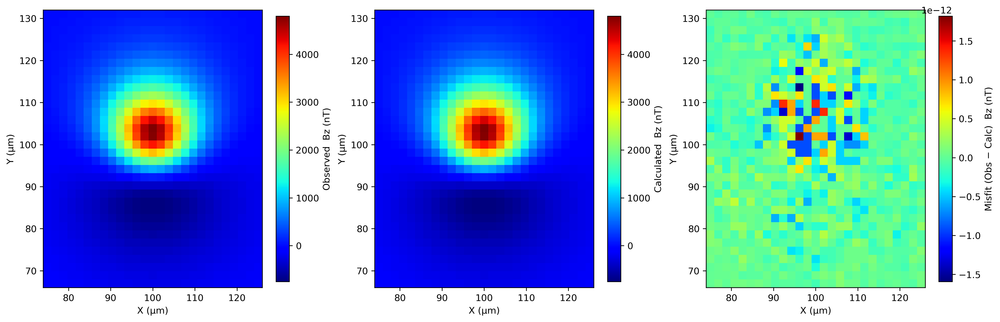

   Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001_misfit.png

Processing Blob_002


C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))
C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))
C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))


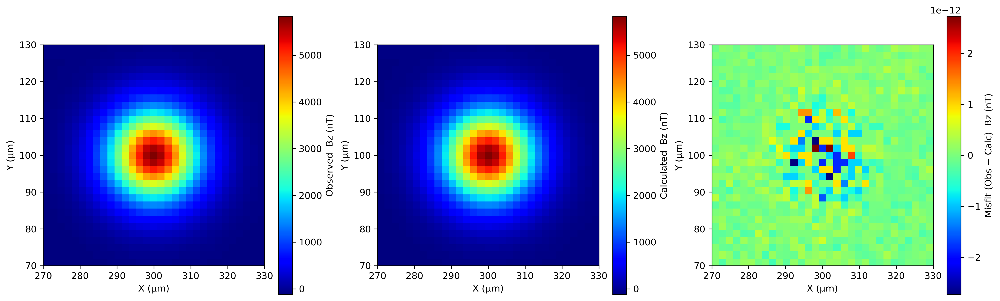

   Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_002\Blob_002_misfit.png

Processing Blob_003


C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))
C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))
C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))


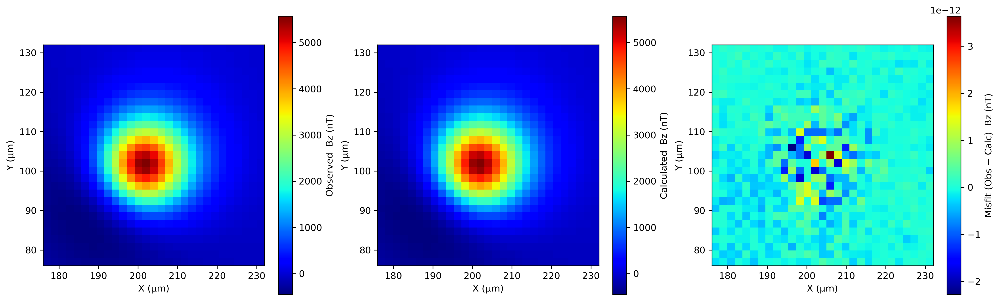

   Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_003\Blob_003_misfit.png

Processing Blob_004


C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))
C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))
C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))


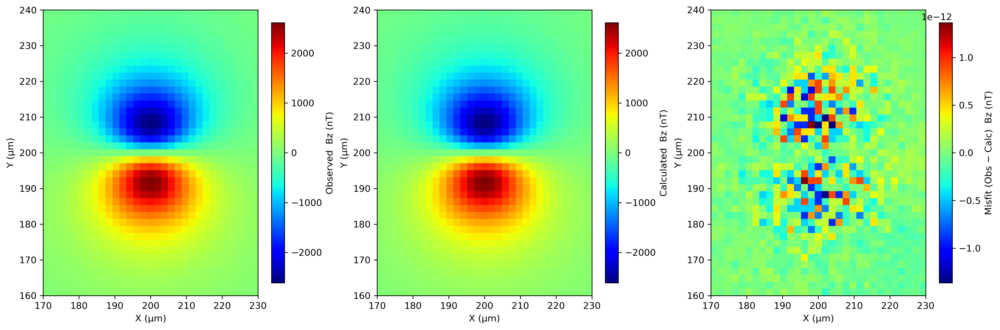

   Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_004\Blob_004_misfit.png

Processing Blob_005


C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))
C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))
C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))


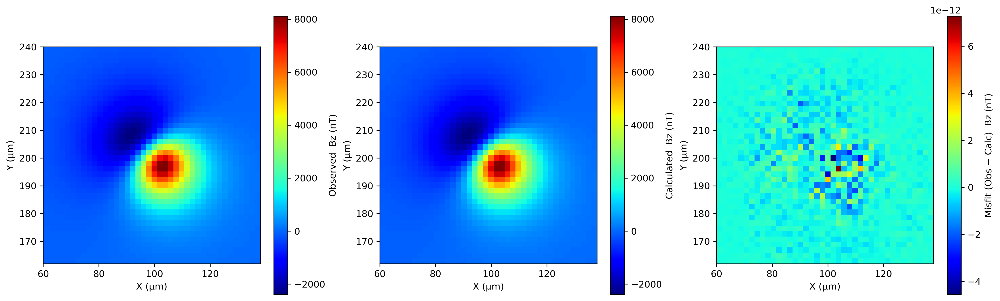

   Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_005\Blob_005_misfit.png

Processing Blob_006


C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))
C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))
C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))


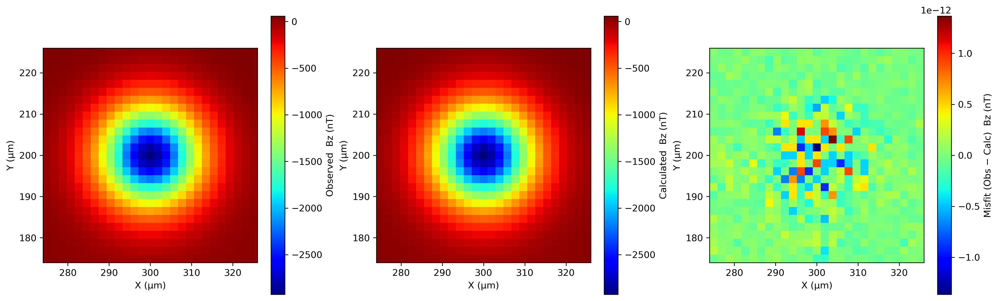

   Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_006\Blob_006_misfit.png

Processing Blob_007


C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))
C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))
C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))


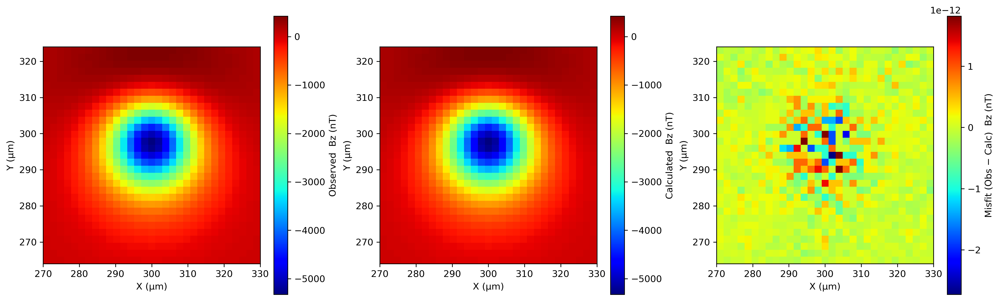

   Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_007\Blob_007_misfit.png

Processing Blob_008


C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))
C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))
C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))


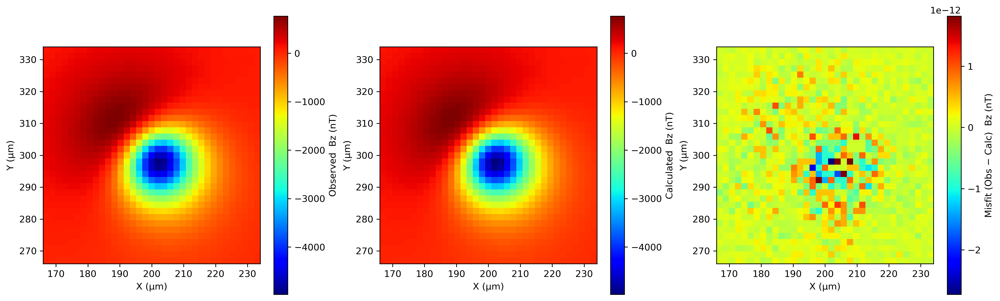

   Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_008\Blob_008_misfit.png

Processing Blob_009


C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))
C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))
C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\754618947.py:17: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  return pd.read_csv(path, delim_whitespace=True, names=list(names))


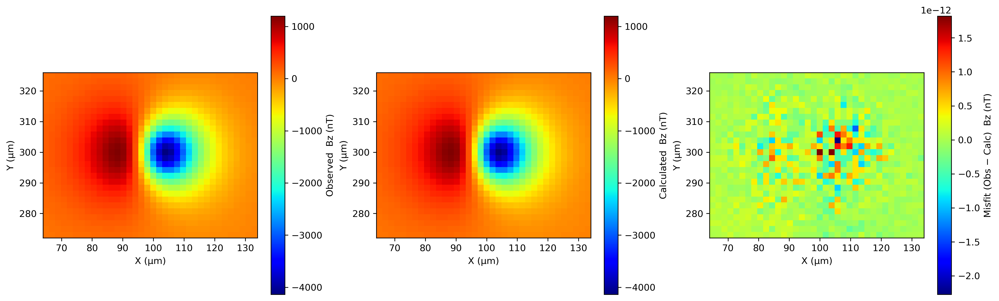

   Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_009\Blob_009_misfit.png

All blob misfit plots done.


In [20]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

base_dir = os.getcwd()

# ------------------------------------------------
# Root folder containing Blob_XXX subfolders
# ------------------------------------------------
root_out = os.path.join(base_dir, "4-3D_Inversion_Filtered", "Tomofast_Output_Blobs")

# ------------------------------------------------
# Helpers
# ------------------------------------------------
def load_field_table(path, names=("x", "y", "z", "value")):
    return pd.read_csv(path, delim_whitespace=True, names=list(names))

def clean_df(df):
    df["x"] = pd.to_numeric(df["x"], errors="coerce")
    df["y"] = pd.to_numeric(df["y"], errors="coerce")
    df["value"] = pd.to_numeric(df["value"], errors="coerce")
    df = df.dropna(subset=["x", "y", "value"])
    df = df[np.isfinite(df["x"]) & np.isfinite(df["y"]) & np.isfinite(df["value"])]
    return df

def df_to_grid(df):
    xs = np.sort(df["x"].unique())
    ys = np.sort(df["y"].unique())
    if xs.size == 0 or ys.size == 0:
        return None, None, None
    grid = df.pivot_table(index="y", columns="x", values="value")
    grid = grid.reindex(index=ys, columns=xs)
    return grid.values, xs, ys

# ------------------------------------------------
# Loop over blobs
# ------------------------------------------------
blob_dirs = sorted(d for d in os.listdir(root_out) if d.startswith("Blob_"))

print("Found blobs:", blob_dirs)

for blob in blob_dirs:
    print(f"\nProcessing {blob}")

    data_dir = os.path.join(root_out, blob, blob, "data")

    obs_file    = os.path.join(data_dir, "mag_observed_data.txt")
    calc_file   = os.path.join(data_dir, "mag_calc_final_data.txt")
    misfit_file = os.path.join(data_dir, "mag_misfit_final_data.txt")

    # check files exist (skip blob if any missing)
    missing = False
    for f in [obs_file, calc_file, misfit_file]:
        if not os.path.exists(f):
            print("   Missing:", f)
            missing = True
    if missing:
        continue

    # load + clean
    obs_df    = clean_df(load_field_table(obs_file))
    calc_df   = clean_df(load_field_table(calc_file))
    misfit_df = clean_df(load_field_table(misfit_file))

    if obs_df.empty or calc_df.empty or misfit_df.empty:
        print(f"   Empty/invalid data after cleaning for {blob}, skipping.")
        continue

    # grid
    obs_grid, xs, ys      = df_to_grid(obs_df)
    calc_grid, xs2, ys2   = df_to_grid(calc_df)
    misfit_grid, xs3, ys3 = df_to_grid(misfit_df)

    if obs_grid is None or calc_grid is None or misfit_grid is None:
        print(f"   No valid grid for {blob}, skipping.")
        continue

    # use observed grid coords for extent (paper axes in Mm)
    extent = [xs.min(), xs.max(), ys.min(), ys.max()]
    if not np.all(np.isfinite(extent)):
        print(f"   Bad extent (NaN/Inf) for {blob}, skipping.")
        continue

    # ------------------------------------------------
    # Plot 3-panel figure
    # ------------------------------------------------
    fig, axes = plt.subplots(1, 3, figsize=(15, 5), dpi=300)

    for ax, grid, cbar_label in zip(
        axes,
        [obs_grid, calc_grid, misfit_grid],
        ["Observed", "Calculated", "Misfit (Obs − Calc)"]
    ):
        im = ax.imshow(
            grid,
            origin="lower",
            cmap="jet",
            extent=extent,
            aspect="equal"
        )

    
        ax.set_xlabel("X (µm)")
        ax.set_ylabel("Y (µm)")
        ax.margins(0)

        cbar = plt.colorbar(im, ax=ax, shrink=0.85)
        #cbar.set_label(cbar_label)
        cbar.set_label(f"{cbar_label}  Bz (nT)")


    plt.tight_layout(pad=0.2)

    # save per blob
    out_png = os.path.join(root_out, blob, f"{blob}_misfit.png")
    plt.savefig(out_png, dpi=300, bbox_inches="tight")
    plt.show()

    print(f"   Saved: {out_png}")

print("\nAll blob misfit plots done.")


### 7. 3D Grains Detection

In [21]:
# grains extraction
import os
import numpy as np
import pandas as pd
from scipy.ndimage import label, generate_binary_structure

base_dir = os.getcwd()

# ------------------------------------------------------------
# EDIT THESE PATHS TO MATCH YOUR PROJECT
# ------------------------------------------------------------
# Root folder that contains Blob_001, Blob_002, ...
BLOB_ROOT = os.path.join(base_dir, "4-3D_Inversion_Filtered","Tomofast_Output_Blobs")

# Folder that contains Meshgrid_Blob_001.txt, Meshgrid_Blob_002.txt, ...
MESH_ROOT = os.path.join(base_dir, "4-3D_Inversion_Filtered","Blob_Meshgrids")

# thresholds
threshold_list = np.arange(0.1, 1.0, 0.1)  # 0.1..0.9

# 26-connectivity in 3D
structure = generate_binary_structure(3, 3)

# ------------------------------------------------------------
# LOOP BLOBS
# ------------------------------------------------------------
blob_dirs = sorted(
    d for d in os.listdir(BLOB_ROOT)
    if d.startswith("Blob_") and os.path.isdir(os.path.join(BLOB_ROOT, d))
)

print("Found blobs:", blob_dirs)

for blob in blob_dirs:
    print("\n===================================================")
    print("Processing", blob)
    print("===================================================")

    # Your structure: Blob_001/Blob_001/model/...
    model_file = os.path.join(BLOB_ROOT, blob, blob, "model", "mag_final_model_full.txt")
    mesh_file  = os.path.join(MESH_ROOT, f"Meshgrid_Blob_{blob.split('_')[1]}.txt")  # uses 001 etc.

    if not os.path.exists(model_file):
        print("   Missing model:", model_file)
        continue
    if not os.path.exists(mesh_file):
        print("  Missing mesh :", mesh_file)
        continue

    # ------------------------------------------------------------
    # 1) Load magnetization model
    # ------------------------------------------------------------
    data = np.genfromtxt(model_file, skip_header=1)

    # Tomofast model file expected columns: Mx My Mz ...
    Mx = data[:, 0]
    My = data[:, 1]
    Mz = data[:, 2]

    mag = np.sqrt(Mx**2 + My**2 + Mz**2)

    # ------------------------------------------------------------
    # 2) Load mesh (cell bounds) -> centers
    # ------------------------------------------------------------
    mesh = np.genfromtxt(mesh_file, skip_header=1)

    x_centers = (mesh[:, 0] + mesh[:, 1]) / 2
    y_centers = (mesh[:, 2] + mesh[:, 3]) / 2
    z_centers = (mesh[:, 4] + mesh[:, 5]) / 2

    # Infer nx, ny, nz from mesh size (IMPORTANT for per-blob)
    n_cells = mesh.shape[0]
    # For uniform grids: n_cells = nx * ny * nz
    nx = len(np.unique(x_centers))
    ny = len(np.unique(y_centers))
    nz = int(n_cells / (nx * ny))

    if nx * ny * nz != n_cells:
        print(f"   Cannot infer nx,ny,nz correctly for {blob}.")
        print(f"     nx*ny*nz={nx*ny*nz} but n_cells={n_cells}")
        continue

    print(f"  Mesh dims inferred: nx={nx}, ny={ny}, nz={nz}")

    # ------------------------------------------------------------
    # LOOP THRESHOLDS
    # ------------------------------------------------------------
    for threshold_per in threshold_list:
        print(f"   -> threshold = {threshold_per:.1f}")

        threshold = threshold_per * mag.max()
        mask = mag > threshold

        # reshape into (nz, ny, nx) like your original script
        mask_3d = mask.reshape((nz, ny, nx))

        labeled_grains_3d, num_grains = label(mask_3d, structure=structure)
        print(f"      grains detected: {num_grains}")

        # dataframe
        df = pd.DataFrame({
            "X": x_centers.ravel(),
            "Y": y_centers.ravel(),
            "Z": -1 * z_centers.ravel(),     # keep your sign convention
            "GrainID": labeled_grains_3d.ravel(),
            "Mx": Mx,
            "My": My,
            "Mz": Mz
        })

        df = df[df["GrainID"] != 0]

        # save inside each blob folder
        out_folder = os.path.join(BLOB_ROOT, blob, blob, "Grains_detection")
        os.makedirs(out_folder, exist_ok=True)

        csv_file = os.path.join(out_folder, f"grain_labels_{threshold_per:.1f}.csv")
        df.to_csv(csv_file, index=False)

        print(f"      saved: {csv_file}")

print("\nDONE.")


Found blobs: ['Blob_001', 'Blob_002', 'Blob_003', 'Blob_004', 'Blob_005', 'Blob_006', 'Blob_007', 'Blob_008', 'Blob_009']

Processing Blob_001
  Mesh dims inferred: nx=27, ny=34, nz=30
   -> threshold = 0.1
      grains detected: 1
      saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection\grain_labels_0.1.csv
   -> threshold = 0.2
      grains detected: 12
      saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection\grain_labels_0.2.csv
   -> threshold = 0.3
      grains detected: 2
      saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection\grain_labels_0.3.csv
   -> threshold = 0.4
      grains detected: 3
      saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\

In [22]:
# grains extraction largest picking
import os
import numpy as np
import pandas as pd
from scipy.ndimage import label, generate_binary_structure

base_dir = os.getcwd()

# ------------------------------------------------------------
# EDIT THESE PATHS TO MATCH YOUR PROJECT
# ------------------------------------------------------------
BLOB_ROOT = os.path.join(base_dir, "4-3D_Inversion_Filtered", "Tomofast_Output_Blobs")
MESH_ROOT = os.path.join(base_dir, "4-3D_Inversion_Filtered", "Blob_Meshgrids")

threshold_list = np.arange(0.1, 1.0, 0.1)  # 0.1..0.9

# 26-connectivity in 3D
structure = generate_binary_structure(3, 3)

# ------------------------------------------------------------
# LOOP BLOBS
# ------------------------------------------------------------
blob_dirs = sorted(
    d for d in os.listdir(BLOB_ROOT)
    if d.startswith("Blob_") and os.path.isdir(os.path.join(BLOB_ROOT, d))
)

print("Found blobs:", blob_dirs)

for blob in blob_dirs:
    print("\n===================================================")
    print("Processing", blob)
    print("===================================================")

    #  structure: Blob_001/Blob_001/model/...
    model_file = os.path.join(BLOB_ROOT, blob, blob, "model", "mag_final_model_full.txt")
    mesh_file  = os.path.join(MESH_ROOT, f"Meshgrid_Blob_{blob.split('_')[1]}.txt")  # uses 001 etc.

    if not os.path.exists(model_file):
        print("   Missing model:", model_file)
        continue
    if not os.path.exists(mesh_file):
        print("   Missing mesh :", mesh_file)
        continue

    # Output folder for this blob
    out_folder = os.path.join(BLOB_ROOT, blob, blob, "Grains_detection")
    os.makedirs(out_folder, exist_ok=True)

    # Will store largest grain info per threshold (one row per threshold)
    blob_largest_summary = []

    # ------------------------------------------------------------
    # 1) Load magnetization model
    # ------------------------------------------------------------
    data = np.genfromtxt(model_file, skip_header=1)

    # Tomofast model file expected columns: Mx My Mz ...
    Mx = data[:, 0]
    My = data[:, 1]
    Mz = data[:, 2]

    mag = np.sqrt(Mx**2 + My**2 + Mz**2)

    # ------------------------------------------------------------
    # 2) Load mesh (cell bounds) -> centers
    # ------------------------------------------------------------
    mesh = np.genfromtxt(mesh_file, skip_header=1)

    x_centers = (mesh[:, 0] + mesh[:, 1]) / 2
    y_centers = (mesh[:, 2] + mesh[:, 3]) / 2
    z_centers = (mesh[:, 4] + mesh[:, 5]) / 2

    # Infer nx, ny, nz from mesh size
    n_cells = mesh.shape[0]
    nx = len(np.unique(x_centers))
    ny = len(np.unique(y_centers))
    nz = int(n_cells / (nx * ny))

    if nx * ny * nz != n_cells:
        print(f"   Cannot infer nx,ny,nz correctly for {blob}.")
        print(f"     nx*ny*nz={nx*ny*nz} but n_cells={n_cells}")
        continue

    print(f"  Mesh dims inferred: nx={nx}, ny={ny}, nz={nz}")

    # ------------------------------------------------------------
    # LOOP THRESHOLDS
    # ------------------------------------------------------------
    for threshold_per in threshold_list:
        thr_str = f"{threshold_per:.1f}"
        print(f"   -> threshold = {thr_str}")

        threshold = threshold_per * mag.max()
        mask = mag > threshold

        # reshape into (nz, ny, nx)
        mask_3d = mask.reshape((nz, ny, nx))

        labeled_grains_3d, num_grains = label(mask_3d, structure=structure)
        print(f"      grains detected: {num_grains}")

        # Build voxel table for ALL grains
        df = pd.DataFrame({
            "X": x_centers.ravel(),
            "Y": y_centers.ravel(),
            "Z": -1 * z_centers.ravel(),     # keep your sign convention
            "GrainID": labeled_grains_3d.ravel(),
            "Mx": Mx,
            "My": My,
            "Mz": Mz
        })

        # remove background
        df = df[df["GrainID"] != 0]

        # --- Save original labels file ---
        csv_file = os.path.join(out_folder, f"grain_labels_{thr_str}.csv")
        df.to_csv(csv_file, index=False)
        print(f"       saved: {csv_file}")

        # --- If no grains, skip largest outputs ---
        if df.empty:
            print("      (no voxels above threshold) skip largest")
            continue

        # --- Pick largest grain by voxel count ---
        # counts is a Series: index=GrainID, value=num voxels
        counts = df["GrainID"].value_counts()
        largest_id = int(counts.idxmax())
        largest_nvox = int(counts.max())

        df_largest = df[df["GrainID"] == largest_id].copy()

        largest_csv = os.path.join(out_folder, f"grain_labels_largest_{thr_str}.csv")
        df_largest.to_csv(largest_csv, index=False)
        print(f"       saved largest: {largest_csv} (GrainID={largest_id}, Num_Voxels={largest_nvox})")

        # store summary row for this threshold
        blob_largest_summary.append({
            "Blob": blob,
            "Threshold": float(threshold_per),
            "Threshold_abs": float(threshold),   # threshold in mag units (same as mag)
            "Largest_GrainID": largest_id,
            "Num_Voxels": largest_nvox
        })

    # ------------------------------------------------------------
    # Save per-blob ALL-threshold summary
    # ------------------------------------------------------------
    if blob_largest_summary:
        summary_df = pd.DataFrame(blob_largest_summary).sort_values("Threshold")
        summary_path = os.path.join(out_folder, "grain_labels_largest_ALL.csv")
        summary_df.to_csv(summary_path, index=False)
        print(f"\n  saved blob largest summary: {summary_path}")
    else:
        print("\n  (no largest summary rows written for this blob)")

print("\nDONE.")


Found blobs: ['Blob_001', 'Blob_002', 'Blob_003', 'Blob_004', 'Blob_005', 'Blob_006', 'Blob_007', 'Blob_008', 'Blob_009']

Processing Blob_001
  Mesh dims inferred: nx=27, ny=34, nz=30
   -> threshold = 0.1
      grains detected: 1
       saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection\grain_labels_0.1.csv
       saved largest: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection\grain_labels_largest_0.1.csv (GrainID=1, Num_Voxels=20238)
   -> threshold = 0.2
      grains detected: 12
       saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection\grain_labels_0.2.csv
       saved largest: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_

In [23]:
#3d plot
import os
import numpy as np
import pandas as pd
from scipy.ndimage import label, generate_binary_structure
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # needed for 3D projection

# ------------------------------------------------------------
# EDIT THESE PATHS
# ------------------------------------------------------------
# Root folder that contains Blob_001, Blob_002, ...
BLOB_ROOT = os.path.join(base_dir, "4-3D_Inversion_Filtered","Tomofast_Output_Blobs")

# Folder that contains Meshgrid_Blob_001.txt, Meshgrid_Blob_002.txt, ...
MESH_ROOT = os.path.join(base_dir, "4-3D_Inversion_Filtered","Blob_Meshgrids")

threshold_list = np.arange(0.1, 1.0, 0.1)  # 0.1 .. 0.9
structure = generate_binary_structure(3, 3)  # 26-connectivity

# ------------------------------------------------------------
# Find blobs
# ------------------------------------------------------------
blob_dirs = sorted(
    d for d in os.listdir(BLOB_ROOT)
    if d.startswith("Blob_") and os.path.isdir(os.path.join(BLOB_ROOT, d))
)

print("Found blobs:", blob_dirs)

# ------------------------------------------------------------
# LOOP BLOBS
# ------------------------------------------------------------
for blob in blob_dirs:
    print("\n===================================================")
    print("Processing", blob)
    print("===================================================")

    # Your structure: Blob_001/Blob_001/model/mag_final_model_full.txt
    model_file = os.path.join(BLOB_ROOT, blob, blob, "model", "mag_final_model_full.txt")

    # Meshgrid_Blob_001.txt etc (blob number is "001")
    blob_num = blob.split("_")[1]
    mesh_file = os.path.join(MESH_ROOT, f"Meshgrid_Blob_{blob_num}.txt")

    if not os.path.exists(model_file):
        print("   Missing model:", model_file)
        continue
    if not os.path.exists(mesh_file):
        print("   Missing mesh :", mesh_file)
        continue

    # ------------------------------------------------------------
    # Load model (Mx, My, Mz)
    # ------------------------------------------------------------
    model = np.genfromtxt(model_file, skip_header=1)
    Mx = model[:, 0]
    My = model[:, 1]
    Mz = model[:, 2]
    mag = np.sqrt(Mx**2 + My**2 + Mz**2)

    # ------------------------------------------------------------
    # Load mesh -> centers
    # ------------------------------------------------------------
    mesh = np.genfromtxt(mesh_file, skip_header=1)
    x_centers = (mesh[:, 0] + mesh[:, 1]) / 2
    y_centers = (mesh[:, 2] + mesh[:, 3]) / 2
    z_centers = (mesh[:, 4] + mesh[:, 5]) / 2

    # Infer nx, ny, nz per blob (no hardcoding)
    n_cells = mesh.shape[0]
    nx = len(np.unique(x_centers))
    ny = len(np.unique(y_centers))
    nz = int(n_cells / (nx * ny))

    if nx * ny * nz != n_cells:
        print(f"   Bad dims: nx*ny*nz={nx*ny*nz} but cells={n_cells}")
        continue

    print(f"  Mesh dims: nx={nx}, ny={ny}, nz={nz}")

    # Output folder inside each blob
    out_folder = os.path.join(BLOB_ROOT, blob, blob, "Grains_detection_3D")
    os.makedirs(out_folder, exist_ok=True)

    # ------------------------------------------------------------
    # LOOP THRESHOLDS
    # ------------------------------------------------------------
    for threshold_per in threshold_list:
        print(f"   -> threshold = {threshold_per:.1f}")

        threshold = threshold_per * mag.max()
        mask = mag > threshold
        mask_3d = mask.reshape((nz, ny, nx))

        labeled_grains_3d, num_grains = label(mask_3d, structure=structure)
        print(f"      grains detected: {num_grains}")

        df = pd.DataFrame({
            "X": x_centers,
            "Y": y_centers,
            "Z": -1 * z_centers,
            "GrainID": labeled_grains_3d.ravel(),
            "Mx": Mx,
            "My": My,
            "Mz": Mz
        })
        df = df[df["GrainID"] != 0]

        # If nothing to plot, skip
        if len(df) == 0:
            print("      (no points above threshold) skip plot")
            continue

        # ------------------------------------------------
        # 3D Plot 
        # ------------------------------------------------
        fig = plt.figure(figsize=(10, 8))
        ax = fig.add_subplot(111, projection="3d")

        sample_df = df.sample(min(5000, len(df)), random_state=42)

        sc = ax.scatter(
            sample_df["X"],
            sample_df["Y"],
            sample_df["Z"],
            c=sample_df["GrainID"],
            cmap="turbo",
            s=5
        )

        ax.set_xlabel("X")
        ax.set_ylabel("Y")
        ax.set_zlabel("Z")
        ax.set_title(f"{blob} — 3D Grains (thr={threshold_per:.1f}, n={num_grains})")
        ax.invert_zaxis()

        plt.colorbar(sc, label="Grain ID")

        out_fig = os.path.join(out_folder, f"{blob}_grains_3D_{threshold_per:.1f}.png")
        plt.savefig(out_fig, dpi=300, bbox_inches="tight")
        plt.close(fig)

        print(f"      saved: {out_fig}")

print("\nDONE.")


Found blobs: ['Blob_001', 'Blob_002', 'Blob_003', 'Blob_004', 'Blob_005', 'Blob_006', 'Blob_007', 'Blob_008', 'Blob_009']

Processing Blob_001
  Mesh dims: nx=27, ny=34, nz=30
   -> threshold = 0.1
      grains detected: 1
      saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection_3D\Blob_001_grains_3D_0.1.png
   -> threshold = 0.2
      grains detected: 12
      saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection_3D\Blob_001_grains_3D_0.2.png
   -> threshold = 0.3
      grains detected: 2
      saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection_3D\Blob_001_grains_3D_0.3.png
   -> threshold = 0.4
      grains detected: 3
      saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_I

In [24]:
#calculations
import os
import numpy as np
import pandas as pd

# ------------------------------------------------------------
# EDIT PATH
# ------------------------------------------------------------
BLOB_ROOT = os.path.join(base_dir, "4-3D_Inversion_Filtered","Tomofast_Output_Blobs")

# Cell size 
dx = dy = dz = 2
V = dx * dy * dz

threshold_list = np.arange(0.1, 1.0, 0.1)  # 0.1..0.9

# ------------------------------------------------------------
# Find blob folders
# ------------------------------------------------------------
blob_dirs = sorted(
    d for d in os.listdir(BLOB_ROOT)
    if d.startswith("Blob_") and os.path.isdir(os.path.join(BLOB_ROOT, d))
)

print("Found blobs:", blob_dirs)

# ------------------------------------------------------------
# LOOP BLOBS
# ------------------------------------------------------------
for blob in blob_dirs:
    print("\n===================================================")
    print("Processing", blob)
    print("===================================================")

    # your structure: Blob_001/Blob_001/Grains_detection
    grains_folder = os.path.join(BLOB_ROOT, blob, blob, "Grains_detection")

    if not os.path.isdir(grains_folder):
        print("   Missing Grains_detection folder:", grains_folder)
        print("     (Run the grain_labels script first for this blob.)")
        continue

    # output folder (same)
    out_folder = grains_folder

    for threshold_per in threshold_list:
        print(f"\n  === threshold {threshold_per:.1f} ===")

        in_name = f"grain_labels_{threshold_per:.1f}.csv"
        csv_path = os.path.join(grains_folder, in_name)

        if not os.path.exists(csv_path):
            print("    Missing:", csv_path)
            continue

        df = pd.read_csv(csv_path)
        if df.empty:
            print("   (empty file) skip")
            continue

        results = []

        for grain_id, group in df.groupby("GrainID"):
            vectors = group[["Mx", "My", "Mz"]].to_numpy()
            n_vectors = len(vectors)

            mean_Mx, mean_My, mean_Mz = vectors.mean(axis=0)
            mean_vec = np.array([mean_Mx, mean_My, mean_Mz])

            mags = np.linalg.norm(vectors, axis=1)
            mean_magnitude = mags.mean()

            mean_vec_length = np.linalg.norm(mean_vec)
            if mean_magnitude > 0:
                R = mean_vec_length / mean_magnitude
            else:
                R = np.nan

            # angular standard deviation (fix nan logic)
            if (not np.isnan(R)) and (R > 0):
                sigma_rad = np.sqrt(-2 * np.log(R))
                sigma_deg = np.degrees(sigma_rad)
            else:
                sigma_deg = np.nan

            # dec/inc
            m = mean_vec_length
            if m == 0:
                dec, inc = np.nan, np.nan
            else:
                theta = np.degrees(np.arccos(mean_Mz / m))
                phi   = np.degrees(np.arctan2(mean_My, mean_Mx))
                inc = 90.0 - theta
                dec = phi
                if dec < 0:
                    dec += 360.0

            # moment amplitude
            moment_amp = mean_magnitude * V

            # moment-weighted dipole position
            Mi = mags
            Xi = group["X"].to_numpy()
            Yi = group["Y"].to_numpy()
            Zi = group["Z"].to_numpy()

            weight = Mi * V
            w_sum = weight.sum()

            if w_sum > 0:
                r_dip_x = (weight * Xi).sum() / w_sum
                r_dip_y = (weight * Yi).sum() / w_sum
                r_dip_z = (weight * Zi).sum() / w_sum
            else:
                r_dip_x = r_dip_y = r_dip_z = np.nan

            results.append({
                "Blob": blob,
                "Threshold": float(threshold_per),
                "GrainID": int(grain_id),
                "Num_Voxels": int(n_vectors),
                "Mx_mean": mean_Mx,
                "My_mean": mean_My,
                "Mz_mean": mean_Mz,
                "Mean_Magnitude": mean_magnitude,
                "Mean_Moment_Amplitude": moment_amp,
                "Resultant_R": R,
                "Angular_STD_deg": sigma_deg,
                "Dec": dec,
                "Inc": inc,
                "Dipole_X": r_dip_x,
                "Dipole_Y": r_dip_y,
                "Dipole_Z": r_dip_z,
            })

        out_name = f"grain_dec_inc_{threshold_per:.1f}.csv"
        out_path = os.path.join(out_folder, out_name)

        out_df = pd.DataFrame(results)
        out_df.to_csv(out_path, index=False)

        print("    Saved:", out_path)
        print(out_df.head())

print("\nDONE.")


Found blobs: ['Blob_001', 'Blob_002', 'Blob_003', 'Blob_004', 'Blob_005', 'Blob_006', 'Blob_007', 'Blob_008', 'Blob_009']

Processing Blob_001

  === threshold 0.1 ===
    Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection\grain_dec_inc_0.1.csv
       Blob  Threshold  GrainID  Num_Voxels   Mx_mean   My_mean   Mz_mean  \
0  Blob_001        0.1        1       20238  0.024481 -0.433971  0.492933   

   Mean_Magnitude  Mean_Moment_Amplitude  Resultant_R  Angular_STD_deg  \
0        2.503267              20.026134     0.262537        93.704853   

          Dec        Inc    Dipole_X    Dipole_Y   Dipole_Z  
0  273.228693  48.594608  100.105403  100.597519 -34.511564  

  === threshold 0.2 ===
    Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection\grain_dec_inc_0.2.csv
       Blob  Threshold  Grain

C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\413586513.py:81: RuntimeWarning: invalid value encountered in sqrt
  sigma_rad = np.sqrt(-2 * np.log(R))


    Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection\grain_dec_inc_0.3.csv
       Blob  Threshold  GrainID  Num_Voxels   Mx_mean   My_mean   Mz_mean  \
0  Blob_001        0.3        1        4799  0.024681 -0.830604  2.920112   
1  Blob_001        0.3        2           3  0.710817 -1.314282  2.649777   

   Mean_Magnitude  Mean_Moment_Amplitude  Resultant_R  Angular_STD_deg  \
0        4.601504              36.812033     0.659794        52.250979   
1        3.057583              24.460664     0.994912         5.787310   

          Dec        Inc    Dipole_X    Dipole_Y  Dipole_Z  
0  271.701990  74.115340  100.012781  103.974457 -28.54538  
1  298.406325  60.581701  106.660204  103.339564 -59.00000  

  === threshold 0.4 ===
    Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection\grain_dec

C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\413586513.py:81: RuntimeWarning: invalid value encountered in sqrt
  sigma_rad = np.sqrt(-2 * np.log(R))


    Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_003\Blob_003\Grains_detection\grain_dec_inc_0.8.csv
       Blob  Threshold  GrainID  Num_Voxels   Mx_mean   My_mean   Mz_mean  \
0  Blob_003        0.8        1         270 -0.679522 -0.706139  9.392336   
1  Blob_003        0.8        2           1  2.461420  2.366980  8.752561   

   Mean_Magnitude  Mean_Moment_Amplitude  Resultant_R  Angular_STD_deg  \
0       10.091823              80.734582      0.93574        20.882321   
1        9.395132              75.161052      1.00000        -0.000000   

          Dec        Inc    Dipole_X    Dipole_Y   Dipole_Z  
0  226.100455  84.043347  201.702051  101.700385 -20.208439  
1   43.879481  68.686555  208.000000  108.000000 -31.000000  

  === threshold 0.9 ===
    Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_003\Blob_003\Grains_detection\grain_

C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\413586513.py:81: RuntimeWarning: invalid value encountered in sqrt
  sigma_rad = np.sqrt(-2 * np.log(R))


    Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_006\Blob_006\Grains_detection\grain_dec_inc_0.5.csv
       Blob  Threshold  GrainID  Num_Voxels   Mx_mean   My_mean   Mz_mean  \
0  Blob_006        0.5        1        3296  0.000173 -0.056030 -3.199164   
1  Blob_006        0.5        2          16  0.056641 -0.039721 -3.040079   
2  Blob_006        0.5        3          12 -0.419156 -0.444754 -3.000164   

   Mean_Magnitude  Mean_Moment_Amplitude  Resultant_R  Angular_STD_deg  \
0        3.890172              31.121372     0.822497        35.818839   
1        3.060843              24.486746     0.993473         6.556882   
2        3.096810              24.774483     0.988688         8.642716   

          Dec        Inc    Dipole_X    Dipole_Y   Dipole_Z  
0  270.177349 -88.996627  299.989788  199.997880 -31.213612  
1  324.959149 -88.696393  298.995948  198.993798 -59.000000  
2  226.697197 -78.486165  304.489

In [25]:
# calculations  + largest grains (filter errors)
import os
import numpy as np
import pandas as pd

# ------------------------------------------------------------
# REQUIRED: base_dir must exist before this script
# base_dir = os.getcwd()
# ------------------------------------------------------------

# ------------------------------------------------------------
# EDIT PATH
# ------------------------------------------------------------
BLOB_ROOT = os.path.join(base_dir, "4-3D_Inversion_Filtered", "Tomofast_Output_Blobs")

# Cell size 
dx = dy = dz = 2
V = dx * dy * dz

threshold_list = np.arange(0.1, 1.0, 0.1)  # 0.1..0.9

# ------------------------------------------------------------
# Find blob folders
# ------------------------------------------------------------
blob_dirs = sorted(
    d for d in os.listdir(BLOB_ROOT)
    if d.startswith("Blob_") and os.path.isdir(os.path.join(BLOB_ROOT, d))
)

print("Found blobs:", blob_dirs)

# ------------------------------------------------------------
# LOOP BLOBS
# ------------------------------------------------------------
for blob in blob_dirs:
    print("\n===================================================")
    print("Processing", blob)
    print("===================================================")

    # your structure: Blob_001/Blob_001/Grains_detection
    grains_folder = os.path.join(BLOB_ROOT, blob, blob, "Grains_detection")

    if not os.path.isdir(grains_folder):
        print("   Missing Grains_detection folder:", grains_folder)
        print("     (Run the grain_labels script first for this blob.)")
        continue

    # output folder (same)
    out_folder = grains_folder

    # Collect "largest grain per threshold" for this blob
    blob_largest_rows = []

    for threshold_per in threshold_list:
        thr_str = f"{threshold_per:.1f}"
        print(f"\n  === threshold {thr_str} ===")

        in_name = f"grain_labels_{thr_str}.csv"
        csv_path = os.path.join(grains_folder, in_name)

        if not os.path.exists(csv_path):
            print("    Missing:", csv_path)
            continue

        df = pd.read_csv(csv_path)
        if df.empty:
            print("   (empty file) skip")
            continue

        results = []

        for grain_id, group in df.groupby("GrainID"):
            vectors = group[["Mx", "My", "Mz"]].to_numpy()
            n_vectors = len(vectors)

            mean_Mx, mean_My, mean_Mz = vectors.mean(axis=0)
            mean_vec = np.array([mean_Mx, mean_My, mean_Mz], dtype=float)

            mags = np.linalg.norm(vectors, axis=1)
            mean_magnitude = float(mags.mean()) if len(mags) else np.nan

            mean_vec_length = float(np.linalg.norm(mean_vec))
            if mean_magnitude and mean_magnitude > 0:
                R = mean_vec_length / mean_magnitude
            else:
                R = np.nan

            # angular standard deviation
            if (not np.isnan(R)) and (R > 0):
                sigma_rad = np.sqrt(-2.0 * np.log(R))
                sigma_deg = float(np.degrees(sigma_rad))
            else:
                sigma_deg = np.nan

            # dec/inc
            m = mean_vec_length
            if m == 0 or np.isnan(m):
                dec, inc = np.nan, np.nan
            else:
                theta = float(np.degrees(np.arccos(mean_Mz / m)))
                phi   = float(np.degrees(np.arctan2(mean_My, mean_Mx)))
                inc = 90.0 - theta
                dec = phi if phi >= 0 else phi + 360.0

            # moment amplitude
            moment_amp = mean_magnitude * V if not np.isnan(mean_magnitude) else np.nan

            # moment-weighted dipole position
            Mi = mags
            Xi = group["X"].to_numpy()
            Yi = group["Y"].to_numpy()
            Zi = group["Z"].to_numpy()

            weight = Mi * V
            w_sum = float(weight.sum())

            if w_sum > 0:
                r_dip_x = float((weight * Xi).sum() / w_sum)
                r_dip_y = float((weight * Yi).sum() / w_sum)
                r_dip_z = float((weight * Zi).sum() / w_sum)
            else:
                r_dip_x = r_dip_y = r_dip_z = np.nan

            results.append({
                "Blob": blob,
                "Threshold": float(threshold_per),
                "GrainID": int(grain_id),
                "Num_Voxels": int(n_vectors),
                "Mx_mean": mean_Mx,
                "My_mean": mean_My,
                "Mz_mean": mean_Mz,
                "Mean_Magnitude": mean_magnitude,
                "Mean_Moment_Amplitude": moment_amp,
                "Resultant_R": R,
                "Angular_STD_deg": sigma_deg,
                "Dec": dec,
                "Inc": inc,
                "Dipole_X": r_dip_x,
                "Dipole_Y": r_dip_y,
                "Dipole_Z": r_dip_z,
            })

        # --- Save full per-grain results ( original output) ---
        out_name = f"grain_dec_inc_{thr_str}.csv"
        out_path = os.path.join(out_folder, out_name)

        out_df = pd.DataFrame(results)
        out_df.to_csv(out_path, index=False)
        print("    Saved:", out_path)

        # --- Pick + save ONLY the largest grain (by Num_Voxels) ---
        if out_df.empty:
            print("   (no grains computed) skip largest")
            continue

        largest_row = out_df.loc[out_df["Num_Voxels"].idxmax()].copy()

        out_largest_name = f"grain_dec_inc_largest_{thr_str}.csv"
        out_largest_path = os.path.join(out_folder, out_largest_name)

        pd.DataFrame([largest_row]).to_csv(out_largest_path, index=False)
        print("    Saved largest:", out_largest_path,
              f"(GrainID={int(largest_row['GrainID'])}, Num_Voxels={int(largest_row['Num_Voxels'])})")

        blob_largest_rows.append(largest_row)

    # --- Save "largest per threshold" summary for this blob ---
    if blob_largest_rows:
        blob_largest_df = pd.DataFrame(blob_largest_rows).sort_values("Threshold")
        blob_largest_all_path = os.path.join(out_folder, "grain_dec_inc_largest_ALL.csv")
        blob_largest_df.to_csv(blob_largest_all_path, index=False)
        print("\n    Saved blob largest summary:", blob_largest_all_path)

print("\nDONE.")


Found blobs: ['Blob_001', 'Blob_002', 'Blob_003', 'Blob_004', 'Blob_005', 'Blob_006', 'Blob_007', 'Blob_008', 'Blob_009']

Processing Blob_001

  === threshold 0.1 ===
    Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection\grain_dec_inc_0.1.csv
    Saved largest: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection\grain_dec_inc_largest_0.1.csv (GrainID=1, Num_Voxels=20238)

  === threshold 0.2 ===
    Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection\grain_dec_inc_0.2.csv
    Saved largest: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection\grain_dec_inc_largest_0.2.csv (GrainID=1, Num_Voxels=10104)

  === threshol

C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\1951037987.py:90: RuntimeWarning: invalid value encountered in sqrt
  sigma_rad = np.sqrt(-2.0 * np.log(R))


    Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection\grain_dec_inc_0.8.csv
    Saved largest: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection\grain_dec_inc_largest_0.8.csv (GrainID=1, Num_Voxels=183)

  === threshold 0.9 ===
    Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection\grain_dec_inc_0.9.csv
    Saved largest: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection\grain_dec_inc_largest_0.9.csv (GrainID=1, Num_Voxels=54)

    Saved blob largest summary: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Grains_detection\grain_dec_inc

C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\1951037987.py:90: RuntimeWarning: invalid value encountered in sqrt
  sigma_rad = np.sqrt(-2.0 * np.log(R))


    Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_004\Blob_004\Grains_detection\grain_dec_inc_0.1.csv
    Saved largest: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_004\Blob_004\Grains_detection\grain_dec_inc_largest_0.1.csv (GrainID=1, Num_Voxels=28503)

  === threshold 0.2 ===
    Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_004\Blob_004\Grains_detection\grain_dec_inc_0.2.csv
    Saved largest: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_004\Blob_004\Grains_detection\grain_dec_inc_largest_0.2.csv (GrainID=1, Num_Voxels=22799)

  === threshold 0.3 ===
    Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_004\Blob_004\Grains_detection\grain

C:\Users\23121159\AppData\Local\Temp\ipykernel_22696\1951037987.py:90: RuntimeWarning: invalid value encountered in sqrt
  sigma_rad = np.sqrt(-2.0 * np.log(R))


    Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_007\Blob_007\Grains_detection\grain_dec_inc_0.3.csv
    Saved largest: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_007\Blob_007\Grains_detection\grain_dec_inc_largest_0.3.csv (GrainID=1, Num_Voxels=9168)

  === threshold 0.4 ===
    Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_007\Blob_007\Grains_detection\grain_dec_inc_0.4.csv
    Saved largest: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_007\Blob_007\Grains_detection\grain_dec_inc_largest_0.4.csv (GrainID=1, Num_Voxels=5342)

  === threshold 0.5 ===
    Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_007\Blob_007\Grains_detection\grain_d

In [26]:
# creating max cells
import os
import numpy as np
import pandas as pd

# ------------------------------------------------------------
# EDIT THESE PATHS
# ------------------------------------------------------------
# Root folder that contains Blob_001, Blob_002, ...
BLOB_ROOT = os.path.join(base_dir, "4-3D_Inversion_Filtered","Tomofast_Output_Blobs")

# Folder that contains Meshgrid_Blob_001.txt, Meshgrid_Blob_002.txt, ...
MESH_ROOT = os.path.join(base_dir, "4-3D_Inversion_Filtered","Blob_Meshgrids")

TARGET_GRAIN_IDS = None  # or e.g. [1,2,3]
tol = 1e-6

threshold_list = np.arange(0.1, 1.0, 0.1)

# ------------------------------------------------------------
# Find blobs
# ------------------------------------------------------------
blob_dirs = sorted(
    d for d in os.listdir(BLOB_ROOT)
    if d.startswith("Blob_") and os.path.isdir(os.path.join(BLOB_ROOT, d))
)

print("Found blobs:", blob_dirs)

# ------------------------------------------------------------
# LOOP BLOBS
# ------------------------------------------------------------
for blob in blob_dirs:
    print("\n===================================================")
    print("Processing", blob)
    print("===================================================")

    blob_num = blob.split("_")[1]

    # Blob grain labels folder
    grains_folder = os.path.join(BLOB_ROOT, blob, blob, "Grains_detection")
    if not os.path.isdir(grains_folder):
        print("   Missing Grains_detection:", grains_folder)
        continue

    # Blob mesh file
    mesh_path = os.path.join(MESH_ROOT, f"Meshgrid_Blob_{blob_num}.txt")
    if not os.path.exists(mesh_path):
        print("   Missing mesh file:", mesh_path)
        continue

    # Output folder inside blob
    meshs_folder = os.path.join(BLOB_ROOT, blob, blob, "Maxs_meshs")
    os.makedirs(meshs_folder, exist_ok=True)

    # ---- Load blob mesh once ----
    mesh = np.genfromtxt(mesh_path, skip_header=1)

    # centers
    x_c = (mesh[:, 0] + mesh[:, 1]) / 2
    y_c = (mesh[:, 2] + mesh[:, 3]) / 2
    z_c = (mesh[:, 4] + mesh[:, 5]) / 2  # positive down in Tomofast

    # ------------------------------------------------------------
    # LOOP THRESHOLDS (or pick largest cell)
    # ------------------------------------------------------------
    for threshold_per in threshold_list:
        print(f"\n  === Threshold {threshold_per:.1f} ===")

        csv_path = os.path.join(grains_folder, f"grain_labels_largest_{threshold_per:.1f}.csv")
        if not os.path.isfile(csv_path):
            print("   CSV not found:", csv_path)
            continue

        df = pd.read_csv(csv_path)

        if TARGET_GRAIN_IDS is not None:
            df = df[df["GrainID"].isin(TARGET_GRAIN_IDS)]

        if df.empty:
            print("   No rows in this CSV.")
            continue

        rows_out = []

        # For each grain: pick voxel with max |M|
        for grain_id, group in df.groupby("GrainID"):
            mags = np.sqrt(
                group["Mx"].values**2 +
                group["My"].values**2 +
                group["Mz"].values**2
            )

            i_max = np.argmax(mags)
            row = group.iloc[i_max]

            X0, Y0, Z0 = row["X"], row["Y"], row["Z"]

            # match to mesh centers (df stores Z = -z_center)
            idx_mesh_arr = np.where(
                (np.abs(x_c - X0) < tol) &
                (np.abs(y_c - Y0) < tol) &
                (np.abs(-z_c - Z0) < tol)
            )[0]

            if len(idx_mesh_arr) == 0:
                print(f"   Grain {grain_id}: no mesh match (float mismatch).")
                continue

            idx_mesh = idx_mesh_arr[0]

            # Store GrainID + mesh row
            rows_out.append(np.hstack(([grain_id], mesh[idx_mesh, :])))

        # ---- Save output ----
        if len(rows_out) > 0:
            rows_out = np.array(rows_out)

            out_txt = os.path.join(meshs_folder, f"grain_max_meshrow_{threshold_per:.1f}.txt")

            with open(out_txt, "w") as f:
                f.write(f"{rows_out.shape[0]}\n")
                for row in rows_out:
                    # GrainID as int, rest as floats
                    f.write(f"{int(row[0])} " + " ".join([f"{v:.6f}" for v in row[1:]]) + "\n")

            print("    Saved:", out_txt)
        else:
            print("   No mesh rows found for this threshold.")

print("\nDONE.")


Found blobs: ['Blob_001', 'Blob_002', 'Blob_003', 'Blob_004', 'Blob_005', 'Blob_006', 'Blob_007', 'Blob_008', 'Blob_009']

Processing Blob_001

  === Threshold 0.1 ===
    Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Maxs_meshs\grain_max_meshrow_0.1.txt

  === Threshold 0.2 ===
    Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Maxs_meshs\grain_max_meshrow_0.2.txt

  === Threshold 0.3 ===
    Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Maxs_meshs\grain_max_meshrow_0.3.txt

  === Threshold 0.4 ===
    Saved: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\Blob_001\Blob_001\Maxs_meshs\grain_max_meshrow_0.4.txt

  === Threshold 0.5 ===
    Saved: D:\My_Work\Paper\Work\Synthet

In [27]:
#summary of all
import os
import numpy as np
import pandas as pd

# ------------------------------------------------------------
# EDIT THIS PATH
# ------------------------------------------------------------
BLOB_ROOT = os.path.join(base_dir, "4-3D_Inversion_Filtered","Tomofast_Output_Blobs")

THR = 0.9
fname = f"grain_max_meshrow_{THR:.1f}.txt"

all_rows = []

# find blobs
blob_dirs = sorted(
    d for d in os.listdir(BLOB_ROOT)
    if d.startswith("Blob_") and os.path.isdir(os.path.join(BLOB_ROOT, d))
)

print("Found blobs:", blob_dirs)

for blob in blob_dirs:
    path_txt = os.path.join(BLOB_ROOT, blob, blob, "Maxs_meshs", fname)

    if not os.path.exists(path_txt):
        print("Missing:", path_txt)
        continue

    # first line is count -> skip it
    arr = np.loadtxt(path_txt, skiprows=1)

    # if only one row, make it 2D
    if arr.ndim == 1:
        arr = arr.reshape(1, -1)

    # add blob column
    for row in arr:
        all_rows.append([blob] + row.tolist())

    print(f"Read {blob}: {arr.shape[0]} rows")

# ------------------------------------------------------------
# SAVE COMBINED CSV
# ------------------------------------------------------------
if len(all_rows) == 0:
    print("\nNo files found / no rows read.")
else:
    # Column names: Blob + GrainID + mesh columns
    cols = ["Blob", "GrainID",
            "X1","X2","Y1","Y2","Z1","Z2",
            "V1","V2","V3","I","J","K"]

    df = pd.DataFrame(all_rows, columns=cols)

    out_csv = os.path.join(BLOB_ROOT, f"ALL_BLOBS_grain_max_meshrow_{THR:.1f}.csv")
    df.to_csv(out_csv, index=False)

    print("\nSaved combined CSV:", out_csv)

    # ------------------------------------------------------------
    # SAVE COMBINED TXT (Tomofast-style: first line = total)
    # ------------------------------------------------------------
    out_txt = os.path.join(BLOB_ROOT, f"ALL_BLOBS_grain_max_meshrow_{THR:.1f}.txt")

    with open(out_txt, "w") as f:
        f.write(f"{len(df)}\n")
        for _, r in df.iterrows():
            # keep blob name first, then rest numbers
            f.write(
                f"{r['Blob']} {int(r['GrainID'])} "
                f"{r['X1']:.6f} {r['X2']:.6f} "
                f"{r['Y1']:.6f} {r['Y2']:.6f} "
                f"{r['Z1']:.6f} {r['Z2']:.6f} "
                f"{r['V1']:.6f} {r['V2']:.6f} {r['V3']:.6f} "
                f"{int(r['I'])} {int(r['J'])} {int(r['K'])}\n"
            )

    print("Saved combined TXT:", out_txt)

print("\nAll grains completed; max cells:")

print( df)

Found blobs: ['Blob_001', 'Blob_002', 'Blob_003', 'Blob_004', 'Blob_005', 'Blob_006', 'Blob_007', 'Blob_008', 'Blob_009']
Read Blob_001: 1 rows
Read Blob_002: 1 rows
Read Blob_003: 1 rows
Read Blob_004: 1 rows
Read Blob_005: 1 rows
Read Blob_006: 1 rows
Read Blob_007: 1 rows
Read Blob_008: 1 rows
Read Blob_009: 1 rows

Saved combined CSV: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\ALL_BLOBS_grain_max_meshrow_0.9.csv
Saved combined TXT: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Tomofast_Output_Blobs\ALL_BLOBS_grain_max_meshrow_0.9.txt

All grains completed; max cells:
       Blob  GrainID     X1     X2     Y1     Y2    Z1    Z2   V1   V2   V3  \
0  Blob_001      1.0   99.0  101.0  101.0  103.0  14.0  16.0  0.0  0.0  0.0   
1  Blob_002      1.0  299.0  301.0   99.0  101.0  22.0  24.0  0.0  0.0  0.0   
2  Blob_003      1.0  201.0  203.0  101.0  103.0  18.0  20.0  0.0  0.0  0.0   
3  

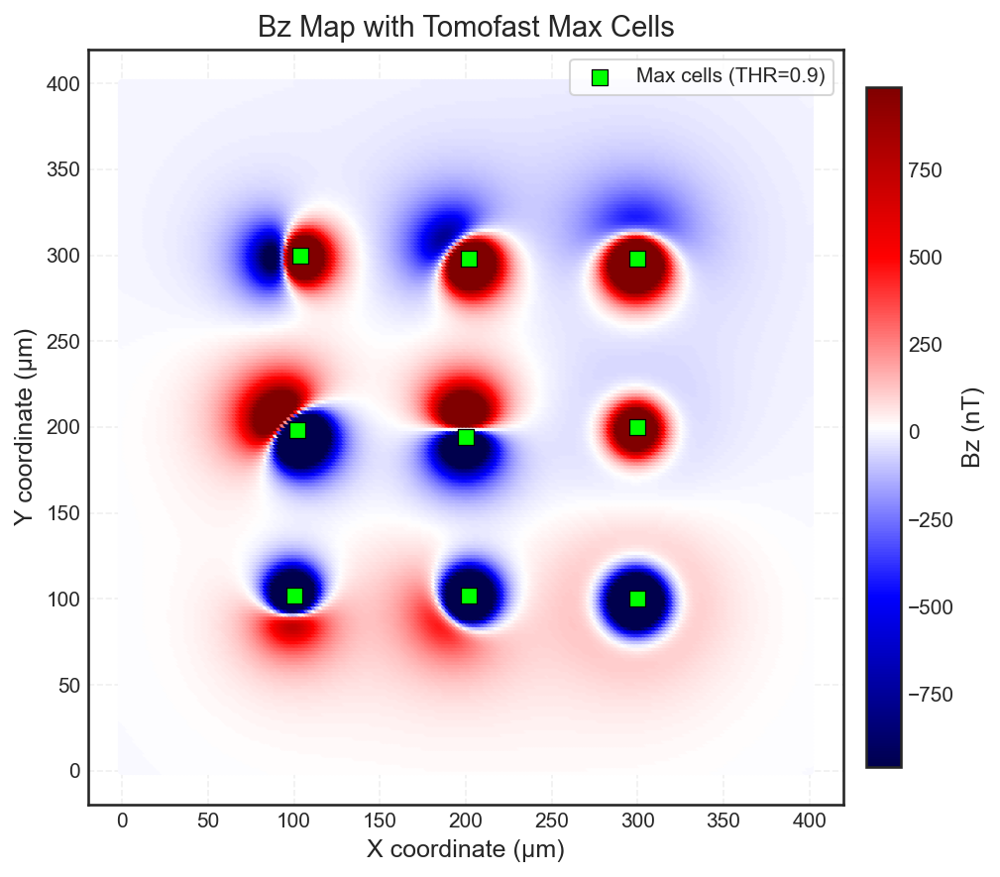

Saved figure: 4-3D_Inversion_Filtered\Tomofast_Output_Blobs\BZ_max_cells_THR_0.9.png


In [28]:
#max cells plot
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# USER SETTINGS
# ============================================================
THR = 0.9

base_dir = os.getcwd()

# ------------------------------------------------------------
# 1. Read Mag data (Bz)
# ------------------------------------------------------------
mag_path = os.path.join(base_dir, "4-3D_Inversion_Filtered", "Mag_Inversion.obs")
mag = np.loadtxt(mag_path, skiprows=1)

x = mag[:, 0]
y = mag[:, 1]
bz = -1 * mag[:, 3]   # QDM convention

# ------------------------------------------------------------
# 2. Read MAX CELLS (combined file)
# ------------------------------------------------------------
max_cells_path = os.path.join(
    base_dir,
    "4-3D_Inversion_Filtered",
    "Tomofast_Output_Blobs",
    f"ALL_BLOBS_grain_max_meshrow_{THR:.1f}.csv"
)

df = pd.read_csv(max_cells_path)

# Compute cell centres
mx = 0.5 * (df["X1"].values + df["X2"].values)
my = 0.5 * (df["Y1"].values + df["Y2"].values)

# ------------------------------------------------------------
# 3. Colour scaling (clip outliers)
# ------------------------------------------------------------
bz_min = np.percentile(bz, 2)
bz_max = np.percentile(bz, 98)

# ------------------------------------------------------------
# 4. Plot
# ------------------------------------------------------------
plt.style.use("seaborn-v0_8-white")

fig, ax = plt.subplots(figsize=(8, 6), dpi=150)

# Bz map
sc = ax.scatter(
    x, y,
    c=bz,
    s=10,
    cmap="seismic",
    vmin=bz_min,
    vmax=bz_max,
    rasterized=True
)

cbar = plt.colorbar(sc, ax=ax, shrink=0.9, pad=0.02)
cbar.set_label("Bz (nT)", fontsize=12)
cbar.ax.tick_params(labelsize=10)

# ------------------------------------------------------------
# 5. Overlay MAX CELLS
# ------------------------------------------------------------
ax.scatter(
    mx, my,
    s=55,
    c="lime",
    edgecolors="black",
    linewidths=0.6,
    marker="s",
    label=f"Max cells (THR={THR:.1f})",
    zorder=3
)

# ------------------------------------------------------------
# 6. Labels & styling
# ------------------------------------------------------------
ax.set_xlabel("X coordinate (µm)", fontsize=12)
ax.set_ylabel("Y coordinate (µm)", fontsize=12)
ax.set_title("Bz Map with Tomofast Max Cells", fontsize=14)

ax.set_aspect("equal", adjustable="box")
ax.grid(True, linestyle="--", alpha=0.3)

ax.legend(frameon=True, fontsize=10, loc="upper right")
plt.tight_layout()

# ------------------------------------------------------------
# 7. Save figure (linked to max-cells file)
# ------------------------------------------------------------
out_png = os.path.join(
     "4-3D_Inversion_Filtered","Tomofast_Output_Blobs",
    f"BZ_max_cells_THR_{THR:.1f}.png"
)

plt.savefig(out_png, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure:", out_png)


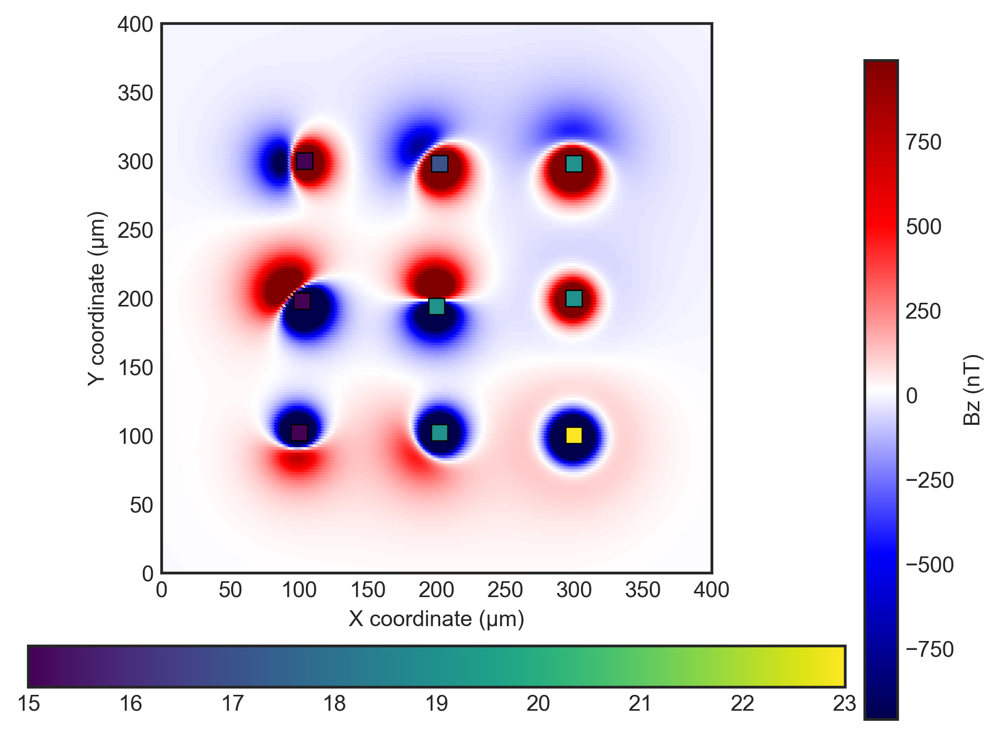

In [29]:
#max cells plot
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

THR = 0.9
base_dir = os.getcwd()

# ------------------------------------------------------------
# 1. Read Mag data (Bz)
# ------------------------------------------------------------
mag_path = os.path.join(base_dir, "4-3D_Inversion_Filtered", "Mag_Inversion.obs")
mag = np.loadtxt(mag_path, skiprows=1)

x = mag[:, 0]
y = mag[:, 1]
bz = -1 * mag[:, 3]

# ------------------------------------------------------------
# 2. Read MAX CELLS
# ------------------------------------------------------------
max_cells_path = os.path.join(
    base_dir,
    "4-3D_Inversion_Filtered",
    "Tomofast_Output_Blobs",
    f"ALL_BLOBS_grain_max_meshrow_{THR:.1f}.csv"
)

df = pd.read_csv(max_cells_path)

mx = 0.5 * (df["X1"].values + df["X2"].values)
my = 0.5 * (df["Y1"].values + df["Y2"].values)
mz = 0.5 * (df["Z1"].values + df["Z2"].values)   # depth

# ------------------------------------------------------------
# 3. Colour scaling (Bz only, unchanged)
# ------------------------------------------------------------
bz_min = np.percentile(bz, 2)
bz_max = np.percentile(bz, 98)

# ------------------------------------------------------------
# 4. Plot
# ------------------------------------------------------------
plt.style.use("seaborn-v0_8-white")
fig, ax = plt.subplots(figsize=(8, 6), dpi=300)

sc = ax.scatter(
    x, y,
    c=bz,
    s=5,
    cmap="seismic",
    vmin=bz_min,
    vmax=bz_max,
    rasterized=True
)

cbar = plt.colorbar(sc, ax=ax, shrink=0.9, pad=0.02)
cbar.set_label("Bz (nT)")

# ------------------------------------------------------------
# 5. Overlay MAX CELLS (depth coloured)
# ------------------------------------------------------------
sc_max = ax.scatter(
    mx, my,
    s=55,
    c=mz,
    cmap="viridis",
    edgecolors="black",
    linewidths=0.6,
    marker="s",
    zorder=3
)

plt.colorbar(sc_max, ax=ax, orientation="horizontal", pad=0.10)

# ------------------------------------------------------------
# 6. Labels & save (unchanged)
# ------------------------------------------------------------
ax.set_xlabel("X coordinate (µm)")
ax.set_ylabel("Y coordinate (µm)")
ax.set_aspect("equal")
ax.set_xlim(x.min(), x.max())
ax.set_ylim(y.min(), y.max())

out_png = os.path.join(
    "4-3D_Inversion_Filtered",
    "Tomofast_Output_Blobs",
    f"BZ_max_cells_THR_{THR:.1f}.png"
)

plt.savefig(out_png, dpi=300, bbox_inches="tight")
plt.show()


## b. Source Location Detection

###  1. Create Meshs

In [30]:
# Create Folder
import os

base_dir = os.getcwd()
folder_path = os.path.join(base_dir,  "4-Source_Detection")#, "Single_cell_meshs")        

if os.path.exists(folder_path):
    print("Folder already exists:", folder_path)
else:
    os.mkdir(folder_path)
    print("Folder created:", folder_path)

Folder already exists: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-Source_Detection


In [31]:
# ======  MESHES AROUND MANY GRAIN CENTERS — PER BLOB  ======
# Input format (first line = count):
#   Line 1: number_of_grains
#   Line 2+: grain_id xmin xmax ymin ymax zmin zmax ...

import os
base_dir = os.getcwd()

# ------------------------------------------------------------
# EDIT THIS PATH (root that contains Blob_001, Blob_002, ...)
# ------------------------------------------------------------
BLOB_ROOT = os.path.join(base_dir, "4-3D_Inversion_Filtered","Tomofast_Output_Blobs")

# If you want a different threshold file, change this but make sure  you pick thresholds that have one grain per one blob:
THR = 0.9
in_name = f"grain_max_meshrow_{THR:.1f}.txt"


# ------------------------------------------------------------
# OUTPUT ROOT 
# ------------------------------------------------------------
#outer_root = os.path.join(base_dir, "4-Source_Detection", "Single_cell_meshs")
#os.makedirs(outer_root, exist_ok=True)

outer_root = os.path.join(base_dir, "4-Source_Detection", "Single_cell_meshs")

# clear old outputs
if os.path.exists(outer_root):
    for fname in os.listdir(outer_root):
        fpath = os.path.join(outer_root, fname)
        if os.path.isfile(fpath):
            os.remove(fpath)
else:
    os.makedirs(outer_root)

# ------------------------------------------------------------
# Search window 
#start with rough range then refine
# ------------------------------------------------------------
#RX = (-30, 30, 10)     # ix range
#RY = (-30, 30, 10)     # iy range 
#RZ = (-30, 30, 10)   # iz range

RX = (-5, 5, 1)     # ix range
RY = (-5, 5, 1)     # iy range  (e.g. (-10, 10) to extend Y)
RZ = (-5, 5, 1)   # iz range

# ------------------------------------------------------------
# Find blobs
# ------------------------------------------------------------
blob_dirs = sorted(
    d for d in os.listdir(BLOB_ROOT)
    if d.startswith("Blob_") and os.path.isdir(os.path.join(BLOB_ROOT, d))
)

print("Found blobs:", blob_dirs)
print("Outputs will be written to:", outer_root)

# ------------------------------------------------------------
# Loop blobs
# ------------------------------------------------------------
for blob in blob_dirs:
    print("\n===================================================")
    print("Processing", blob)
    print("===================================================")

    # Input file for this blob
    input_path = os.path.join(BLOB_ROOT, blob, blob, "Maxs_meshs", in_name)
    if not os.path.exists(input_path):
        print("   Missing:", input_path)
        continue

    # Output folder for this blob (UNDER 4-Source_Detection)
    blob_out = os.path.join(outer_root, blob)
    os.makedirs(blob_out, exist_ok=True)

    # --- 1) Read grain rows ---
    grains = []  # list of (grain_id, xmin, xmax, ymin, ymax, zmin, zmax)

    with open(input_path, "r") as f:
        first = f.readline().strip()
        try:
            _ = int(first)  # header count, not needed
        except ValueError:
            f.seek(0)

        for line in f:
            line = line.strip()
            if not line:
                continue

            cols = line.split()
            if len(cols) < 7:
                continue

            grain_id = int(float(cols[0]))
            xmin = float(cols[1]); xmax = float(cols[2])
            ymin = float(cols[3]); ymax = float(cols[4])
            zmin = float(cols[5]); zmax = float(cols[6])

            grains.append((grain_id, xmin, xmax, ymin, ymax, zmin, zmax))

    print(f"  Loaded {len(grains)} grains:", [g[0] for g in grains])

    # --- 2) Process each grain ---
    for (grain_id, xmin, xmax, ymin, ymax, zmin, zmax) in grains:

        dx = xmax - xmin
        dy = ymax - ymin
        dz = zmax - zmin

        cx0 = 0.5 * (xmin + xmax)
        cy0 = 0.5 * (ymin + ymax)
        cz0 = 0.5 * (zmin + zmax)

        # Output folder: 4-Source_Detection/Single_cell_meshs/Blob_XXX/grain_ID/
        grain_folder = os.path.join(blob_out, f"grain_{grain_id}")
        os.makedirs(grain_folder, exist_ok=True)

        count = 0

        #for ix in range(RX[0], RX[1]):
            #for iy in range(RY[0], RY[1]):
                #for iz in range(RZ[0], RZ[1]):

        for ix in range(RX[0], RX[1], RX[2]):
            for iy in range(RY[0], RY[1], RY[2]):
                for iz in range(RZ[0], RZ[1], RZ[2]):
                    
                    cx = cx0 + ix * dx
                    cy = cy0 + iy * dy
                    cz = cz0 + iz * dz

                    xmin_new = cx - dx / 2
                    xmax_new = cx + dx / 2
                    ymin_new = cy - dy / 2
                    ymax_new = cy + dy / 2
                    zmin_new = cz - dz / 2
                    zmax_new = cz + dz / 2

                    count += 1
                    out_name = f"meshgrid_{count:03d}.txt"
                    out_path = os.path.join(grain_folder, out_name)

                    with open(out_path, "w") as fout:
                        fout.write("1\n")
                        fout.write(
                            f"{xmin_new:.6f} {xmax_new:.6f} "
                            f"{ymin_new:.6f} {ymax_new:.6f} "
                            f"{zmin_new:.6f} {zmax_new:.6f} "
                            f"0.000000 0.000000 0.000000 1 1 1\n"
                        )

        print(f"  {blob} Grain {grain_id}: created {count} mesh files → {grain_folder}")

print("\nAll grains completed.")


Found blobs: ['Blob_001', 'Blob_002', 'Blob_003', 'Blob_004', 'Blob_005', 'Blob_006', 'Blob_007', 'Blob_008', 'Blob_009']
Outputs will be written to: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-Source_Detection\Single_cell_meshs

Processing Blob_001
  Loaded 1 grains: [1]
  Blob_001 Grain 1: created 1000 mesh files → D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-Source_Detection\Single_cell_meshs\Blob_001\grain_1

Processing Blob_002
  Loaded 1 grains: [1]
  Blob_002 Grain 1: created 1000 mesh files → D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-Source_Detection\Single_cell_meshs\Blob_002\grain_1

Processing Blob_003
  Loaded 1 grains: [1]
  Blob_003 Grain 1: created 1000 mesh files → D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-Source_Detection\Single_cell_meshs\Blob_003\grain_1

Processing Blob_004
  Loaded 1 grains: [1]
  Blob_004 Grain 1: created 1000 mesh files → D:\My_Work\Paper\Work\Synthetic_applications\Si

### 2. Create Parfile

In [32]:
import os
import numpy as np

base_dir = os.getcwd()

# ------------------------------------------------
# INPUT: window summary file
# ------------------------------------------------
# Format:
# blob_id nx ny nz ndata
summary_path = os.path.join(
    base_dir,
    "4-3D_Inversion_Filtered",
    "blob_window_summary.txt"
)

# ------------------------------------------------
# OUTPUT: parfiles
# ------------------------------------------------
par_out_dir = os.path.join(base_dir, "0-Parfiles")
os.makedirs(par_out_dir, exist_ok=True)

# ------------------------------------------------
# Parfile template (ONLY placeholders will change)
# ------------------------------------------------
PAR_TEMPLATE = """==================================================================================
GLOBAL
==================================================================================
global.outputFolderPath         = ./output/QDM/Blob_{blob_id:03d}
global.description              = QDM inversion – Blob {blob_id}

==================================================================================
MODEL GRID parameters
==================================================================================
# nx ny nz
modelGrid.size                        = 1 1 1
modelGrid.magn.file                   = data/QDM/meshgrid.txt
modelGrid.magn.nModelComponents       = 3

==================================================================================
DATA parameters
==================================================================================
forward.data.magn.nData                = {ndata}
forward.data.magn.dataGridFile         = data/QDM/Blob_{blob_id:03d}_RECT.obs
forward.data.magn.dataValuesFile       = data/QDM/Blob_{blob_id:03d}_RECT.obs
forward.data.magn.nDataComponents      = 1

==================================================================================
MAGNETIC FIELD constants
==================================================================================
forward.magneticField.inclination              = 90.0
forward.magneticField.declination              = 0.0
forward.magneticField.XaxisDeclination         = 0.d0

==================================================================================
DEPTH WEIGHTING
==================================================================================
# 1-depth weight, 2-distance weight.
forward.depthWeighting.type                    = 1

==================================================================================
SENSITIVITY KERNEL
==================================================================================
sensit.readFromFiles                  = 0
sensit.folderPath                     = ./output/QDM/SENSIT/

==================================================================================
MATRIX COMPRESSION
==================================================================================
forward.matrixCompression.type                        = 0
forward.matrixCompression.rate                        = 0.1

==================================================================================
PRIOR MODEL
==================================================================================
inversion.priorModel.type                  = 1
inversion.priorModel.magn.value            = 0.000000

==================================================================================
INVERSION parameters
==================================================================================
inversion.nMajorIterations              = 3
inversion.nMinorIterations              = 100

==================================================================================
MODEL DAMPING (m - m_prior)
==================================================================================
inversion.modelDamping.magn.weight      = 0.0

==================================================================================
JOINT INVERSION parameters
==================================================================================
inversion.joint.grav.problemWeight      = 0.00000000
inversion.joint.magn.problemWeight      = 1.00000000
"""

# ------------------------------------------------
# LOAD SUMMARY + WRITE PARFILES
# ------------------------------------------------
summary = np.loadtxt(summary_path, comments="#", ndmin=2)

print("Creating Parfiles...")

for row in summary:
    blob_id = int(row[0])
    nx      = int(row[1])
    ny      = int(row[2])
    nz      = int(row[3])
    ndata   = int(row[4])

    par_text = PAR_TEMPLATE.format(
        blob_id=blob_id,
        nx=nx,
        ny=ny,
        nz=nz,
        ndata=ndata
    )

    out_path = os.path.join(
        par_out_dir,
        f"Parfile_QDM_Inversion_Blob_{blob_id:03d}.txt"
    )

    with open(out_path, "w") as f:
        f.write(par_text)

    print(f"  Blob {blob_id:03d}: nx={nx}, ny={ny}, nz={nz}, nData={ndata}")
    print("    ->", out_path)

print("\nDone. Parfiles written to:", par_out_dir)


Creating Parfiles...
  Blob 001: nx=27, ny=34, nz=30, nData=918
    -> D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\0-Parfiles\Parfile_QDM_Inversion_Blob_001.txt
  Blob 002: nx=31, ny=31, nz=30, nData=961
    -> D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\0-Parfiles\Parfile_QDM_Inversion_Blob_002.txt
  Blob 003: nx=29, ny=29, nz=30, nData=841
    -> D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\0-Parfiles\Parfile_QDM_Inversion_Blob_003.txt
  Blob 004: nx=31, ny=41, nz=30, nData=1271
    -> D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\0-Parfiles\Parfile_QDM_Inversion_Blob_004.txt
  Blob 005: nx=40, ny=40, nz=30, nData=1600
    -> D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\0-Parfiles\Parfile_QDM_Inversion_Blob_005.txt
  Blob 006: nx=27, ny=27, nz=30, nData=729
    -> D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\0-Parfiles\Parfile_QDM_Inversion_Blob_006.txt
  Blob 007: nx=31, ny=31, nz=30, nD

### 3. Run Tomofast for minimum Data Cost Detection

In [1]:
# TomoFast loop: per BLOB -> per grain -> per meshgrid_*.txt
# Uses per-blob:
#   0-Parfiles/Parfile_QDM_Inversion_Blob_###.txt
#   4-3D_Inversion_Filtered/Blob_Clipped_obs_RECT/Blob_###_RECT.obs
# Uses meshes:
#   4-Source_Detection/Single_cell_meshs/Blob_###/grain_*/meshgrid_*.txt

import subprocess
import os
import glob
import math

# =====  SETTINGS =====
TOMOFAST_HOME_WSL = "/home/abekhit/Tomofast-X"
WSL = r"C:\Windows\System32\wsl.exe"
# =========================

# -------- globals --------
last_data_cost = None
summary_rows = []  # (blob_name, grain_name, mesh_name, xmin, xmax, ymin, ymax, zmin, zmax, cost)

base_dir = os.getcwd()
print("Current working directory (Windows):", base_dir)

def to_wsl_path(win_path: str) -> str:
    win_path = win_path.replace("\\", "/")
    drive = win_path[0].lower()
    rest = win_path[2:]
    return f"/mnt/{drive}/{rest}"

base_dir_wsl = to_wsl_path(base_dir)

# -------- paths (Windows) --------
mesh_root = os.path.join(base_dir, "4-Source_Detection", "Single_cell_meshs")
obs_dir   = os.path.join(base_dir, "4-3D_Inversion_Filtered", "Blob_Clipped_obs_RECT")
par_dir   = os.path.join(base_dir, "0-Parfiles")

print("Mesh root (Windows):", mesh_root)
print("Obs dir   (Windows):", obs_dir)
print("Par dir   (Windows):", par_dir)

def run_quiet(cmd):
    """
    Run WSL bash command. Do NOT print live output.
    Parse and store last 'data cost (new)' from stdout.
    """
    global last_data_cost
    last_data_cost = None

    p = subprocess.Popen(
        [WSL, "bash", "-lc", cmd],
        stdout=subprocess.PIPE,
        stderr=subprocess.STDOUT,
        text=True,
        bufsize=1
    )

    for line in p.stdout:
        if "data cost (new)" in line:
            try:
                last_data_cost = float(line.split("=")[-1].strip())
            except Exception:
                pass

    p.wait()
    return p.returncode

def read_mesh_bounds(mesh_path):
    with open(mesh_path, "r") as f:
        lines = f.readlines()
    if len(lines) < 2:
        return None
    s = lines[1].split()
    return float(s[0]), float(s[1]), float(s[2]), float(s[3]), float(s[4]), float(s[5])

# -------- find Blob_* folders --------
blob_folders = sorted(
    d for d in glob.glob(os.path.join(mesh_root, "Blob_*"))
    if os.path.isdir(d)
)

if not blob_folders:
    raise FileNotFoundError("No Blob_* folders found in: " + mesh_root)

print("\nFound blob folders:")
for bf in blob_folders:
    print("  ", os.path.basename(bf))

# ============================================================
# LOOP OVER BLOBS
# ============================================================
for blob_folder in blob_folders:
    blob_name = os.path.basename(blob_folder)  # Blob_001
    blob_id = int(blob_name.split("_")[1])

    print("\n====================================================")
    print("PROCESSING", blob_name)
    print("====================================================")

    # per-blob obs + parfile (Windows)
    obs_win = os.path.join(obs_dir, f"Blob_{blob_id:03d}_RECT.obs")
    par_win = os.path.join(par_dir, f"Parfile_QDM_Inversion_Blob_{blob_id:03d}.txt")

    if not os.path.exists(obs_win):
        print("   Missing obs:", obs_win)
        continue
    if not os.path.exists(par_win):
        print("   Missing parfile:", par_win)
        continue

    # copy per-blob parfile
    run_quiet(
        f"cp '{to_wsl_path(par_win)}' {TOMOFAST_HOME_WSL}/parfiles/"
    )

    run_quiet(
        f"cp '{to_wsl_path(obs_win)}' {TOMOFAST_HOME_WSL}/data/QDM/Mag_Inversion.obs"
    )

    par_name = f"Parfile_QDM_Inversion_Blob_{blob_id:03d}.txt"

    # -------- find grain_* folders inside this blob --------
    grain_folders = sorted(
        d for d in glob.glob(os.path.join(blob_folder, "grain_*"))
        if os.path.isdir(d)
    )

    if not grain_folders:
        print("  No grain_* folders in:", blob_folder)
        continue

    # ========================================================
    # LOOP GRAINS -> MESHES 
    # ========================================================
    for grain_folder in grain_folders:
        grain_name = os.path.basename(grain_folder)
        grain_folder_wsl = to_wsl_path(grain_folder)

        print("\n----------------------------------------")
        print(f"{blob_name} -> {grain_name}")
        print("----------------------------------------")

        mesh_files = sorted(glob.glob(os.path.join(grain_folder, "meshgrid_*.txt")))
        if not mesh_files:
            print("  No meshgrid_*.txt in:", grain_folder)
            continue

        for mesh_path in mesh_files:
            mesh_name = os.path.basename(mesh_path)

            bounds = read_mesh_bounds(mesh_path)
            if bounds is None:
                print("  Bad mesh file:", mesh_name)
                continue

            xmin, xmax, ymin, ymax, zmin, zmax = bounds

            # copy mesh as meshgrid.txt 
            run_quiet(
                f"cp '{grain_folder_wsl}/{mesh_name}' "
                f"{TOMOFAST_HOME_WSL}/data/QDM/meshgrid.txt"
            )

            # run TomoFast 
            rc = run_quiet(
                f"cd {TOMOFAST_HOME_WSL} && "
                f"./tomofastx -p ./parfiles/{par_name} | "
                f"tee ./output/QDM/QDM_log.txt"
            )

            if rc != 0:
                final_cost = float("nan")
                print(f"  {mesh_name} -> rc={rc} cost=NaN")
            else:
                final_cost = last_data_cost if last_data_cost is not None else float("nan")
                print(f"  {mesh_name} -> cost={final_cost:.6e}" if not math.isnan(final_cost) else f"  {mesh_name} -> cost=NaN")

            summary_rows.append(
                (blob_name, grain_name, mesh_name, xmin, xmax, ymin, ymax, zmin, zmax, final_cost)
            )

# ============================================================
# WRITE SUMMARY + BESTS
# ============================================================
summary_dir = os.path.join(base_dir, "4-Source_Detection", "Results_DataCost")
os.makedirs(summary_dir, exist_ok=True)

summary_path = os.path.join(summary_dir, "all_final_data_costs_ALL_BLOBS.txt")
with open(summary_path, "w") as f:
    f.write("# blob grain meshfile xmin xmax ymin ymax zmin zmax final_data_cost\n")
    for r in summary_rows:
        f.write(
            f"{r[0]} {r[1]} {r[2]} "
            f"{r[3]:.6f} {r[4]:.6f} {r[5]:.6f} {r[6]:.6f} "
            f"{r[7]:.6f} {r[8]:.6f} {r[9]:.16e}\n"
        )

print("\n Global summary written to:", summary_path)

# ---- best per blob ----
print("\n=== Best per blob ===")
blob_names = sorted(set(r[0] for r in summary_rows))
for b in blob_names:
    rows_b = [r for r in summary_rows if r[0] == b and not math.isnan(r[9])]
    if not rows_b:
        print(f"  {b}: no valid costs")
        continue
    best_b = min(rows_b, key=lambda x: x[9])
    print(f"  {b}: best={best_b[1]}/{best_b[2]} cost={best_b[9]:.6e}")

# ---- best per (blob, grain) ----
print("\n=== Best per blob/grain ===")
pairs = sorted(set((r[0], r[1]) for r in summary_rows))
for (b, g) in pairs:
    rows_bg = [r for r in summary_rows if r[0] == b and r[1] == g and not math.isnan(r[9])]
    if not rows_bg:
        continue
    best_bg = min(rows_bg, key=lambda x: x[9])
    print(f"  {b} {g}: best={best_bg[2]} cost={best_bg[9]:.6e}")

# ---- global best ----
valid = [r for r in summary_rows if not math.isnan(r[9])]
if valid:
    best = min(valid, key=lambda x: x[9])
    print("\n=== Global best over all blobs ===")
    print(f"  blob={best[0]} grain={best[1]} mesh={best[2]} cost={best[9]:.6e}")
else:
    print("\nNo valid costs at all.")


Current working directory (Windows): D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario
Mesh root (Windows): D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-Source_Detection\Single_cell_meshs
Obs dir   (Windows): D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-3D_Inversion_Filtered\Blob_Clipped_obs_RECT
Par dir   (Windows): D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\0-Parfiles

Found blob folders:
   Blob_001
   Blob_002
   Blob_003
   Blob_004
   Blob_005
   Blob_006
   Blob_007
   Blob_008
   Blob_009

PROCESSING Blob_001

----------------------------------------
Blob_001 -> grain_1
----------------------------------------
  meshgrid_001.txt -> cost=9.753231e-01
  meshgrid_002.txt -> cost=9.388478e-01
  meshgrid_003.txt -> cost=8.912061e-01
  meshgrid_004.txt -> cost=8.401365e-01
  meshgrid_005.txt -> cost=7.920295e-01
  meshgrid_006.txt -> cost=7.510096e-01
  meshgrid_007.txt -> cost=7.191489e-01
  meshgrid_008.txt -> cost=6.

### 4. Analysis

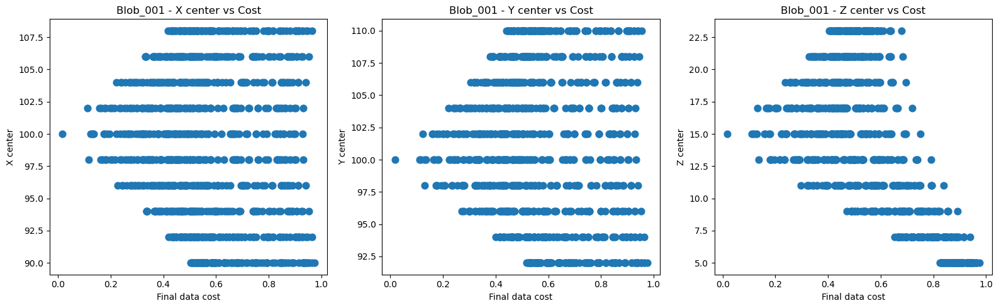


-------------------------------------
Blob: Blob_001
Minimum final data cost = 0.016952718049375474
Best meshfile           = meshgrid_546.txt
Bounds xmin xmax ymin ymax zmin zmax:
xmin     99.0
xmax    101.0
ymin     99.0
ymax    101.0
zmin     14.0
zmax     16.0
Name: 546, dtype: object
-------------------------------------



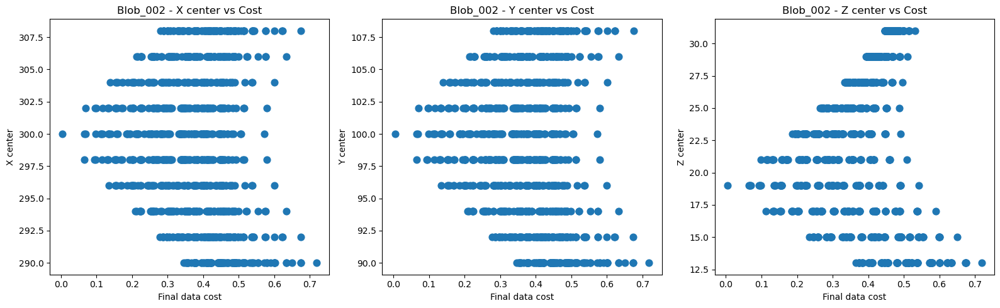


-------------------------------------
Blob: Blob_002
Minimum final data cost = 0.00449823381782604
Best meshfile           = meshgrid_554.txt
Bounds xmin xmax ymin ymax zmin zmax:
xmin    299.0
xmax    301.0
ymin     99.0
ymax    101.0
zmin     18.0
zmax     20.0
Name: 1554, dtype: object
-------------------------------------



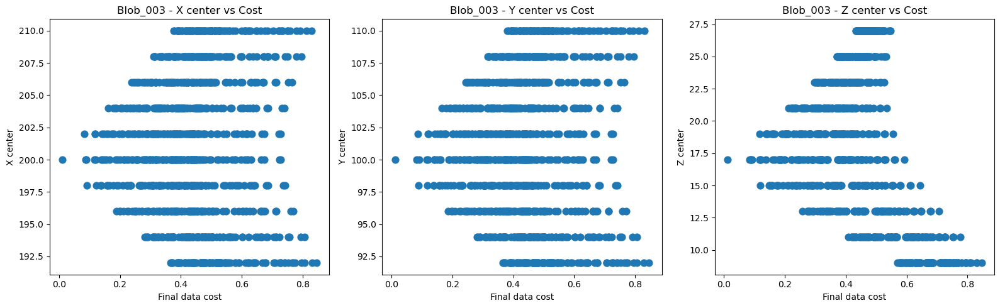


-------------------------------------
Blob: Blob_003
Minimum final data cost = 0.011448252006662328
Best meshfile           = meshgrid_445.txt
Bounds xmin xmax ymin ymax zmin zmax:
xmin    199.0
xmax    201.0
ymin     99.0
ymax    101.0
zmin     16.0
zmax     18.0
Name: 2445, dtype: object
-------------------------------------



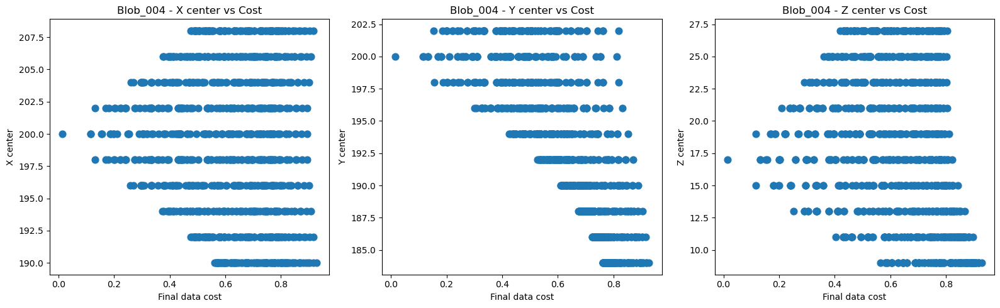


-------------------------------------
Blob: Blob_004
Minimum final data cost = 0.014577489454015845
Best meshfile           = meshgrid_585.txt
Bounds xmin xmax ymin ymax zmin zmax:
xmin    199.0
xmax    201.0
ymin    199.0
ymax    201.0
zmin     16.0
zmax     18.0
Name: 3585, dtype: object
-------------------------------------



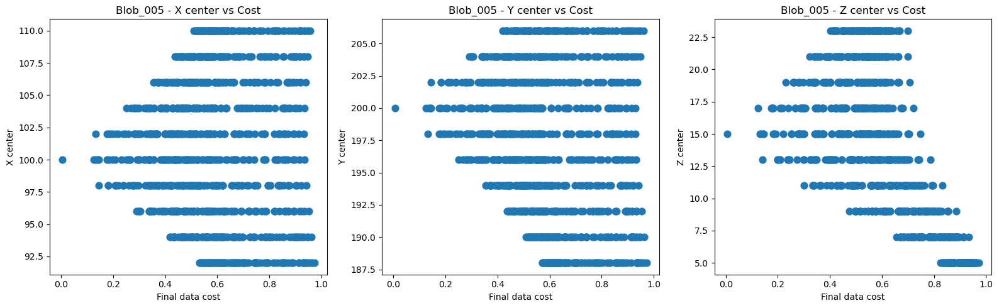


-------------------------------------
Blob: Blob_005
Minimum final data cost = 0.005027053341928536
Best meshfile           = meshgrid_466.txt
Bounds xmin xmax ymin ymax zmin zmax:
xmin     99.0
xmax    101.0
ymin    199.0
ymax    201.0
zmin     14.0
zmax     16.0
Name: 4466, dtype: object
-------------------------------------



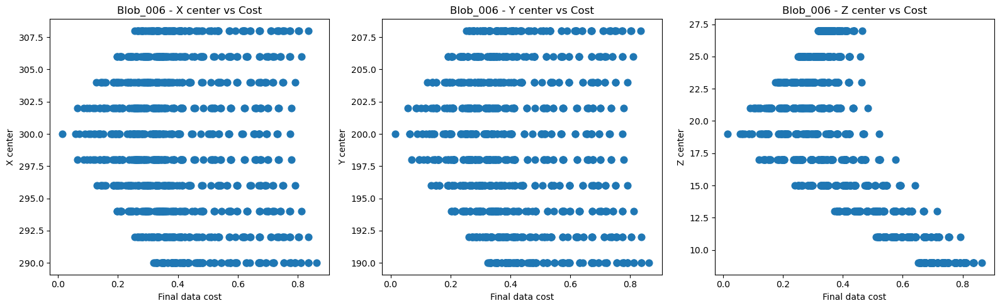


-------------------------------------
Blob: Blob_006
Minimum final data cost = 0.015062989350453715
Best meshfile           = meshgrid_556.txt
Bounds xmin xmax ymin ymax zmin zmax:
xmin    299.0
xmax    301.0
ymin    199.0
ymax    201.0
zmin     18.0
zmax     20.0
Name: 5556, dtype: object
-------------------------------------



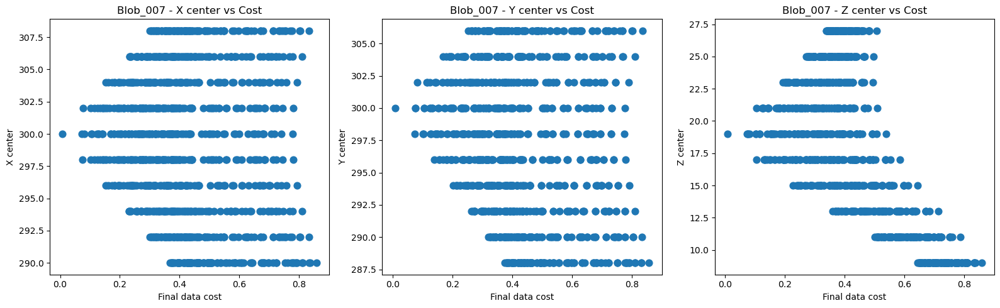


-------------------------------------
Blob: Blob_007
Minimum final data cost = 0.008020700777274351
Best meshfile           = meshgrid_566.txt
Bounds xmin xmax ymin ymax zmin zmax:
xmin    299.0
xmax    301.0
ymin    299.0
ymax    301.0
zmin     18.0
zmax     20.0
Name: 6566, dtype: object
-------------------------------------



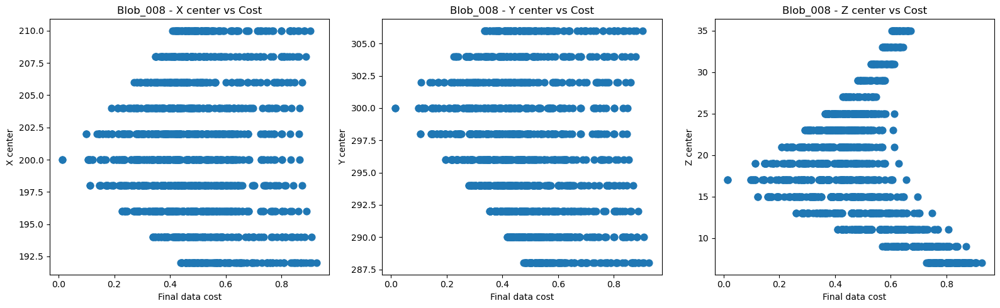


-------------------------------------
Blob: Blob_008
Minimum final data cost = 0.01418907164438916
Best meshfile           = meshgrid_225-Ahmed-Bekhit.txt
Bounds xmin xmax ymin ymax zmin zmax:
xmin    199.0
xmax    201.0
ymin    299.0
ymax    301.0
zmin     16.0
zmax     18.0
Name: 7449, dtype: object
-------------------------------------



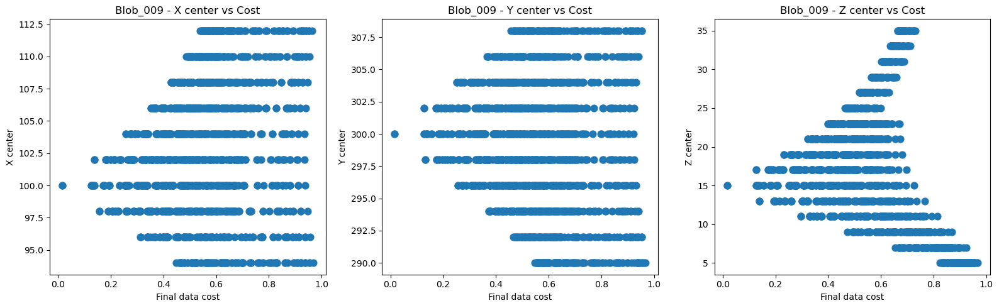


-------------------------------------
Blob: Blob_009
Minimum final data cost = 0.016380695988269318
Best meshfile           = meshgrid_356.txt
Bounds xmin xmax ymin ymax zmin zmax:
xmin     99.0
xmax    101.0
ymin    299.0
ymax    301.0
zmin     14.0
zmax     16.0
Name: 8700, dtype: object
-------------------------------------



In [2]:
# Plot Locations (per BLOB) — each blob is one grain
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

base_dir = os.getcwd()

#  new summary file (all blobs)
txt_path = os.path.join(base_dir, "4-Source_Detection", "Results_DataCost", "all_final_data_costs_ALL_BLOBS.txt")

# columns in that file:
# blob grain meshfile xmin xmax ymin ymax zmin zmax final_data_cost
colnames = ["blob","grain","meshfile","xmin","xmax","ymin","ymax","zmin","zmax","final_data_cost"]
df = pd.read_csv(txt_path, sep=r"\s+", names=colnames, skiprows=1)

# output folder 
out_dir = os.path.join(base_dir, "4-Source_Detection", "Results_DataCost")
os.makedirs(out_dir, exist_ok=True)

# ---------------------------------------------------------
# Loop over BLOBS (each blob is one grain)
# ---------------------------------------------------------
for blob_name, bdf in df.groupby("blob"):

    bdf = bdf.copy()

    # drop NaNs (failed runs)
    bdf = bdf[np.isfinite(bdf["final_data_cost"])]
    if bdf.empty:
        print(f"{blob_name}: no valid costs (all NaN)")
        continue

    # centers
    bdf["x_center"] = 0.5 * (bdf["xmin"] + bdf["xmax"])
    bdf["y_center"] = 0.5 * (bdf["ymin"] + bdf["ymax"])
    bdf["z_center"] = 0.5 * (bdf["zmin"] + bdf["zmax"])

    data_cost = bdf["final_data_cost"].values

    # plots
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))

    axes[0].scatter(data_cost, bdf["x_center"], s=60)
    axes[0].set_xlabel("Final data cost")
    axes[0].set_ylabel("X center")
    axes[0].set_title(f"{blob_name} - X center vs Cost")

    axes[1].scatter(data_cost, bdf["y_center"], s=60)
    axes[1].set_xlabel("Final data cost")
    axes[1].set_ylabel("Y center")
    axes[1].set_title(f"{blob_name} - Y center vs Cost")

    axes[2].scatter(data_cost, bdf["z_center"], s=60)
    axes[2].set_xlabel("Final data cost")
    axes[2].set_ylabel("Z center")
    axes[2].set_title(f"{blob_name} - Z center vs Cost")

    plt.tight_layout()

    out_png = os.path.join(out_dir, f"Mini_Cost_{blob_name}.png")
    plt.savefig(out_png, dpi=300, bbox_inches="tight")
    plt.show()

    # best for this blob
    min_row = bdf.loc[bdf["final_data_cost"].idxmin()]
    print("\n-------------------------------------")
    print(f"Blob: {blob_name}")
    print("Minimum final data cost =", min_row["final_data_cost"])
    print("Best meshfile           =", min_row["meshfile"])
    print("Bounds xmin xmax ymin ymax zmin zmax:")
    print(min_row[["xmin","xmax","ymin","ymax","zmin","zmax"]])
    print("-------------------------------------\n")


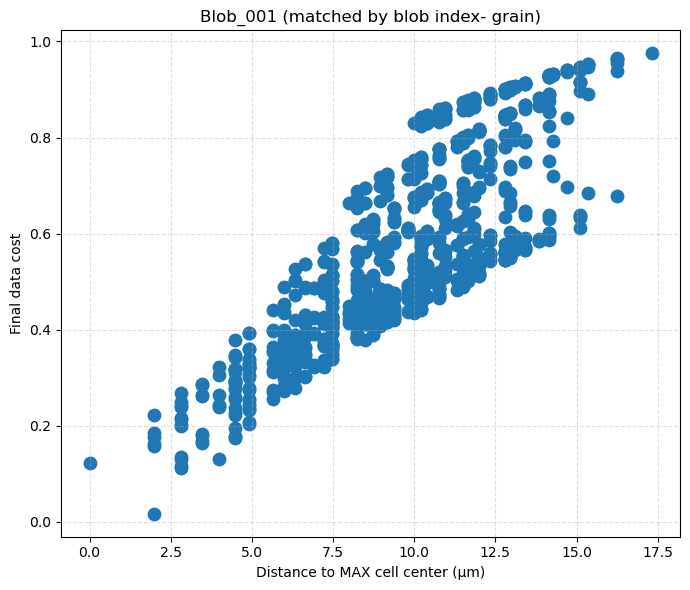


-------------------------------------
Blob: Blob_001
Min final data cost     = 0.016952718049375474
Best meshfile           = meshgrid_546.txt
Grain (from file)       = 1
Expected grain (blob#)  = 1
Distance to MAX cell    = 2.0
-------------------------------------



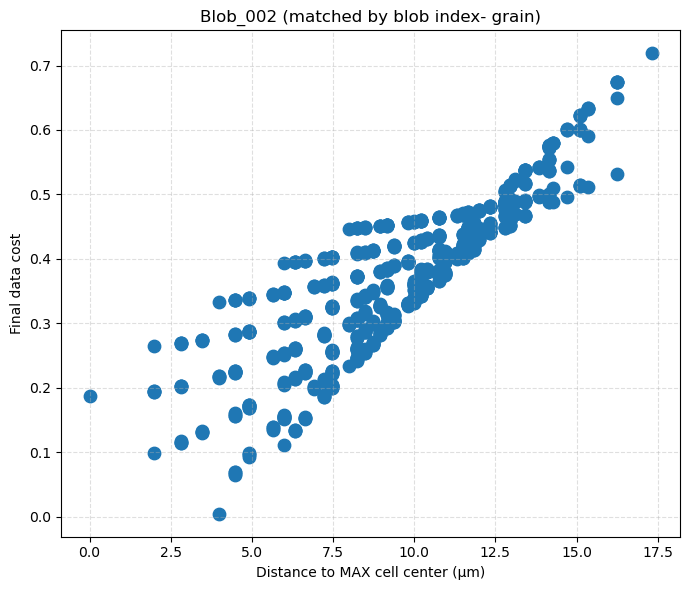


-------------------------------------
Blob: Blob_002
Min final data cost     = 0.00449823381782604
Best meshfile           = meshgrid_554.txt
Grain (from file)       = 1
Expected grain (blob#)  = 2
Distance to MAX cell    = 4.0
-------------------------------------



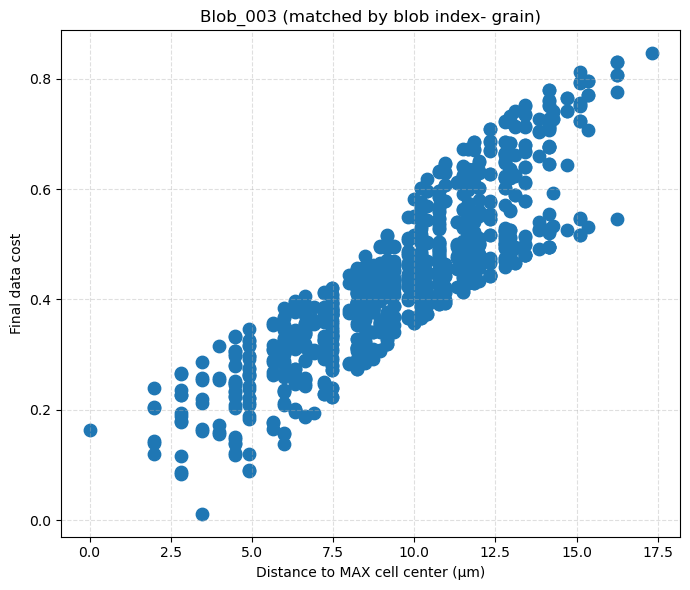


-------------------------------------
Blob: Blob_003
Min final data cost     = 0.011448252006662328
Best meshfile           = meshgrid_445.txt
Grain (from file)       = 1
Expected grain (blob#)  = 3
Distance to MAX cell    = 3.4641016151377544
-------------------------------------



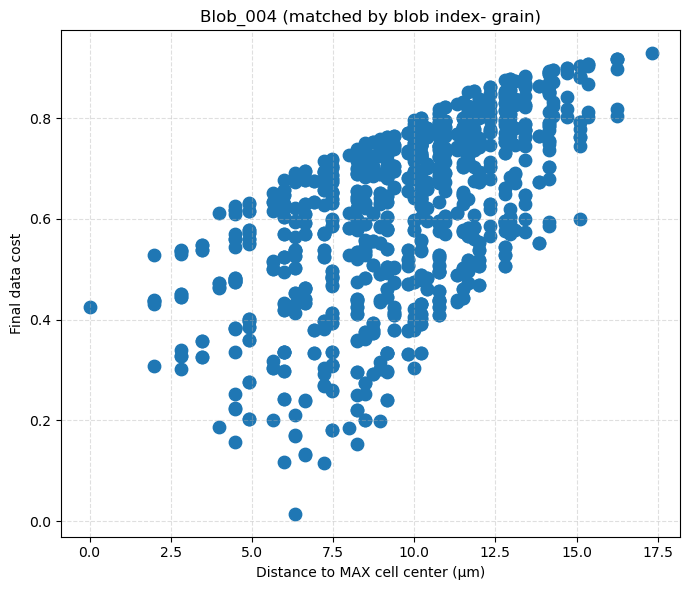


-------------------------------------
Blob: Blob_004
Min final data cost     = 0.014577489454015845
Best meshfile           = meshgrid_585.txt
Grain (from file)       = 1
Expected grain (blob#)  = 4
Distance to MAX cell    = 6.324555320336759
-------------------------------------



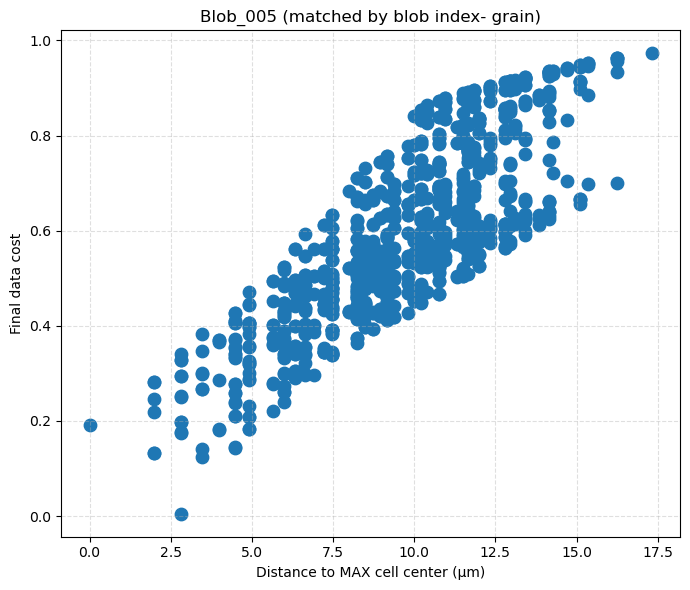


-------------------------------------
Blob: Blob_005
Min final data cost     = 0.005027053341928536
Best meshfile           = meshgrid_466.txt
Grain (from file)       = 1
Expected grain (blob#)  = 5
Distance to MAX cell    = 2.8284271247461903
-------------------------------------



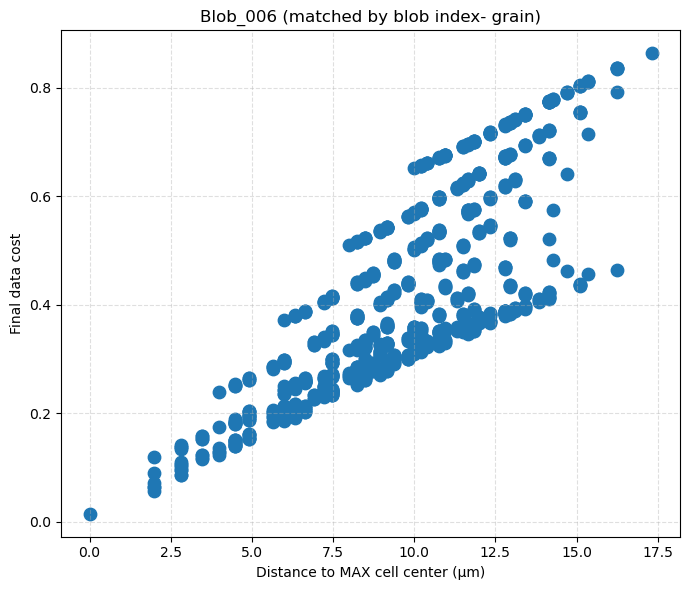


-------------------------------------
Blob: Blob_006
Min final data cost     = 0.015062989350453715
Best meshfile           = meshgrid_556.txt
Grain (from file)       = 1
Expected grain (blob#)  = 6
Distance to MAX cell    = 0.0
-------------------------------------



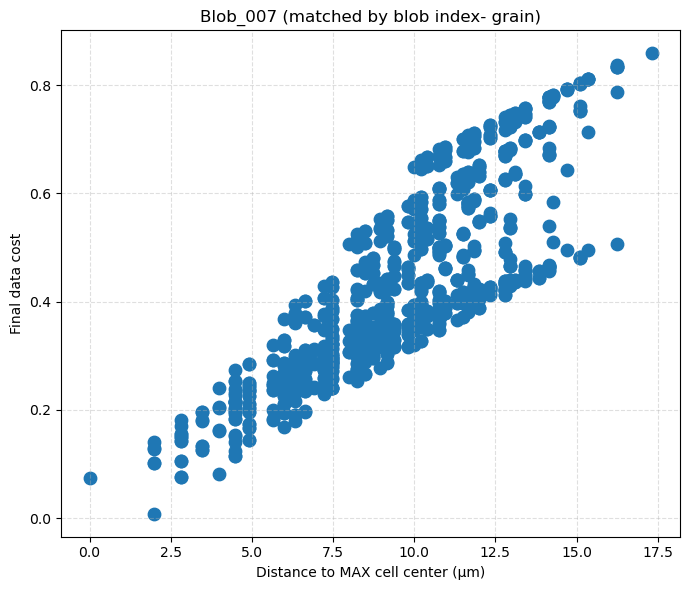


-------------------------------------
Blob: Blob_007
Min final data cost     = 0.008020700777274351
Best meshfile           = meshgrid_566.txt
Grain (from file)       = 1
Expected grain (blob#)  = 7
Distance to MAX cell    = 2.0
-------------------------------------



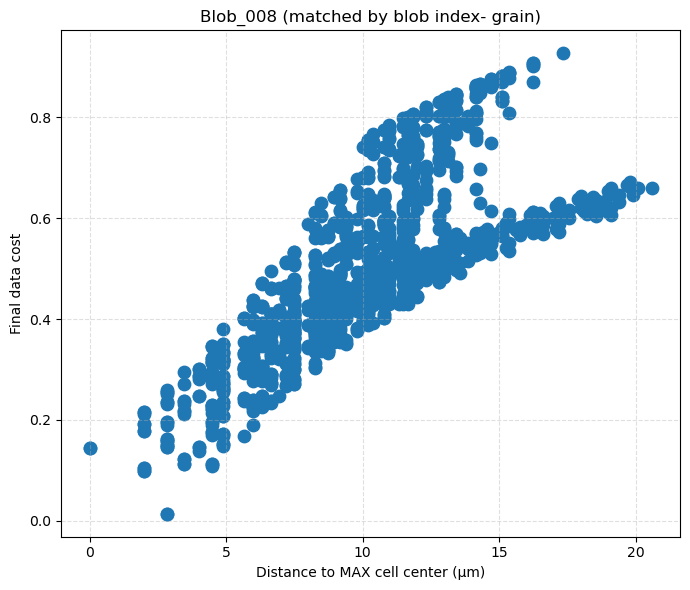


-------------------------------------
Blob: Blob_008
Min final data cost     = 0.01418907164438916
Best meshfile           = meshgrid_225-Ahmed-Bekhit.txt
Grain (from file)       = 1
Expected grain (blob#)  = 8
Distance to MAX cell    = 2.8284271247461903
-------------------------------------



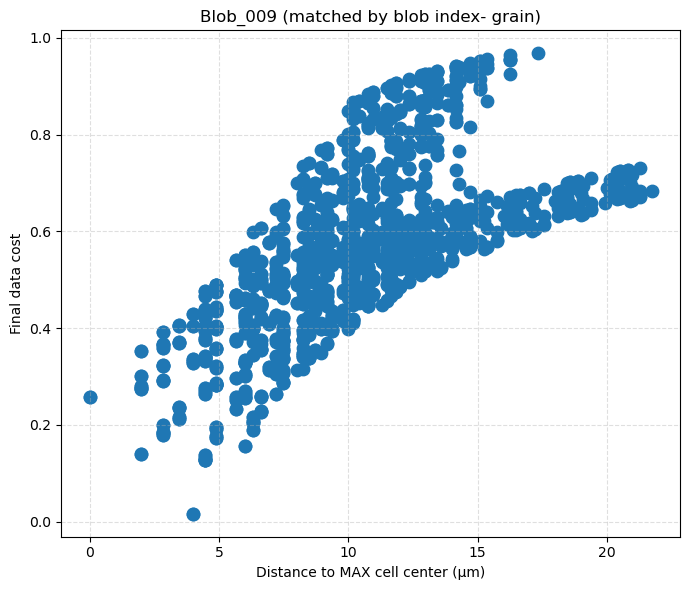


-------------------------------------
Blob: Blob_009
Min final data cost     = 0.016380695988269318
Best meshfile           = meshgrid_356.txt
Grain (from file)       = 1
Expected grain (blob#)  = 9
Distance to MAX cell    = 4.0
-------------------------------------



In [2]:
#distance from maxs 
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

base_dir = os.getcwd()

# =========================================================
# INPUTS
# =========================================================
# Data-cost file (ALL BLOBS)
cost_txt_path = os.path.join(
    base_dir,
    "4-Source_Detection", "Results_DataCost",
    "all_final_data_costs_ALL_BLOBS.txt"
)

# Max-cells combined CSV (from  summary script)
BLOB_ROOT = os.path.join(base_dir, "4-3D_Inversion_Filtered", "Tomofast_Output_Blobs")
THR = 0.9
max_csv_path = os.path.join(BLOB_ROOT, f"ALL_BLOBS_grain_max_meshrow_{THR:.1f}.csv")

# Output plots folder
out_dir = os.path.join(base_dir, "4-Source_Detection", "Results_DataCost")
os.makedirs(out_dir, exist_ok=True)

# =========================================================
# HELPERS
# =========================================================
def blob_index(blob_name: str) -> int:
    """
    Extract numeric index from 'Blob_001' -> 1
    """
    m = re.search(r"(\d+)", str(blob_name))
    if not m:
        return np.nan
    return int(m.group(1))

# =========================================================
# 1) READ DATA COST FILE
# =========================================================
# file columns:
# blob grain meshfile xmin xmax ymin ymax zmin zmax final_data_cost
colnames = ["blob","grain","meshfile","xmin","xmax","ymin","ymax","zmin","zmax","final_data_cost"]
df = pd.read_csv(cost_txt_path, sep=r"\s+", names=colnames, skiprows=1)

# Keep only finite costs
df = df[np.isfinite(df["final_data_cost"])].copy()

# Grain may be like "grain_2" -> extract the number
df["grain"] = df["grain"].astype(str).str.extract(r"(\d+)", expand=False)
df["grain"] = pd.to_numeric(df["grain"], errors="coerce")
df = df.dropna(subset=["grain"]).copy()
df["grain"] = df["grain"].astype(int)

# Compute centers for each tested cell/window
df["x_center"] = 0.5 * (df["xmin"] + df["xmax"])
df["y_center"] = 0.5 * (df["ymin"] + df["ymax"])
df["z_center"] = 0.5 * (df["zmin"] + df["zmax"])

# =========================================================
# 2) READ MAX CELLS CSV (IGNORE GrainID, use blob index rule)
# =========================================================
if not os.path.exists(max_csv_path):
    raise FileNotFoundError(f"Max-cells CSV not found:\n{max_csv_path}")

maxdf = pd.read_csv(max_csv_path)

# Normalize column name
if "Blob" in maxdf.columns:
    maxdf = maxdf.rename(columns={"Blob": "blob"})

# Compute max-cell centers from X1..Z2
maxdf["x_max_center"] = 0.5 * (maxdf["X1"] + maxdf["X2"])
maxdf["y_max_center"] = 0.5 * (maxdf["Y1"] + maxdf["Y2"])
maxdf["z_max_center"] = 0.5 * (maxdf["Z1"] + maxdf["Z2"])

# Create "expected grain" using rule: Blob_001 -> grain 1, Blob_002 -> grain 2, ...
maxdf["expected_grain"] = maxdf["blob"].apply(blob_index)
maxdf = maxdf.dropna(subset=["expected_grain"]).copy()
maxdf["expected_grain"] = maxdf["expected_grain"].astype(int)

# If multiple rows per blob, keep first (usually one row per blob)
maxdf = maxdf.drop_duplicates(subset=["blob"], keep="first")

# =========================================================
# 3) MERGE: match cost rows by (blob, expected_grain)
# =========================================================
# Add expected grain to cost df using the same rule
df["expected_grain"] = df["blob"].apply(blob_index)
df = df.dropna(subset=["expected_grain"]).copy()
df["expected_grain"] = df["expected_grain"].astype(int)

# OPTIONAL sanity check:
# If you want to ENFORCE blob index = grain number, uncomment:
# df = df[df["grain"] == df["expected_grain"]].copy()

dfm = df.merge(
    maxdf[["blob", "expected_grain", "x_max_center", "y_max_center", "z_max_center"]],
    on=["blob", "expected_grain"],
    how="left"
)

missing = dfm[dfm["x_max_center"].isna()][["blob","grain","expected_grain"]].drop_duplicates()
if len(missing) > 0:
    print("\nWARNING: Missing max-cell match for these rows (blob, grain, expected_grain):")
    print(missing.to_string(index=False))
    print("Those will be skipped in plotting.\n")

# Distance to max-cell center
dfm["distance_to_maxcell"] = np.sqrt(
    (dfm["x_center"] - dfm["x_max_center"])**2 +
    (dfm["y_center"] - dfm["y_max_center"])**2 +
    (dfm["z_center"] - dfm["z_max_center"])**2
)

# =========================================================
# 4) PLOT PER BLOB (and show best-fit)
# =========================================================
for blob_name, bdf in dfm.groupby("blob"):

    bdf = bdf.copy()
    bdf = bdf[np.isfinite(bdf["distance_to_maxcell"])].copy()
    if len(bdf) == 0:
        print(f"Skip {blob_name}: no max-cell center found (after matching).")
        continue

    # Scatter: distance vs data cost
    plt.figure(figsize=(7, 6))
    plt.scatter(bdf["distance_to_maxcell"], bdf["final_data_cost"], s=80)

    plt.xlabel("Distance to MAX cell center (µm)")
    plt.ylabel("Final data cost")
    plt.title(f"{blob_name} (matched by blob index- grain)")
    plt.grid(True, linestyle="--", alpha=0.4)
    plt.tight_layout()

    out_png = os.path.join(out_dir, f"Cost_vs_DistToMaxCell_{blob_name}.png")
    plt.savefig(out_png, dpi=300, bbox_inches="tight")
    plt.show()

    # Best-fit (minimum cost) within this blob
    best_row = bdf.loc[bdf["final_data_cost"].idxmin()]

    print("\n-------------------------------------")
    print("Blob:", blob_name)
    print("Min final data cost     =", best_row["final_data_cost"])
    print("Best meshfile           =", best_row["meshfile"])
    print("Grain (from file)       =", best_row["grain"])
    print("Expected grain (blob#)  =", best_row["expected_grain"])
    print("Distance to MAX cell    =", best_row["distance_to_maxcell"])
    print("-------------------------------------\n")


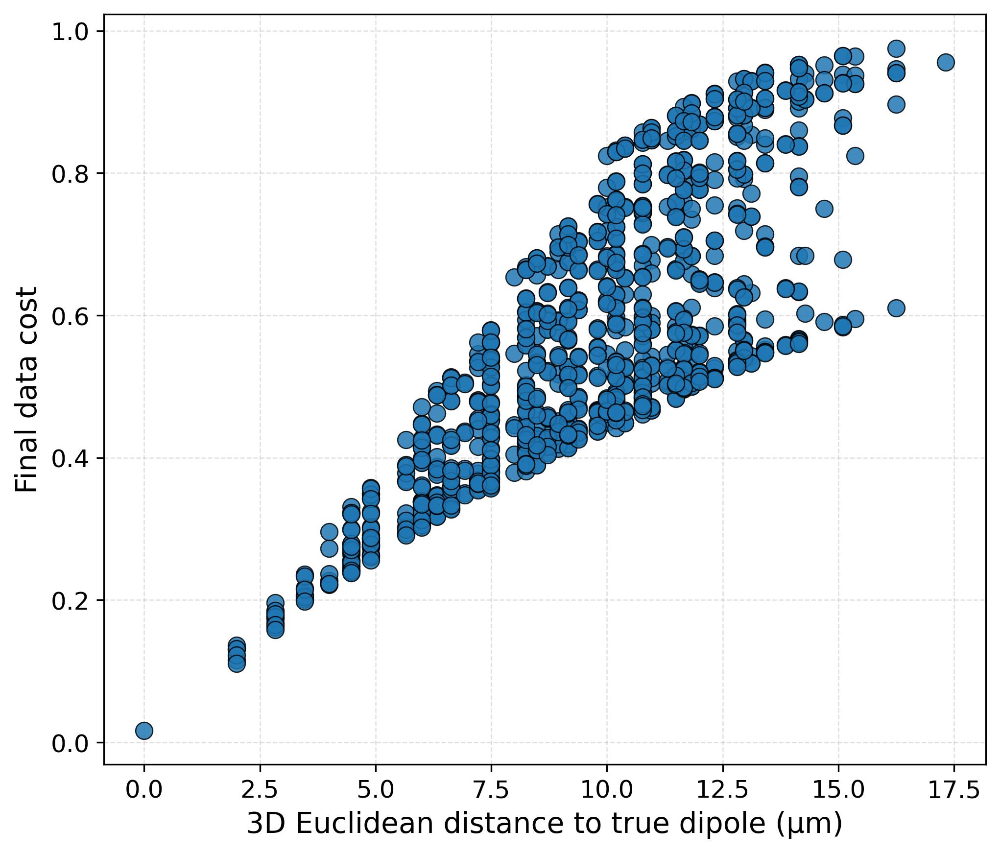


-------------------------------------
Blob: Blob_001
Minimum final data cost = 0.016952718049375474
Best meshfile           = meshgrid_546.txt
Distance                = 0.0
-------------------------------------



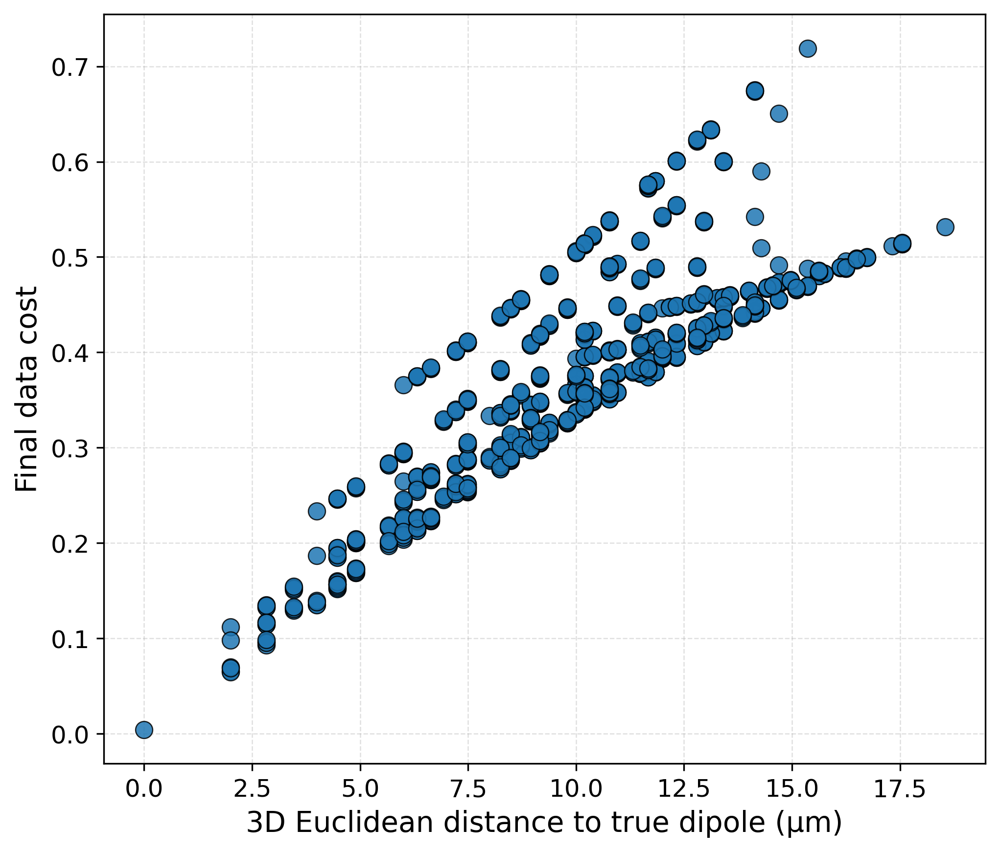


-------------------------------------
Blob: Blob_002
Minimum final data cost = 0.00449823381782604
Best meshfile           = meshgrid_554.txt
Distance                = 0.0
-------------------------------------



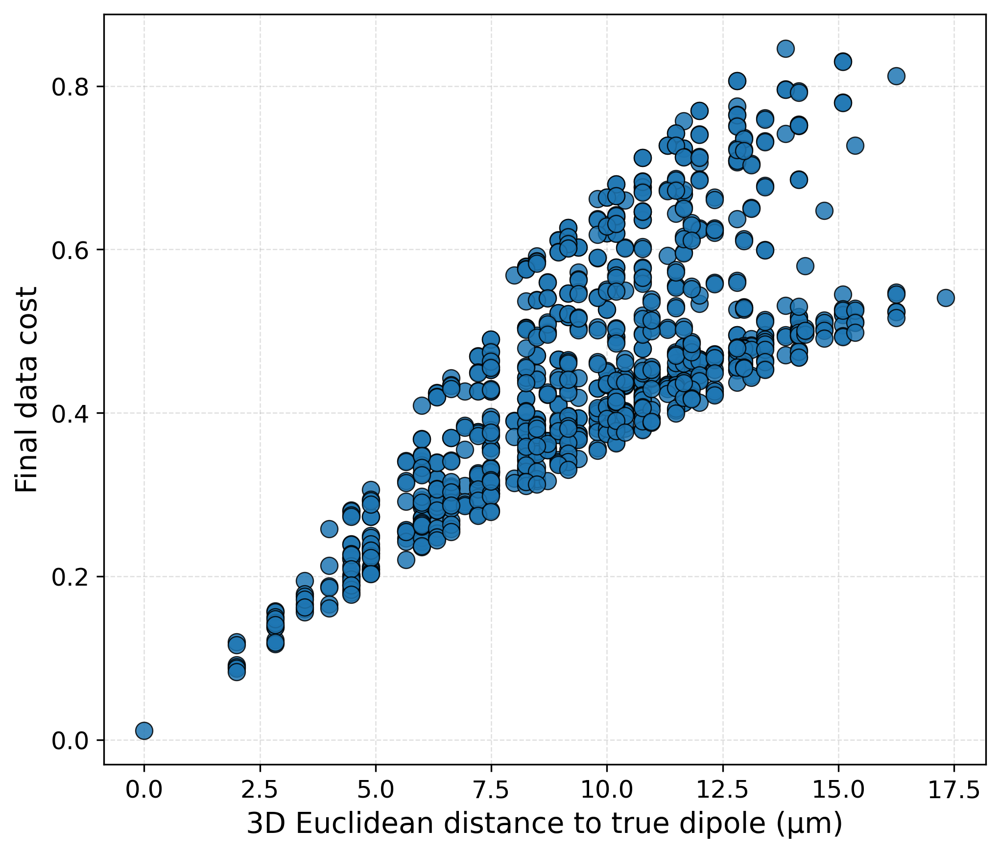


-------------------------------------
Blob: Blob_003
Minimum final data cost = 0.011448252006662328
Best meshfile           = meshgrid_445.txt
Distance                = 0.0
-------------------------------------



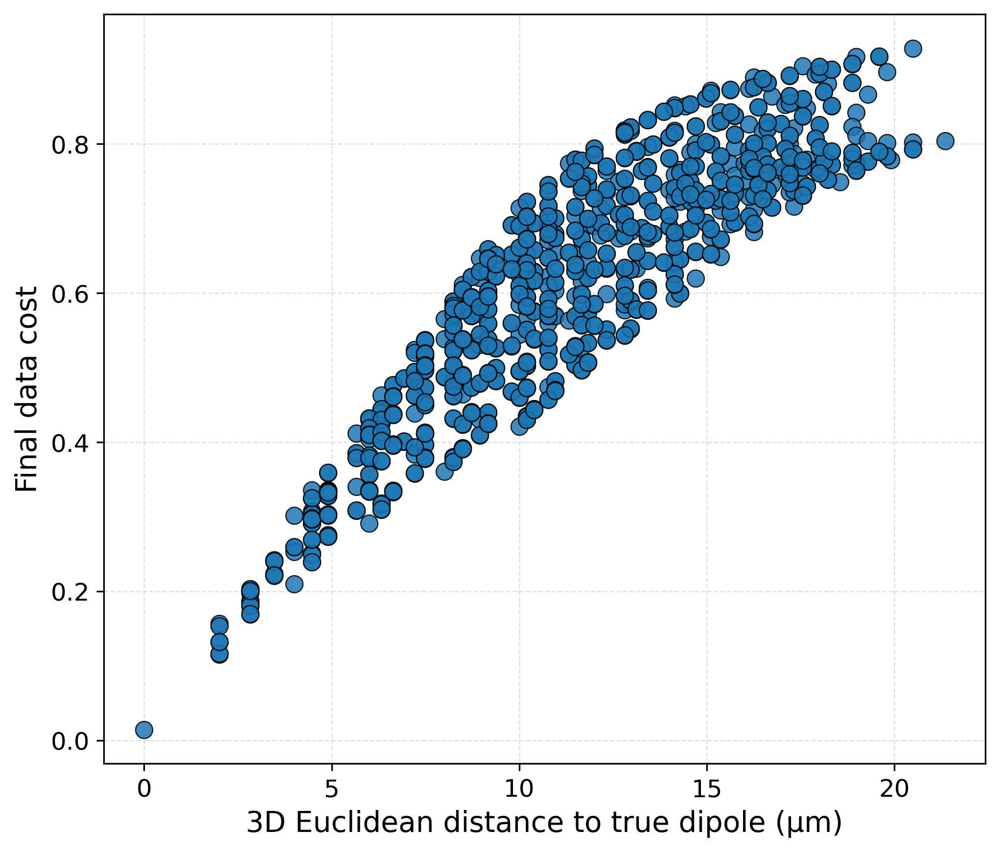


-------------------------------------
Blob: Blob_004
Minimum final data cost = 0.014577489454015845
Best meshfile           = meshgrid_585.txt
Distance                = 0.0
-------------------------------------



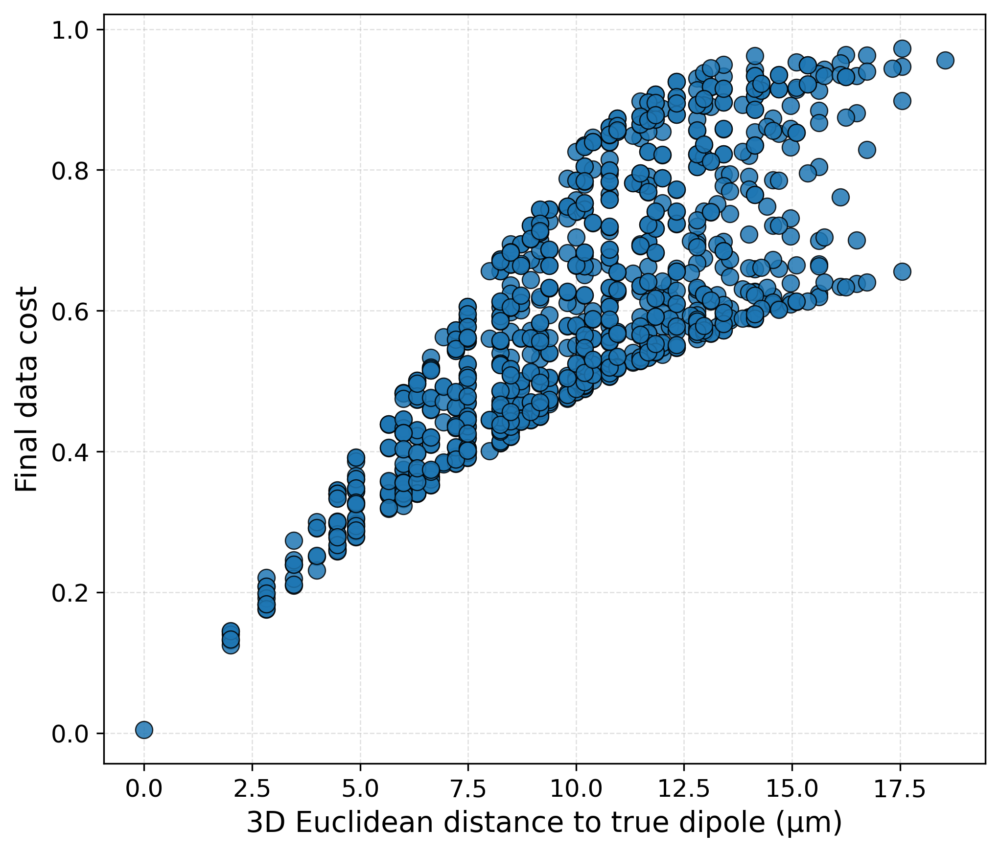


-------------------------------------
Blob: Blob_005
Minimum final data cost = 0.005027053341928536
Best meshfile           = meshgrid_466.txt
Distance                = 0.0
-------------------------------------



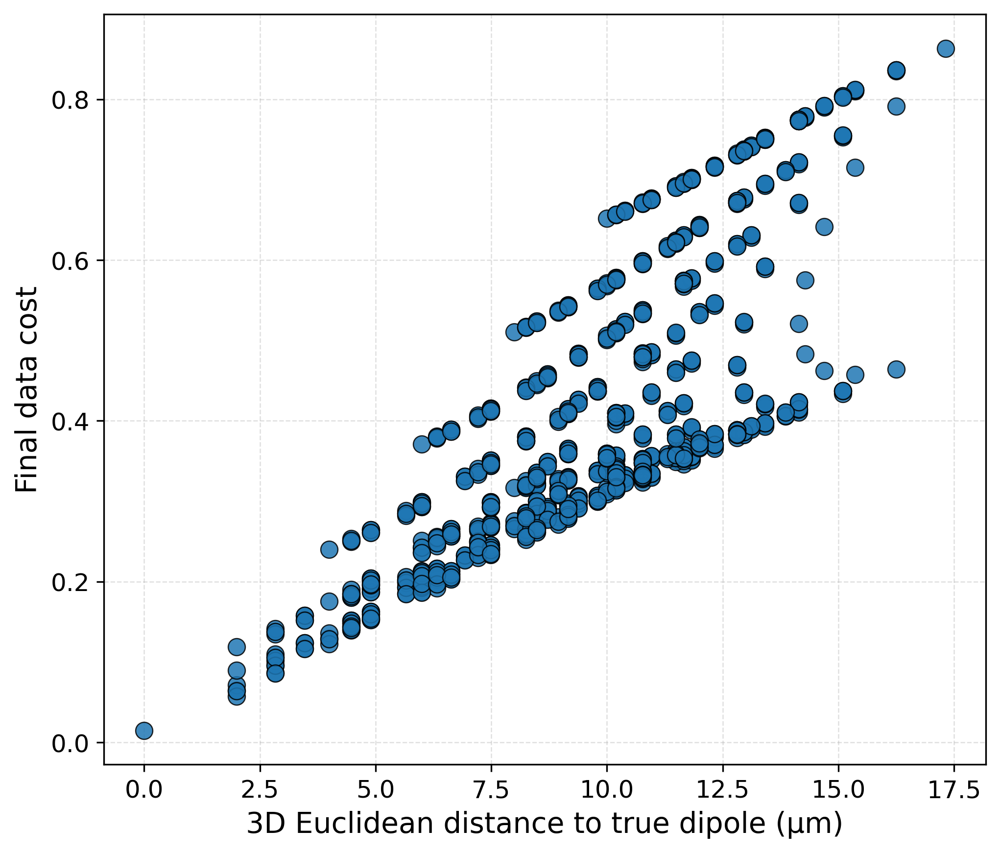


-------------------------------------
Blob: Blob_006
Minimum final data cost = 0.015062989350453715
Best meshfile           = meshgrid_556.txt
Distance                = 0.0
-------------------------------------



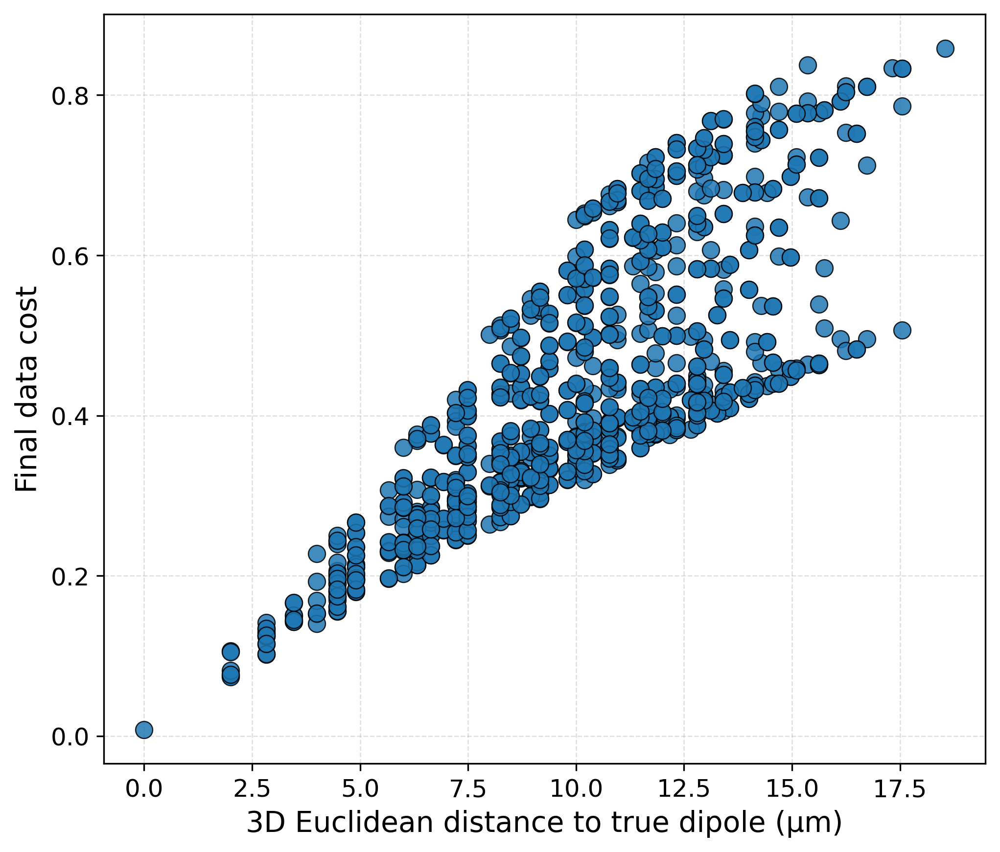


-------------------------------------
Blob: Blob_007
Minimum final data cost = 0.008020700777274351
Best meshfile           = meshgrid_566.txt
Distance                = 0.0
-------------------------------------



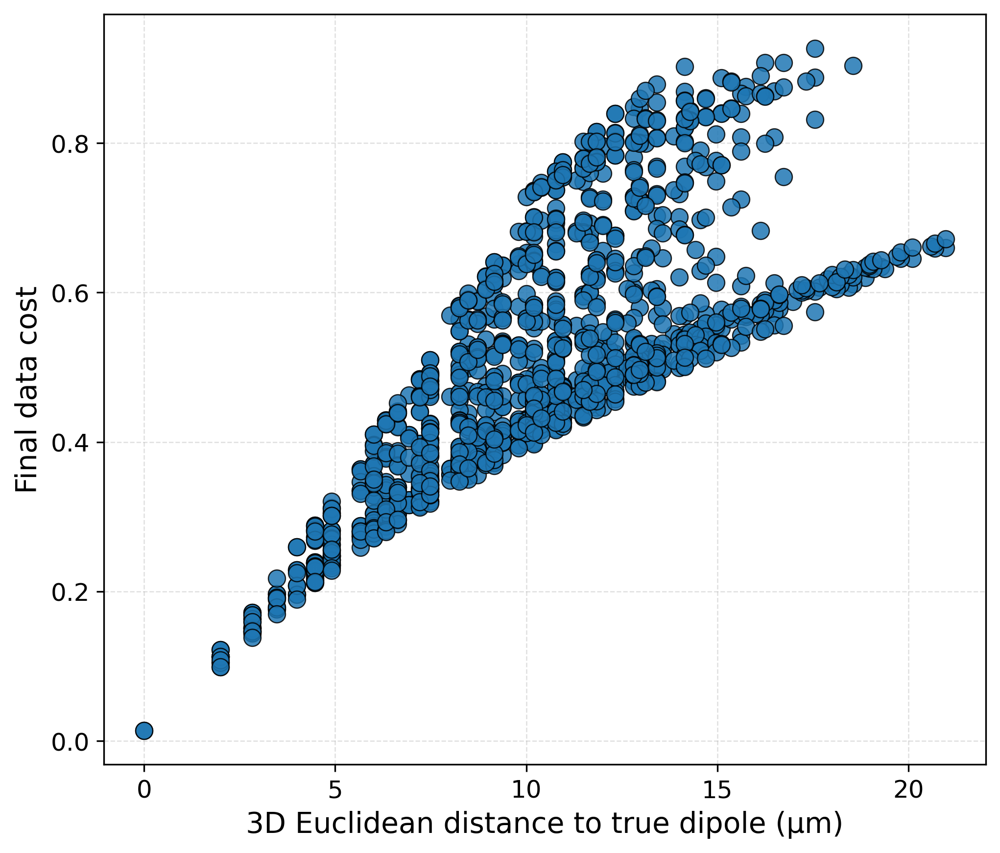


-------------------------------------
Blob: Blob_008
Minimum final data cost = 0.01418907164438916
Best meshfile           = meshgrid_225-Ahmed-Bekhit.txt
Distance                = 0.0
-------------------------------------



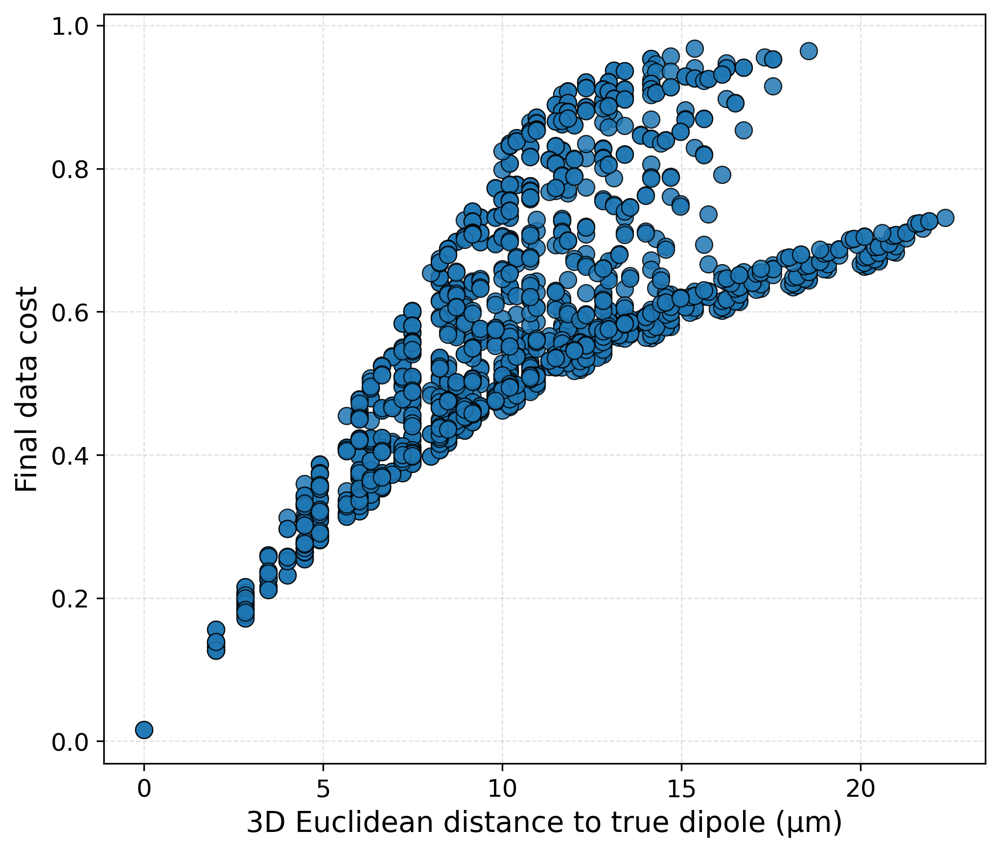


-------------------------------------
Blob: Blob_009
Minimum final data cost = 0.016380695988269318
Best meshfile           = meshgrid_356.txt
Distance                = 0.0
-------------------------------------



In [4]:
# for synthetic data only (or if you know true locations to compare)

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------------------------
# Global plotting style
# ------------------------------------------------
plt.rcParams.update({
    "font.size": 13,
    "axes.labelsize": 14,
    "axes.titlesize": 15,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 12,
    "figure.dpi": 300,
    "savefig.dpi": 300
})

# -----------------------------------
# Read file (ALL BLOBS)
# -----------------------------------
base_dir = os.getcwd()
txt_path = os.path.join(
    base_dir,
    "4-Source_Detection", "Results_DataCost",
    "all_final_data_costs_ALL_BLOBS.txt"
)

colnames = [
    "blob", "grain", "meshfile",
    "xmin", "xmax", "ymin", "ymax", "zmin", "zmax",
    "final_data_cost"
]

df = pd.read_csv(txt_path, sep=r"\s+", names=colnames, skiprows=1)
df = df[np.isfinite(df["final_data_cost"])].copy()

# -----------------------------------
# Compute centers
# -----------------------------------
df["x_center"] = 0.5 * (df["xmin"] + df["xmax"])
df["y_center"] = 0.5 * (df["ymin"] + df["ymax"])
df["z_center"] = 0.5 * (df["zmin"] + df["zmax"])

# -----------------------------------
# True dipole locations (synthetic)
# -----------------------------------
true_locations = {
    "Blob_001": (100, 100, 15),
    "Blob_002": (300, 100, 19),
    "Blob_003": (200, 100, 17),
    "Blob_004": (200, 200, 17),
    "Blob_005": (100, 200, 15),
    "Blob_006": (300, 200, 19),
    "Blob_007": (300, 300, 19),
    "Blob_008": (200, 300, 17),
    "Blob_009": (100, 300, 15),
}

out_dir = os.path.join(base_dir, "4-Source_Detection", "Results_DataCost")
os.makedirs(out_dir, exist_ok=True)

# -----------------------------------
# LOOP over BLOBS
# -----------------------------------
for blob_name, bdf in df.groupby("blob"):

    if blob_name not in true_locations:
        raise ValueError(f"No true location defined for {blob_name}")

    true_x, true_y, true_z = true_locations[blob_name]

    bdf = bdf.copy()
    bdf["distance"] = np.sqrt(
        (bdf["x_center"] - true_x)**2 +
        (bdf["y_center"] - true_y)**2 +
        (bdf["z_center"] - true_z)**2
    )

    # -----------------------------------
    # Scatter: distance vs data cost
    # -----------------------------------
    fig, ax = plt.subplots(figsize=(7, 6))

    ax.scatter(
        bdf["distance"],
        bdf["final_data_cost"],
        s=70,
        edgecolor="k",
        linewidth=0.6,
        alpha=0.85
    )

    #ax.set_xlabel("Distance to true dipole (µm)")
    ax.set_xlabel("3D Euclidean distance to true dipole (µm)")
    ax.set_ylabel("Final data cost")
    #ax.set_title(blob_name)

    ax.grid(True, linestyle="--", linewidth=0.6, alpha=0.4)
    ax.set_axisbelow(True)

    plt.tight_layout()

    out_png = os.path.join(out_dir, f"Mini_Cost2_{blob_name}.png")
    plt.savefig(out_png, bbox_inches="tight")
    plt.show()

    # -----------------------------------
    # Best-fit (minimum cost)
    # -----------------------------------
    best_row = bdf.loc[bdf["final_data_cost"].idxmin()]

    print("\n-------------------------------------")
    print("Blob:", blob_name)
    print("Minimum final data cost =", best_row["final_data_cost"])
    print("Best meshfile           =", best_row["meshfile"])
    print("Distance                =", best_row["distance"])
    print("-------------------------------------\n")


## c. Source Vector Direction

### 1. Combine Meshs

In [5]:
## combine mesh: BEST per BLOB  (i from X, j=1, k=1)
## reads: 4-Source_Detection/Results_DataCost/all_final_data_costs_ALL_BLOBS.txt
## writes: 4-Source_Detection/combined_best_blobs_mesh.txt

import os
import pandas as pd

# -----------------------------
# 1) Paths
# -----------------------------
base_dir = os.getcwd()

summary_path = os.path.join(
    base_dir, "4-Source_Detection", "Results_DataCost", "all_final_data_costs_ALL_BLOBS.txt"
)
out_path = os.path.join(
    base_dir, "4-Source_Detection", "combined_best_blobs_mesh.txt"
)

# -----------------------------
# 2) Read summary table (blob, grain, meshfile, bounds, cost)
# -----------------------------
colnames = ["blob", "grain", "meshfile", "xmin", "xmax", "ymin", "ymax",
            "zmin", "zmax", "final_data_cost"]

df = pd.read_csv(summary_path, sep=r"\s+", names=colnames, skiprows=1)

# -----------------------------
# 3) Best mesh per BLOB
# -----------------------------
best = df.loc[df.groupby("blob")["final_data_cost"].idxmin()].reset_index(drop=True)

n_blobs = len(best)
print("Number of blobs detected:", n_blobs)

# -----------------------------
# 4) Assign simple indices
# i = 1 ... n_blobs
# -----------------------------
best = best.reset_index(drop=True)
best["i"] = best.index + 1
best["j"] = 1
best["k"] = 1

best_sorted = best.copy()

# -----------------------------
# 5) Write combined mesh file
# -----------------------------
with open(out_path, "w") as f:
    f.write(f"{n_blobs}\n")

    print("\nWriting mesh entries (best per blob):")
    for _, row in best_sorted.iterrows():
        xmin, xmax = row["xmin"], row["xmax"]
        ymin, ymax = row["ymin"], row["ymax"]
        zmin, zmax = row["zmin"], row["zmax"]
        i = int(row["i"]); j = 1; k = 1

        print(f"  {row['blob']}  {row['meshfile']}  -> i={i}, j={j}, k={k}")
        f.write(f"{xmin} {xmax} {ymin} {ymax} {zmin} {zmax} 0 0 0 {i} {j} {k}\n")

# -----------------------------
# 6) Print max i, j, k
# -----------------------------
imax = int(best_sorted["i"].max()) if n_blobs else 0

print("\n====================================")
print(" Mesh Index Summary")
print("====================================")
print(f"Max i = {imax}")
print("j is fixed to 1")
print("k is fixed to 1")
print("====================================")

print("\nCombined mesh file saved to:")
print(out_path)


Number of blobs detected: 9

Writing mesh entries (best per blob):
  Blob_001  meshgrid_546.txt  -> i=1, j=1, k=1
  Blob_002  meshgrid_554.txt  -> i=2, j=1, k=1
  Blob_003  meshgrid_445.txt  -> i=3, j=1, k=1
  Blob_004  meshgrid_585.txt  -> i=4, j=1, k=1
  Blob_005  meshgrid_466.txt  -> i=5, j=1, k=1
  Blob_006  meshgrid_556.txt  -> i=6, j=1, k=1
  Blob_007  meshgrid_566.txt  -> i=7, j=1, k=1
  Blob_008  meshgrid_225-Ahmed-Bekhit.txt  -> i=8, j=1, k=1
  Blob_009  meshgrid_356.txt  -> i=9, j=1, k=1

 Mesh Index Summary
Max i = 9
j is fixed to 1
k is fixed to 1

Combined mesh file saved to:
D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-Source_Detection\combined_best_blobs_mesh.txt


### 2. Create Parfile

In [6]:
#Create Parfile
# Adjust num of grains nx  and data size Ndata
import os

base_dir = os.getcwd()
output_path = os.path.join(base_dir, "0-Parfiles","Parfile_QDM_Dipole.txt")

par_text = """==================================================================================
GLOBAL
==================================================================================
global.outputFolderPath         = ./output/QDM
global.description              = QDM inversion data

==================================================================================
MODEL GRID parameters
==================================================================================
# nx ny nz
modelGrid.size                        = 9 1 1
modelGrid.magn.file                   = ./data/QDM/meshgrid.txt
modelGrid.magn.nModelComponents       = 3
==================================================================================
DATA parameters
==================================================================================
forward.data.magn.nData                = 40401
forward.data.magn.dataGridFile         = ./data/QDM/Mag_Inversion.obs
forward.data.magn.dataValuesFile       = ./data/QDM/Mag_Inversion.obs
forward.data.magn.nDataComponents      = 1

==================================================================================
MAGNETIC FIELD constants
==================================================================================
forward.magneticField.inclination              = 90.0
forward.magneticField.declination              = 0.0
forward.magneticField.XaxisDeclination         = 0.d0

==================================================================================
DEPTH WEIGHTING
==================================================================================
# 1-depth weight, 2-distance weight.
forward.depthWeighting.type                    = 1

==================================================================================
SENSITIVITY KERNEL
==================================================================================
# 0-calculate the sensitivity, 1-read from files at the specified folder.
sensit.readFromFiles                  = 0
sensit.folderPath                     = ./output/QDM/SENSIT/

==================================================================================
MATRIX COMPRESSION
==================================================================================
# 0-none, 1-wavelet compression.
forward.matrixCompression.type                        = 0
# The minimum compressed sensitivity absolute value.
forward.matrixCompression.rate                        = 0.1

==================================================================================
PRIOR MODEL
==================================================================================
# 1-set value, 2-read from file.
inversion.priorModel.type                  = 1
inversion.priorModel.magn.value            = 0.000000

==================================================================================
INVERSION parameters
==================================================================================
inversion.nMajorIterations              = 3
inversion.nMinorIterations              = 100
#inversion.modelDamping.normPower        = 1.4d0

==================================================================================
MODEL DAMPING (m - m_prior)
==================================================================================
inversion.modelDamping.magn.weight      = 0.d0


==================================================================================
JOINT INVERSION parameters
==================================================================================
inversion.joint.grav.problemWeight      = 0.00000000
inversion.joint.magn.problemWeight      = 1.00000000

===================================================================================
ADMM constraints
===================================================================================
inversion.admm.enableADMM           = 0
inversion.admm.nLithologies         = 1
inversion.admm.magn.bounds          = 0. 1.d10
inversion.admm.magn.weight          = 50.d0

#inversion.admm.magn.bounds          = -1.d10 0.d0
"""

with open(output_path, "w") as f:
    f.write(par_text)

print("Parfile created:", output_path)


Parfile created: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\0-Parfiles\Parfile_QDM_Dipole.txt


### 3. Run Tomofast Dipole Fitting

In [7]:
# Create Folder
import os

base_dir = os.getcwd()
folder_path = os.path.join(base_dir,  "4-Source_Detection", "Tomofast_Output")      

if os.path.exists(folder_path):
    print("Folder already exists:", folder_path)
else:
    os.mkdir(folder_path)
    print("Folder created:", folder_path)

Folder already exists: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-Source_Detection\Tomofast_Output


In [11]:
### Run Tomofast Inversion Data (combined grains, one run)

import subprocess
import sys
import os

# ===== USER DEFINED TOMOFAST-x DIRECTORY =====
TOMOFAST_HOME_WSL = "/home/abekhit/Tomofast-X"   # <<<< EDIT THIS ONLY

# Detect current Jupyter directory (Windows)
base_dir = os.getcwd()
print("Current working directory (Windows):", base_dir)

# Convert Windows path (e.g. C:\Users\USER\...) to WSL path (/mnt/c/Users/USER/...)
def to_wsl_path(win_path: str) -> str:
    win_path = win_path.replace("\\", "/")   # C:/Users/USER/OneDrive - Curtin/...
    drive = win_path[0].lower()              # 'c'
    rest = win_path[2:]                      # /Users/USER/OneDrive - Curtin/...
    return f"/mnt/{drive}/{rest}"

base_dir_wsl = to_wsl_path(base_dir)
print("WSL version of current dir:", base_dir_wsl)

WSL = r"C:\Windows\System32\wsl.exe"

# Helper function to run a WSL command with live output
def run_live(cmd):
    process = subprocess.Popen(
        [WSL, "bash", "-lc", cmd],  # If running directly in Ubuntu VM, use cmd only
        stdout=subprocess.PIPE,
        stderr=subprocess.STDOUT,
        text=True,
        bufsize=1
    )
    for line in process.stdout:
        print(line, end="")
        sys.stdout.flush()
    process.wait()
    print(f"\n[Return code: {process.returncode}]\n")


print("=== COPYING FILES TO TOMOFAST-x ===\n")

# ---------------------------------------------------------
# 1) Copy parfile + Mag_Inversion.obs to TomoFast-x
# ---------------------------------------------------------
run_live(f"cp '{base_dir_wsl}/0-Parfiles/Parfile_QDM_Dipole.txt'  {TOMOFAST_HOME_WSL}/parfiles/")
run_live(f"cp '{base_dir_wsl}/4-3D_Inversion_Filtered/Mag_Inversion.obs'   {TOMOFAST_HOME_WSL}/data/QDM/")

# ---------------------------------------------------------
# 2) Copy combined mesh file as meshgrid.txt (many grains, one run)
# ---------------------------------------------------------
combined_mesh_win = os.path.join(base_dir, "4-Source_Detection", "combined_best_blobs_mesh.txt")
combined_mesh_wsl = to_wsl_path(combined_mesh_win)

print("Using combined mesh file:")
print("Windows:", combined_mesh_win)
print("WSL:    ", combined_mesh_wsl)

run_live(f"cp '{combined_mesh_wsl}' '{TOMOFAST_HOME_WSL}/data/QDM/meshgrid.txt'")

# ---------------------------------------------------------
# 3) Run TomoFast-x once
# ---------------------------------------------------------
print("\n=== RUNNING TOMOFAST-X (combined grains) ===\n")

run_live(f"cd {TOMOFAST_HOME_WSL} && ./tomofastx -p ./parfiles/Parfile_QDM_Dipole.txt | tee ./output/QDM/QDM_log.txt")

# ---------------------------------------------------------
# 4) Copy TomoFast-x output from Linux -> Windows
# ---------------------------------------------------------
output_win = os.path.join(base_dir, "4-Source_Detection", "Tomofast_Output", "combined_grains")
os.makedirs(output_win, exist_ok=True)

output_wsl = to_wsl_path(output_win)

print("Copying Tomofast-x output from Linux → Windows folder:")
print("Linux source:   /home/abekhit/Tomofast-x/output/QDM/")
print("Windows target:", output_win)

run_live(f"cp -r {TOMOFAST_HOME_WSL}/output/QDM/data '{output_wsl}/'")
run_live(f"cp -r {TOMOFAST_HOME_WSL}/output/QDM/model '{output_wsl}/'")
run_live(f"cp -r {TOMOFAST_HOME_WSL}/output/QDM/Paraview '{output_wsl}/'")
run_live(f"cp -r {TOMOFAST_HOME_WSL}/output/QDM/QDM_log.txt '{output_wsl}/'")
run_live(f"cp -r {TOMOFAST_HOME_WSL}/output/QDM/Parfile_copy.txt '{output_wsl}/'")
run_live(f"cp -r {TOMOFAST_HOME_WSL}/output/QDM/costs.txt '{output_wsl}/'")
# run_live(f"cp -r {TOMOFAST_HOME_WSL}/output/QDM/SENSIT '{output_wsl}/'")  # optional, very large

print("\nDone: combined mesh inversion finished and outputs copied.\n")


Current working directory (Windows): D:\My_Work\Tomofast-x-µ\Work\Synthetic_applications\Simple_scenario
WSL version of current dir: /mnt/d//My_Work/Tomofast-x-µ/Work/Synthetic_applications/Simple_scenario
=== COPYING FILES TO TOMOFAST-x ===


[Return code: 0]


[Return code: 0]

Using combined mesh file:
Windows: D:\My_Work\Tomofast-x-µ\Work\Synthetic_applications\Simple_scenario\4-Source_Detection\combined_best_blobs_mesh.txt
WSL:     /mnt/d//My_Work/Tomofast-x-µ/Work/Synthetic_applications/Simple_scenario/4-Source_Detection/combined_best_blobs_mesh.txt

[Return code: 0]


=== RUNNING TOMOFAST-X (combined grains) ===

 MEMORY USED (mpi init) [GB] =   9.3336105346679688E-003
 Started Tomofast-x, version >= 2.0.8.4
 global.outputFolderPath =./output/QDM
 global.description = QDM inversion data
 modelGrid.size =           9           1           1
 modelGrid.magn.file =./data/QDM/meshgrid.txt
 modelGrid.magn.nModelComponents =           3
 forward.data.magn.nData =       40401
 forward.

### 4. Direction Analysis

In [12]:
# Vector Direction Calculation (Double Check Step)
# Each cell in the model = one grain

import os
import numpy as np

base_dir = os.getcwd()  # current working directory

# folder containing Tomofast outputs
root_folder = os.path.join(base_dir, "4-Source_Detection", "Tomofast_Output")

# combined-grains run
grain_folders = ["combined_grains"]
print("Found model folder(s):", grain_folders)

# --------------------------------------
# LOOP OVER (here only 'combined_grains')
# --------------------------------------
for grain in grain_folders:
    print("\n=====================================")
    print("Processing", grain)
    print("=====================================\n")

    Model = os.path.join(root_folder, grain, "model", "mag_final_model_full.txt")

    # -----------------------------
    # Load the model:
    # first line = number of grains
    # following lines = Mx My Mz per grain
    # -----------------------------
    with open(Model, "r") as f:
        lines = f.readlines()

    Ngrains = int(lines[0].strip())
    print("Number of grains in model:", Ngrains)

    # convert remaining lines (one per grain) into array
    data = np.loadtxt(lines[1:])  # read from second line onward
    data = np.atleast_2d(data)    # ensure 2D even if Ngrains = 1

    # -----------------------------
    # Process each grain
    # -----------------------------
    for grain_idx, (Mx, My, Mz_raw) in enumerate(data, start=1):

        print(f"\n--- Grain {grain_idx} ---")

        # Apply sign flip (same as your original code)
        Mz = -Mz_raw

        m = np.sqrt(Mx**2 + My**2 + Mz**2)

        if m == 0:
            dec, inc = np.nan, np.nan
        else:
            theta = np.degrees(np.arccos(Mz / m))
            phi   = np.degrees(np.arctan2(My, Mx))

            inc = theta - 90
            #dec= phi - 90
            dec = 90- phi

            change = True
            while change:
                change = False

                if inc > 90:
                    inc = 180 - inc 
                    dec = dec + 180
                    change = True

                if inc < -90:
                    inc = -180 - inc
                    dec = dec + 180
                    change = True

                if dec < 0:
                    dec = dec + 360
                    change = True

                if dec >= 360:
                    dec = dec - 360
                    change = True

        print("phi=", phi, "theta=", theta)
        print("dec=", dec, "inc=", inc)

        # Cell size (m)
        dx = 2e-6
        dy = 2e-6
        dz = 2e-6
        V = dx * dy * dz  # m^3

        # Horizontal magnitude
        H = np.hypot(Mx, My)

        # Inclination (positive down)
        inc_rad = np.arctan2(Mz, H)
        inc_deg = np.degrees(inc_rad)

        # Magnetization amplitude (A/m)
        M_amp = np.sqrt(Mx**2 + My**2 + Mz**2)

        # Magnetic moment amplitude (A·m^2)
        moment_amp = M_amp * V

        print("Magnetization amplitude:", M_amp*1e-6, "A/m")
        print("Magnetic moment amplitude:", moment_amp, "A·m²")


Found model folder(s): ['combined_grains']

Processing combined_grains

Number of grains in model: 9

--- Grain 1 ---
phi= 90.00000000011595 theta= 44.999999999653355
dec= 359.99999999988404 inc= -45.000000000346645
Magnetization amplitude: 0.012499999999979599 A/m
Magnetic moment amplitude: 9.999999999983679e-14 A·m²

--- Grain 2 ---
phi= 141.13857483759344 theta= 0.0
dec= 308.8614251624066 inc= -90.0
Magnetization amplitude: 0.025000000000114132 A/m
Magnetic moment amplitude: 2.0000000000091304e-13 A·m²

--- Grain 3 ---
phi= 45.000000000892385 theta= 29.99999999947062
dec= 44.999999999107615 inc= -60.00000000052938
Magnetization amplitude: 0.018749999999815338 A/m
Magnetic moment amplitude: 1.499999999985227e-13 A·m²

--- Grain 4 ---
phi= -89.99999999875224 theta= 89.99999999945828
dec= 179.99999999875223 inc= -5.417177817435004e-10
Magnetization amplitude: 0.018750000000025805 A/m
Magnetic moment amplitude: 1.500000000002064e-13 A·m²

--- Grain 5 ---
phi= -45.00000000087447 theta= 5

Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Using combined-grains model: ['combined_grains']

Processing: combined_grains
Number of grains detected: 9
Grain 1: dec=360.00, inc=-45.00
Grain 2: dec=308.86, inc=-90.00
Grain 3: dec=45.00, inc=-60.00
Grain 4: dec=180.00, inc=-0.00
Grain 5: dec=135.00, inc=-30.00
Grain 6: dec=181.06, inc=90.00
Grain 7: dec=360.00, inc=60.00
Grain 8: dec=315.00, inc=45.00
Grain 9: dec=270.00, inc=30.00


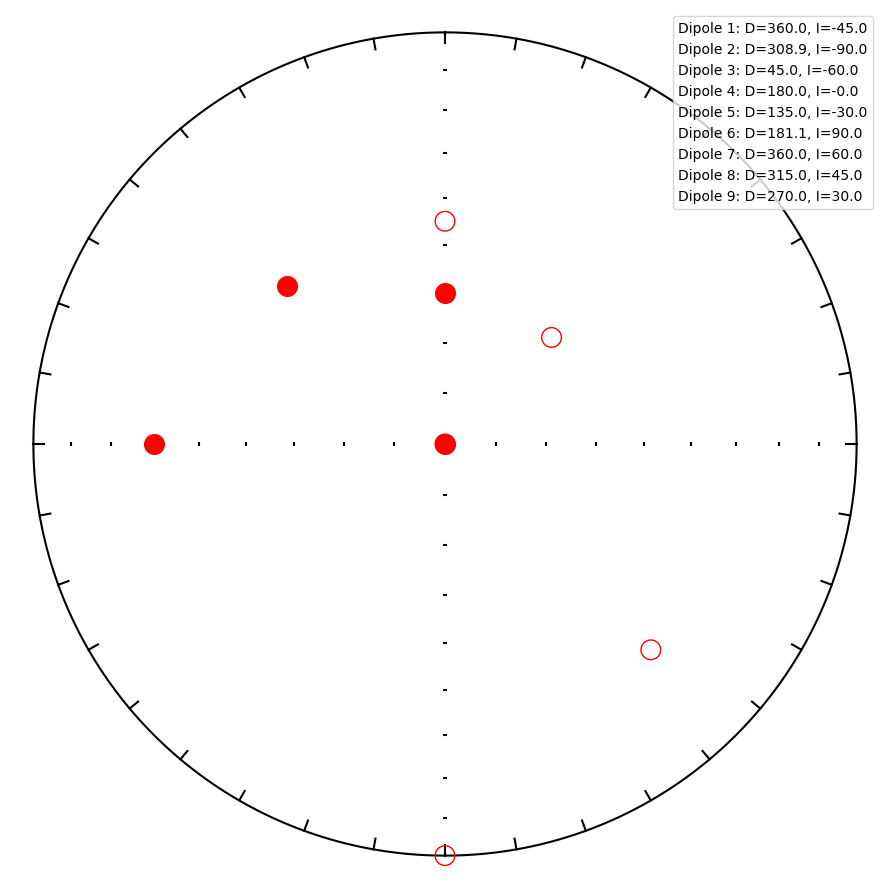

Saved combined plot: D:\My_Work\Tomofast-x-µ\Work\Synthetic_applications\Simple_scenario\4-Source_Detection\All_Combined_Grains_DecInc.png


In [13]:
### Stereonet plot (combined grains)

import os
import numpy as np
import matplotlib.pyplot as plt
import pmagpy.ipmag as ipmag

base_dir = os.getcwd()  # current working directory

# Root folder of Tomofast outputs
root_folder = os.path.join(base_dir, "4-Source_Detection", "Tomofast_Output")

#  combined_grains model
grain_folders = ["combined_grains"]
print("Using combined-grains model:", grain_folders)

results = []  # store (grain_index, dec, inc)

for folder in grain_folders:

    print("\nProcessing:", folder)

    # path to final model
    Model = os.path.join(root_folder, folder, "model", "mag_final_model_full.txt")

    # ---- Load model: first line = Ngrains, rest = Mx My Mz ----
    with open(Model, "r") as f:
        lines = f.readlines()

    Ngrains = int(lines[0].strip())
    print("Number of grains detected:", Ngrains)

    data = np.loadtxt(lines[1:])
    data = np.atleast_2d(data)  # ensure 2D

    # --------------------------------------
    # Compute dec/inc for each grain cell
    # --------------------------------------
    for idx, (Mx, My, Mz_raw) in enumerate(data, start=1):

        Mz = -Mz_raw  # same sign flip
        m = np.sqrt(Mx**2 + My**2 + Mz**2)

        if m == 0:
            dec, inc = np.nan, np.nan
        else:
            theta = np.degrees(np.arccos(Mz / m))
            phi   = np.degrees(np.arctan2(My, Mx))

            inc = theta - 90
            #dec= phi - 90
            dec = 90- phi

            change = True
            while change:
                change = False

                if inc > 90:
                    inc = 180 - inc
                    dec = dec + 180
                    change = True

                if inc < -90:
                    inc = -180 - inc
                    dec = dec + 180
                    change = True

                if dec < 0:
                    dec = dec + 360
                    change = True

                if dec >= 360:
                    dec = dec - 360
                    change = True

        print(f"Grain {idx}: dec={dec:.2f}, inc={inc:.2f}")
        results.append((idx, dec, inc))


# ======================================
# Plot on Stereonet
# ======================================

plt.figure(figsize=(9, 9))
ipmag.plot_net()

#colors = plt.cm.tab10(np.linspace(0, 1, len(results)))

colors = ["r"] * len(results)   # all points same color (black)

for (grain_idx, dec, inc), col in zip(results, colors):
    ipmag.plot_di(dec, inc, color=col, marker='o', markersize=200)
    
    #plt.plot([], [], marker='o', color=col, 
            # label=f"Dipole {grain_idx}: D={dec:.1f}, I={inc:.1f}")
    plt.plot([], [], color="r", linestyle="None",
         label=f"Dipole {grain_idx}: D={dec:.1f}, I={inc:.1f}")


#plt.legend(loc="upper right", fontsize=10, frameon=True)
plt.legend(loc="upper right", handlelength=0, handletextpad=0)

#plt.title("Dec–Inc of Combined Grains (Equal-Area Net)", fontsize=14)

out_png = os.path.join(base_dir, "4-Source_Detection", "All_Combined_Grains_DecInc.png")
plt.savefig(out_png, dpi=300, bbox_inches='tight')

plt.show()

print("Saved combined plot:", out_png)


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


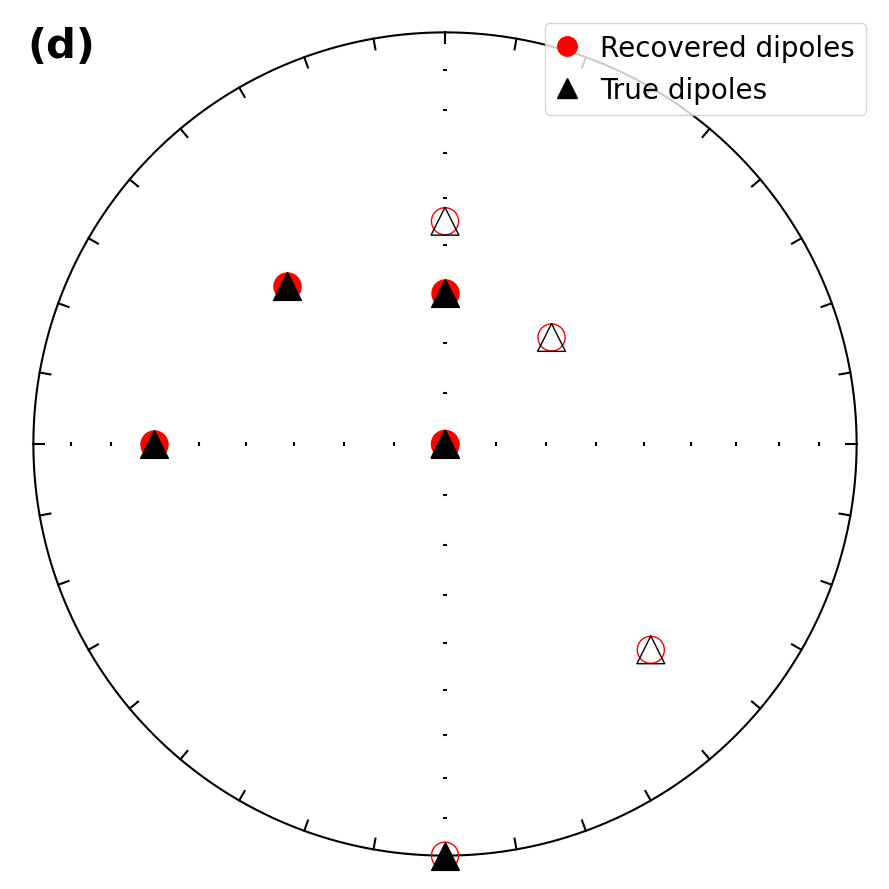

Saved stereonet: D:\My_Work\Tomofast-x-µ\Work\Synthetic_applications\Simple_scenario\4-Source_Detection\Recovered_vs_True_Dipoles_Stereonet.png


In [18]:
### Stereonet plot (combined grains) – recovered vs true dipoles

import os
import numpy as np
import matplotlib.pyplot as plt
import pmagpy.ipmag as ipmag

base_dir = os.getcwd()

# ------------------------------------------------
# Paths
# ------------------------------------------------
root_folder = os.path.join(base_dir, "4-Source_Detection", "Tomofast_Output")
grain_folders = ["combined_grains"]

# ------------------------------------------------
# TRUE dipole directions (DEC, INC) 
# ------------------------------------------------
true_directions = [
    (0, -45.0),
    (90, -90.0),
    (45.0,  -60.0),
    (180.0,  -0.0),
    (135.0, -30.0),
    (225,  90.0),
    (360.0,  60.0),
    (315.0,  45.0),
    (270.0,  30.0)
]

results = []  # (grain_idx, dec, inc)

# ------------------------------------------------
# Read recovered model
# ------------------------------------------------
for folder in grain_folders:

    Model = os.path.join(root_folder, folder, "model", "mag_final_model_full.txt")

    with open(Model, "r") as f:
        lines = f.readlines()

    Ngrains = int(lines[0].strip())
    data = np.loadtxt(lines[1:])
    data = np.atleast_2d(data)

    for idx, (Mx, My, Mz_raw) in enumerate(data, start=1):

        Mz = -Mz_raw
        m = np.sqrt(Mx**2 + My**2 + Mz**2)

        if m == 0:
            continue

        theta = np.degrees(np.arccos(Mz / m))
        phi   = np.degrees(np.arctan2(My, Mx))

        inc = theta - 90
        dec = 90 - phi

        change = True
        while change:
            change = False
            if inc > 90:
                inc = 180 - inc
                dec += 180
                change = True
            if inc < -90:
                inc = -180 - inc
                dec += 180
                change = True
            if dec < 0:
                dec += 360
                change = True
            if dec >= 360:
                dec -= 360
                change = True

        results.append((idx, dec, inc))

# ------------------------------------------------
# Plot stereonet
# ------------------------------------------------
plt.figure(figsize=(9, 9))
ipmag.plot_net()

ax = plt.gca()

ax.text(
    0.02, 0.98, "(d)",
    transform=ax.transAxes,
    fontsize=30,
    fontweight="bold",
    va="top",
    ha="left"
)

# recovered dipoles (red circles)
for _, dec, inc in results:
    ipmag.plot_di(dec, inc, color="r", marker='o', markersize=380)

# true dipoles (black triangles)
for dec_t, inc_t in true_directions:
    ipmag.plot_di(dec_t, inc_t, color="k", marker='^', markersize=400)

# legend 
plt.plot([], [], 'ro', markersize=14, label="Recovered dipoles")
plt.plot([], [], 'k^', markersize=14, label="True dipoles")
#plt.legend(loc="upper right", handlelength=0.8)
plt.legend(loc="upper right", handlelength=0.8, fontsize=20, frameon=True)

# save
out_png = os.path.join(
    base_dir,
    "4-Source_Detection",
    "Recovered_vs_True_Dipoles_Stereonet.png"
)


plt.savefig(out_png, dpi=300, bbox_inches="tight")
plt.show()

print("Saved stereonet:", out_png)


### 5. Final Report

In [12]:
# Vector Direction Calculation + Best Mesh Centers as TABLE (ONE MODEL, MANY BLOB LOCATIONS)

import os
import re
import numpy as np
import pandas as pd

base_dir = os.getcwd()

# ---------------------------------------------------------
# 1) Paths
# ---------------------------------------------------------
summary_path = os.path.join(
    base_dir,
    "4-Source_Detection",
    "Results_DataCost",
    "all_final_data_costs_ALL_BLOBS.txt"
)

# <<< EDIT THIS: the ONE model file that contains ALL cells (one per blob) >>>
Model = os.path.join(
    base_dir,
    "4-Source_Detection",
    "Tomofast_Output",
    "combined_grains",          
    "model",
    "mag_final_model_full.txt"
)

out_csv = os.path.join(base_dir, "4-Source_Detection", "Blob_Vector_Summary.csv")

# ---------------------------------------------------------
# 2) Read summary + best per blob
# ---------------------------------------------------------
df = pd.read_csv(
    summary_path,
    sep=r"\s+",
    skiprows=1,
    names=["blob", "grain", "meshfile", "xmin", "xmax", "ymin", "ymax",
           "zmin", "zmax", "final_data_cost"]
)

# best mesh row per blob
best = df.loc[df.groupby("blob")["final_data_cost"].idxmin()].reset_index(drop=True)

# sort blobs Blob_001, Blob_002, ...
def blob_num(b):
    m = re.search(r"(\d+)$", b)
    return int(m.group(1)) if m else 10**9

best = best.sort_values("blob", key=lambda s: s.map(blob_num)).reset_index(drop=True)

print("Number of blobs (best rows):", len(best))
print("First blobs:", best["blob"].head().tolist())

# compute centers
best["x_center"] = 0.5 * (best["xmin"] + best["xmax"])
best["y_center"] = 0.5 * (best["ymin"] + best["ymax"])
best["z_center"] = 0.5 * (best["zmin"] + best["zmax"])

# ---------------------------------------------------------
# 3) Load the ONE model file (Mx My Mz rows)
# ---------------------------------------------------------
print("\nModel file:", Model)
with open(Model, "r") as f:
    lines = f.readlines()

Nmodel = int(lines[0].strip())
data = np.loadtxt(lines[1:])
data = np.atleast_2d(data)

print("Number of cells in model:", Nmodel)

# check matching
if Nmodel != len(best):
    print("WARNING: model cells != number of blobs in best table")
    print("  Nmodel =", Nmodel)
    print("  Nblobs =", len(best))
    print("Fix by: (1) ensuring blob list matches model order, (2) removing extra blobs, or (3) using the correct model file.")

# ---------------------------------------------------------
# 4) Compute directions per blob (row i = blob i after sorting)
# ---------------------------------------------------------
dx = dy = dz = 2e-6
V = dx * dy * dz

table_rows = []

n = min(Nmodel, len(best))  # safe loop

for i in range(n):
    blob_name = best.loc[i, "blob"]
    Mx, My, Mz_raw = data[i]

    # sign flip 
    Mz = -Mz_raw
    m = np.sqrt(Mx**2 + My**2 + Mz**2)

    if m == 0:
        dec, inc = np.nan, np.nan
    else:
        theta = np.degrees(np.arccos(Mz / m))
        phi   = np.degrees(np.arctan2(My, Mx))

        inc = theta - 90
        #dec= phi - 90
        dec = 90- phi

        change = True
        while change:
            change = False
            if inc > 90:
                inc = 180 - inc
                dec = dec + 180
                change = True
            if inc < -90:
                inc = -180 - inc
                dec = dec + 180
                change = True
            if dec < 0:
                dec = dec + 360
                change = True
            if dec >= 360:
                dec = dec - 360
                change = True

    M_amp = np.sqrt(Mx**2 + My**2 + Mz**2)
    moment_amp = M_amp * V

    table_rows.append({
        "blob": blob_name,
        "meshfile": best.loc[i, "meshfile"],
        "final_data_cost": best.loc[i, "final_data_cost"],
        "x_center": best.loc[i, "x_center"],
        "y_center": best.loc[i, "y_center"],
        "z_center": best.loc[i, "z_center"],
       # "Mx": Mx,
       # "My": My,
       # "Mz_raw": Mz_raw,
      #  "Mz_flipped": Mz,
        "dec": dec,
        "inc": inc,
        #"M_amp(A/m)": M_amp,
        "moment(A·m²)": moment_amp
    })

results_table = pd.DataFrame(table_rows)

print("\n================= FINAL Report (PER BLOB) =================\n")
print(results_table.to_string(index=False))

results_table.to_csv(out_csv, index=False)
print("\n Saved:", out_csv)


Number of blobs (best rows): 9
First blobs: ['Blob_001', 'Blob_002', 'Blob_003', 'Blob_004', 'Blob_005']

Model file: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-Source_Detection\Tomofast_Output\combined_grains\model\mag_final_model_full.txt
Number of cells in model: 9

================= FINAL Report (PER BLOB) =================

    blob                      meshfile  final_data_cost  x_center  y_center  z_center        dec           inc  moment(A·m²)
Blob_001              meshgrid_546.txt         0.016953     100.0     100.0      15.0 180.000000  4.500000e+01  1.000000e-13
Blob_002              meshgrid_554.txt         0.004498     300.0     100.0      19.0 128.861425  9.000000e+01  2.000000e-13
Blob_003              meshgrid_445.txt         0.011448     200.0     100.0      17.0 225.000000  6.000000e+01  1.500000e-13
Blob_004              meshgrid_585.txt         0.014577     200.0     200.0      17.0 360.000000  5.417178e-10  1.500000e-13
Blob_005              me

In [13]:
# Vector Direction Calculation + Best Mesh Centers as TABLE (ONE MODEL, MANY BLOB LOCATIONS)
# incase on non-uniform model 
import os
import re
import numpy as np
import pandas as pd

base_dir = os.getcwd()

# ---------------------------------------------------------
# 1) Paths
# ---------------------------------------------------------
summary_path = os.path.join(
    base_dir,
    "4-Source_Detection",
    "Results_DataCost",
    "all_final_data_costs_ALL_BLOBS.txt"
)


Model = os.path.join(
    base_dir,
    "4-Source_Detection",
    "Tomofast_Output",
    "combined_grains",          # or whatever your single-run folder is
    "model",
    "mag_final_model_full.txt"
)

out_csv = os.path.join(base_dir, "4-Source_Detection", "Blob_Vector_Summary.csv")

# ---------------------------------------------------------
# 2) Read summary + best per blob
# ---------------------------------------------------------
df = pd.read_csv(
    summary_path,
    sep=r"\s+",
    skiprows=1,
    names=["blob", "grain", "meshfile", "xmin", "xmax", "ymin", "ymax",
           "zmin", "zmax", "final_data_cost"]
)

# best mesh row per blob
best = df.loc[df.groupby("blob")["final_data_cost"].idxmin()].reset_index(drop=True)

# sort blobs Blob_001, Blob_002, ...
def blob_num(b):
    m = re.search(r"(\d+)$", b)
    return int(m.group(1)) if m else 10**9

best = best.sort_values("blob", key=lambda s: s.map(blob_num)).reset_index(drop=True)

print("Number of blobs (best rows):", len(best))
print("First blobs:", best["blob"].head().tolist())

# compute centers
best["x_center"] = 0.5 * (best["xmin"] + best["xmax"])
best["y_center"] = 0.5 * (best["ymin"] + best["ymax"])
best["z_center"] = 0.5 * (best["zmin"] + best["zmax"])

# ---------------------------------------------------------
# 3) Load the ONE model file (Mx My Mz rows)
# ---------------------------------------------------------
print("\nModel file:", Model)
with open(Model, "r") as f:
    lines = f.readlines()

Nmodel = int(lines[0].strip())
data = np.loadtxt(lines[1:])
data = np.atleast_2d(data)

print("Number of cells in model:", Nmodel)

# check matching
if Nmodel != len(best):
    print("WARNING: model cells != number of blobs in best table")
    print("  Nmodel =", Nmodel)
    print("  Nblobs =", len(best))
    print("Fix by: (1) ensuring blob list matches model order, (2) removing extra blobs, or (3) using the correct model file.")

# ---------------------------------------------------------
# 4) Compute directions per blob (row i = blob i after sorting)
# ---------------------------------------------------------
# dx, dy, dz are computed per blob from xmin/xmax/ymin/ymax/zmin/zmax

#dx = dy = dz = 4.4e-6

# ASSUMPTION: xmin/xmax/ymin/ymax/zmin/zmax are in micrometers (µm)
UM_TO_M = 1e-6  # µm -> meters

table_rows = []

n = min(Nmodel, len(best))  # safe loop

for i in range(n):
    blob_name = best.loc[i, "blob"]
    Mx, My, Mz_raw = data[i]

    # ----------------------------
    # dx, dy, dz from bounds (per blob) + DOUBLE CHECK PRINT
    # ----------------------------
    dx = abs(best.loc[i, "xmax"] - best.loc[i, "xmin"]) * UM_TO_M
    dy = abs(best.loc[i, "ymax"] - best.loc[i, "ymin"]) * UM_TO_M
    dz = abs(best.loc[i, "zmax"] - best.loc[i, "zmin"]) * UM_TO_M
    V = dx * dy * dz

    print(f"\n[CHECK] {blob_name}  dx={dx/UM_TO_M:.6f} µm  dy={dy/UM_TO_M:.6f} µm  dz={dz/UM_TO_M:.6f} µm  V={V:.6e} m^3")

    # sign flip 
    Mz = -Mz_raw
    m = np.sqrt(Mx**2 + My**2 + Mz**2)

    if m == 0:
        dec, inc = np.nan, np.nan
    else:
        theta = np.degrees(np.arccos(Mz / m))
        phi   = np.degrees(np.arctan2(My, Mx))

        inc = theta - 90
        #dec= phi - 90
        dec = 90- phi

        change = True
        while change:
            change = False
            if inc > 90:
                inc = 180 - inc
                dec = dec + 180
                change = True
            if inc < -90:
                inc = -180 - inc
                dec = dec + 180
                change = True
            if dec < 0:
                dec = dec + 360
                change = True
            if dec >= 360:
                dec = dec - 360
                change = True

    M_amp = np.sqrt(Mx**2 + My**2 + Mz**2)
    moment_amp = M_amp * V

    table_rows.append({
        "blob": blob_name,
        "meshfile": best.loc[i, "meshfile"],
        "final_data_cost": best.loc[i, "final_data_cost"],
        "x_center": best.loc[i, "x_center"],
        "y_center": best.loc[i, "y_center"],
        "z_center": best.loc[i, "z_center"],
       # "Mx": Mx,
       # "My": My,
       # "Mz_raw": Mz_raw,
      #  "Mz_flipped": Mz,
        "dec": dec,
        "inc": inc,
        #"M_amp(A/m)": M_amp,
        "moment(A·m²)": moment_amp
    })

results_table = pd.DataFrame(table_rows)

print("\n================= FINAL Report (PER BLOB) =================\n")
print(results_table.to_string(index=False))

results_table.to_csv(out_csv, index=False)
print("\n Saved:", out_csv)


Number of blobs (best rows): 9
First blobs: ['Blob_001', 'Blob_002', 'Blob_003', 'Blob_004', 'Blob_005']

Model file: D:\My_Work\Paper\Work\Synthetic_applications\Simple_scenario\4-Source_Detection\Tomofast_Output\combined_grains\model\mag_final_model_full.txt
Number of cells in model: 9

[CHECK] Blob_001  dx=2.000000 µm  dy=2.000000 µm  dz=2.000000 µm  V=8.000000e-18 m^3

[CHECK] Blob_002  dx=2.000000 µm  dy=2.000000 µm  dz=2.000000 µm  V=8.000000e-18 m^3

[CHECK] Blob_003  dx=2.000000 µm  dy=2.000000 µm  dz=2.000000 µm  V=8.000000e-18 m^3

[CHECK] Blob_004  dx=2.000000 µm  dy=2.000000 µm  dz=2.000000 µm  V=8.000000e-18 m^3

[CHECK] Blob_005  dx=2.000000 µm  dy=2.000000 µm  dz=2.000000 µm  V=8.000000e-18 m^3

[CHECK] Blob_006  dx=2.000000 µm  dy=2.000000 µm  dz=2.000000 µm  V=8.000000e-18 m^3

[CHECK] Blob_007  dx=2.000000 µm  dy=2.000000 µm  dz=2.000000 µm  V=8.000000e-18 m^3

[CHECK] Blob_008  dx=2.000000 µm  dy=2.000000 µm  dz=2.000000 µm  V=8.000000e-18 m^3

[CHECK] Blob_009  dx=2

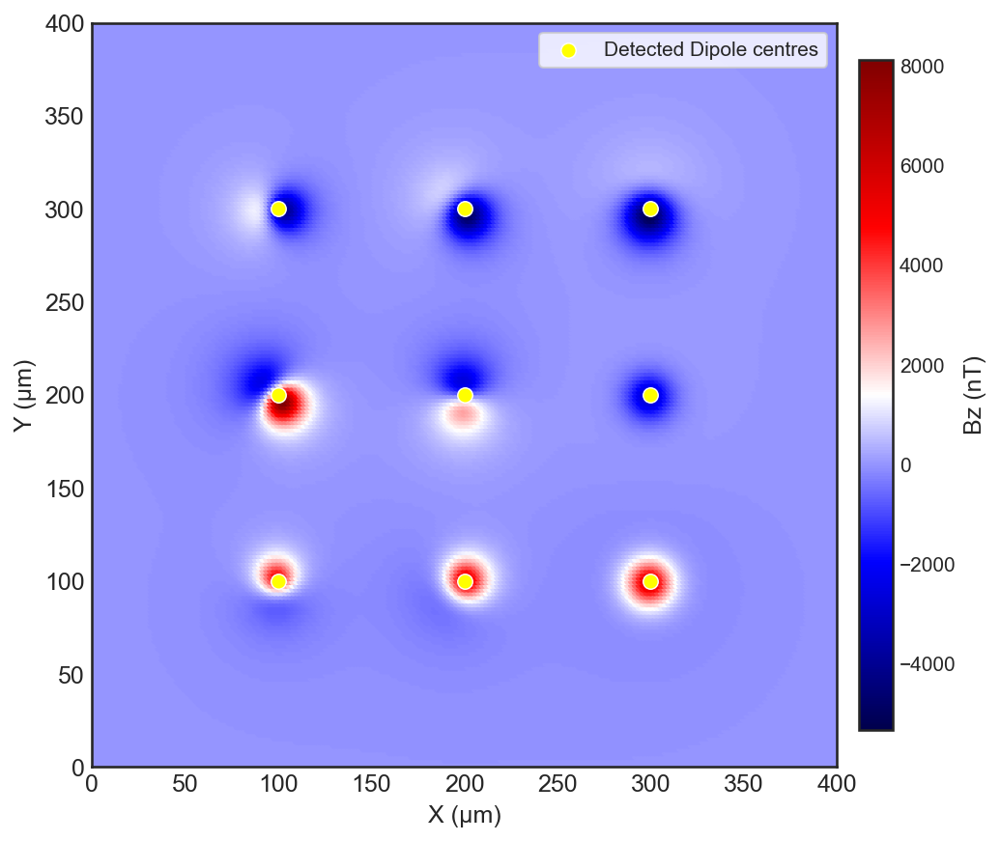

In [14]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---------- BASE DIRECTORY ----------
base_dir = os.getcwd()

# ---------- 1. Read mag.obs ----------
mag_path = os.path.join(base_dir, "4-3D_Inversion_Filtered", "Mag_Inversion.obs")
mag = np.loadtxt(mag_path, skiprows=1)

x = mag[:, 0]
y = mag[:, 1]
bz = mag[:, 3]
#back to QDM Converntion
#bz = -1*mag[:, 3]

# ---------- 2. Read grain centres ----------
grain_path = os.path.join(base_dir, "4-Source_Detection", "Blob_Vector_Summary.csv")
grains = pd.read_csv(grain_path, sep=None, engine="python")

gx = grains["x_center"].values
gy = grains["y_center"].values

# ---------- 3. Improve colour scaling ----------
bz_min = np.percentile(bz, 0)
bz_max = np.percentile(bz, 100)

# ---------- 4. Apply  matplotlib style ----------
plt.style.use("seaborn-v0_8-white")

# ---------- 5. Plot ----------
fig, ax = plt.subplots(figsize=(8, 6), dpi=150)

# Bz scatter (clipped for prettier colour contrast)
sc = ax.scatter(
    x, y, c=bz, s=10, cmap="seismic",
    vmin=bz_min, vmax=bz_max, rasterized=True
)

cbar = plt.colorbar(sc, ax=ax, shrink=0.9, pad=0.02)
cbar.set_label("Bz (nT)", fontsize=12)
cbar.ax.tick_params(labelsize=10)

# Grain centres
ax.scatter(
    gx, gy, c="yellow", s=55, edgecolors="white",
    linewidths=0.7, label="Detected Dipole centres", zorder=3
)

# ---------- 6. Labels & styling ----------
ax.set_xlabel("X (µm)", fontsize=12)
ax.set_ylabel("Y (µm)", fontsize=12)
#ax.set_title("Bz Map with Grain Centres", fontsize=14)

ax.set_aspect("equal", adjustable="box")
ax.grid(True, linestyle="--", alpha=0.3)
ax.margins(0)
plt.legend(frameon=True, fontsize=10, loc="upper right")
plt.tight_layout()

out_png = os.path.join(base_dir, "4-Source_Detection", "BZ_grains_centers.png")
plt.savefig(out_png, dpi=300, bbox_inches='tight')
plt.show()


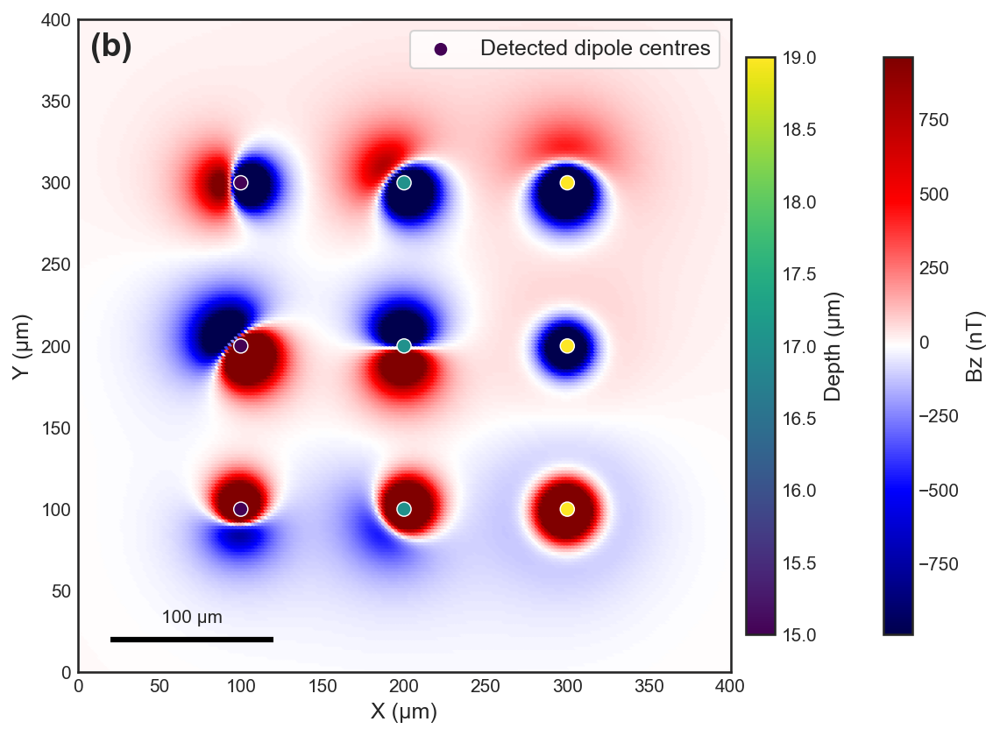

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---------- BASE DIRECTORY ----------
base_dir = os.getcwd()

# ---------- 1. Read mag.obs ----------
mag_path = os.path.join(base_dir, "4-3D_Inversion_Filtered", "Mag_Inversion.obs")
mag = np.loadtxt(mag_path, skiprows=1)

x = mag[:, 0]
y = mag[:, 1]
bz =  mag[:, 3]   # QDM convention

#bz = -1 * mag[:, 3]   # QDM convention

# ---------- 2. Read grain centres ----------
grain_path = os.path.join(base_dir, "4-Source_Detection", "Blob_Vector_Summary.csv")
grains = pd.read_csv(grain_path, sep=None, engine="python")

gx = grains["x_center"].values
gy = grains["y_center"].values
gz = grains["z_center"].values   # <<< depth

# ---------- 3. Improve colour scaling (clip 2% outliers) ----------
bz_min = np.percentile(bz, 2)
bz_max = np.percentile(bz, 98)

# ---------- 4. Apply matplotlib style ----------
plt.style.use("seaborn-v0_8-white")

# ---------- 5. Plot ----------
fig, ax = plt.subplots(figsize=(8, 6), dpi=150)

# Bz scatter
sc = ax.scatter(
    x, y, c=bz, s=10, cmap="seismic",
    vmin=bz_min, vmax=bz_max, rasterized=True
)

cbar = plt.colorbar(sc, ax=ax, shrink=0.8, pad=0.02)
cbar.set_label("Bz (nT)", fontsize=12)
cbar.ax.tick_params(labelsize=10)

# Grain centres colored by depth
scz = ax.scatter(
    gx, gy, c=gz, cmap="viridis", s=60,
    edgecolors="white", linewidths=0.7,
    label="Detected dipole centres", zorder=3
)

cbarz = plt.colorbar(scz, ax=ax, shrink=0.8, pad=0.02)
cbarz.set_label("Depth (µm)", fontsize=12)
cbarz.ax.tick_params(labelsize=10)

# ---------- Scale bar (e.g., 100 µm) ----------
bar_len = 100.0  # µm
x0 = np.min(x) + 0.05 * (np.max(x) - np.min(x))
y0 = np.min(y) + 0.05 * (np.max(y) - np.min(y))

ax.plot([x0, x0 + bar_len], [y0, y0], color="k", linewidth=3, solid_capstyle="butt", zorder=5)
ax.text(x0 + 0.5 * bar_len, y0 + 0.02 * (np.max(y) - np.min(y)),
        f"{int(bar_len)} µm", ha="center", va="bottom", fontsize=10)

# ---------- 6. Labels & styling ----------
ax.set_xlabel("X (µm)", fontsize=12)
ax.set_ylabel("Y (µm)", fontsize=12)

ax.set_aspect("equal", adjustable="box")
#ax.grid(True, linestyle="--", alpha=0.3)
ax.margins(0)

ax.text(
    0.02, 0.98, "(b)",
    transform=ax.transAxes,
    fontsize=18,
    fontweight="bold",
    va="top",
    ha="left"
)

plt.legend(frameon=True, fontsize=12, loc="upper right")
plt.tight_layout()

out_png = os.path.join(base_dir, "4-Source_Detection", "BZ_grains_centers_depth.png")
plt.savefig(out_png, dpi=300, bbox_inches='tight')
plt.show()


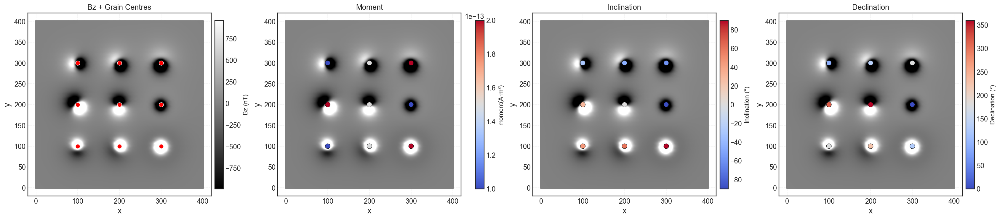

In [16]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---------- BASE DIRECTORY ----------
base_dir = os.getcwd()

# ---------- 1) Read mag.obs ----------
mag_path = os.path.join(base_dir, "4-3D_Inversion_Filtered", "Mag_Inversion.obs")
mag = np.loadtxt(mag_path, skiprows=1)

x = mag[:, 0]
y = mag[:, 1]
bz = mag[:, 3]



# ---------- 2) Read grain centres & properties ----------
grain_path = os.path.join(base_dir, "4-Source_Detection", "Blob_Vector_Summary.csv")
grains = pd.read_csv(grain_path)

# Required columns
if "x_center" not in grains.columns or "y_center" not in grains.columns:
    raise ValueError(f"CSV must contain x_center and y_center. Found: {list(grains.columns)}")
if "dec" not in grains.columns or "inc" not in grains.columns:
    raise ValueError(f"CSV must contain dec and inc. Found: {list(grains.columns)}")

gx = grains["x_center"].to_numpy()
gy = grains["y_center"].to_numpy()
dec = grains["dec"].to_numpy()
inc = grains["inc"].to_numpy()

# moment column name can vary
moment_col_candidates = ["moment(A·m²)", "moment(A·m2)", "moment", "Moment", "moment_amp"]
moment_col = None
for c in moment_col_candidates:
    if c in grains.columns:
        moment_col = c
        break
if moment_col is None:
    raise ValueError(f"Could not find moment column in CSV. Found: {list(grains.columns)}")
moment = grains[moment_col].to_numpy()

# ---------- 3) Clip ranges ----------
bz_min = np.nanpercentile(bz, 2)
bz_max = np.nanpercentile(bz, 98)

m_min = np.nanpercentile(moment, 2)
m_max = np.nanpercentile(moment, 98)

# ---------- 4) Figure ----------
fig, axs = plt.subplots(1, 4, figsize=(24, 6), dpi=140, constrained_layout=True)

def plot_bz_background(ax):
    # GREY background
    sc = ax.scatter(
        x, y, c=bz, s=10, cmap="gray",
        vmin=bz_min, vmax=bz_max, rasterized=True
    )
    ax.set_aspect("equal")
    ax.grid(True, linestyle="--", alpha=0.25)
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    return sc

# 1) Bz + centres
ax = axs[0]
sc_bz0 = plot_bz_background(ax)
ax.scatter(gx, gy, c="red", s=60, edgecolors="white", linewidths=0.7, zorder=3)
ax.set_title("Bz + Grain Centres", fontsize=13)

# 2) Moment
ax = axs[1]
plot_bz_background(ax)
sc_m = ax.scatter(
    gx, gy, c=moment, s=75, cmap="coolwarm",
    vmin=m_min, vmax=m_max,
    edgecolors="black", linewidths=0.5, zorder=3
)
ax.set_title("Moment", fontsize=13)

# 3) Inclination
ax = axs[2]
plot_bz_background(ax)
sc_i = ax.scatter(
    gx, gy, c=inc, s=75, cmap="coolwarm",
    vmin=-90, vmax=90,
    edgecolors="black", linewidths=0.5, zorder=3
)
ax.set_title("Inclination", fontsize=13)

# 4) Declination
ax = axs[3]
plot_bz_background(ax)
sc_d = ax.scatter(
    gx, gy, c=dec, s=75, cmap="coolwarm",
    vmin=0, vmax=360,
    edgecolors="black", linewidths=0.5, zorder=3
)
ax.set_title("Declination", fontsize=13)

# ---------- Colorbars (FIXED POSITIONS) ----------
# Put each colorbar next to its own axis (no global colorbar)
cb_bz = fig.colorbar(sc_bz0, ax=axs[0], fraction=0.046, pad=0.02)
cb_bz.set_label("Bz (nT)", fontsize=11)

cb_m = fig.colorbar(sc_m, ax=axs[1], fraction=0.046, pad=0.02)
cb_m.set_label(f"{moment_col}", fontsize=11)

cb_i = fig.colorbar(sc_i, ax=axs[2], fraction=0.046, pad=0.02)
cb_i.set_label("Inclination (°)", fontsize=11)

cb_d = fig.colorbar(sc_d, ax=axs[3], fraction=0.046, pad=0.02)
cb_d.set_label("Declination (°)", fontsize=11)

out_png = os.path.join(base_dir, "4-Source_Detection", "BZ_grains_centers_results.png")
plt.savefig(out_png, dpi=300, bbox_inches='tight')
plt.show()


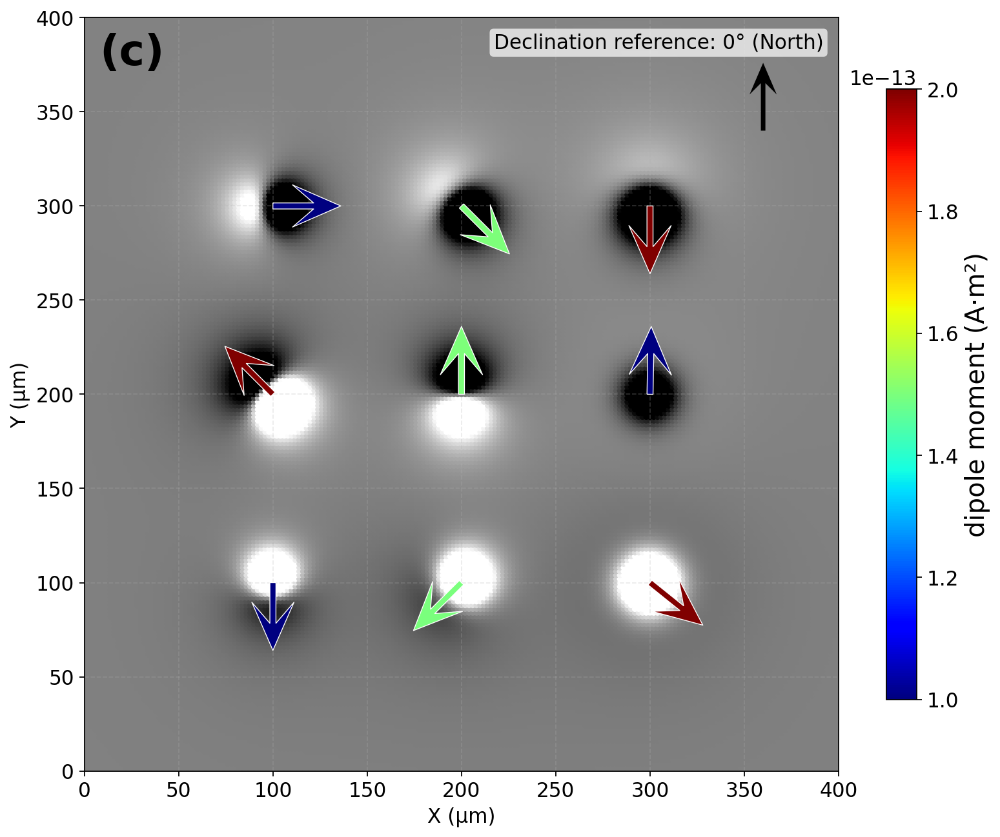

In [23]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# ---------- BASE DIRECTORY ----------
base_dir = os.getcwd()

# ---------- 1) Read mag.obs ----------
mag_path = os.path.join(base_dir, "4-3D_Inversion_Filtered", "Mag_Inversion.obs")
mag = np.loadtxt(mag_path, skiprows=1)

x = mag[:, 0]
y = mag[:, 1]
bz = mag[:, 3]


bz = -1*mag[:, 3]

# ---------- 2) Read grain centres & properties ----------
grain_path = os.path.join(base_dir, "4-Source_Detection", "Blob_Vector_Summary.csv")
grains = pd.read_csv(grain_path)

# Required columns
required_cols = ["x_center", "y_center", "dec"]
for c in required_cols:
    if c not in grains.columns:
        raise ValueError(f"Missing column {c} in Blob_Vector_Summary.csv")

gx = grains["x_center"].to_numpy()
gy = grains["y_center"].to_numpy()
dec = grains["dec"].to_numpy()

# moment column name can vary
moment_col_candidates = ["moment(A·m²)", "moment(A·m2)", "moment", "Moment", "moment_amp"]
moment_col = None
for c in moment_col_candidates:
    if c in grains.columns:
        moment_col = c
        break
if moment_col is None:
    raise ValueError(f"Could not find moment column in CSV. Found: {list(grains.columns)}")
moment = grains[moment_col].to_numpy()

# ---------- 3) Clip ranges ----------
bz_min = np.nanpercentile(bz, 2)
bz_max = np.nanpercentile(bz, 98)

m_min = np.nanpercentile(moment, 2)
m_max = np.nanpercentile(moment, 98)

# ---------- 4) Figure ----------
fig, ax = plt.subplots(1, 1, figsize=(10, 8), dpi=160, constrained_layout=True)

# --- Bz background (GREY) ---
sc_bz = ax.scatter(
    x, y,
    c=bz, s=10, cmap="gray",
    vmin=bz_min, vmax=bz_max,
    rasterized=True
)


ax.set_aspect("equal")
ax.grid(True, linestyle="--", alpha=0.25)
ax.margins(0)
ax.set_xlabel("X (µm)", fontsize=14)
ax.set_ylabel("Y (µm)", fontsize=14)
ax.tick_params(axis="both", labelsize=14)
#ax.set_title("Bz map + Declination arrows (colored by Moment)", fontsize=13)

# ---------- Declination arrows ----------
# Use declination from results directly (degrees → radians)
dec_rad = np.deg2rad(dec)

# Unit direction vectors
#u = np.cos(dec_rad)
#v = np.sin(dec_rad)

# Geophysical declination convention:
# 0° = North (+Y), clockwise positive
u = np.sin(dec_rad)
v = np.cos(dec_rad)
           
# Fixed arrow length in data units (handle NaNs safely)
dx = np.ptp(x[np.isfinite(x)])
dy = np.ptp(y[np.isfinite(y)])
arrow_len = 0.09 * max(dx, dy)

# Color normalization for moment
norm_m = Normalize(vmin=m_min, vmax=m_max)

q = ax.quiver(
    gx, gy,
    u * arrow_len, v * arrow_len,
    moment,
    cmap="jet",
    norm=norm_m,
    angles="xy",
    scale_units="xy",
    scale=1,
    width=0.008,          # slightly thicker
    headwidth=7,
    headlength=8,
    edgecolor="white",    # contrast edge
    linewidth=0.6,
    zorder=4
)

# ----------  3: Reference arrow ----------
#x0 = np.nanmin(x) + 0.08 * dx
#y0 = np.nanmin(y) + 0.10 * dy
x0 = np.nanmax(x) - 0.10 * dx,
y0 = np.nanmax(y) - 0.15 * dy,

# Reference arrow (0° = North, pointing UP)
ax.quiver(
    x0, y0,
    0.0, arrow_len,          #  UPWARD arrow
    color="black",
    angles="xy",
    scale_units="xy",
    scale=1,
    width=0.006,
    headwidth=6.0,
    headlength=7.0,
    zorder=4
)


#ax.text(
#    x0, y0 + 1.15 * arrow_len,
#    "Declination reference: 0° (North)",
#    fontsize=9,
#    ha="center",
#    va="bottom",
#    bbox=dict(boxstyle="round,pad=0.2", fc="white", alpha=0.7, ec="none"),
#    zorder=5
#)

ax.text(
    0.98, 0.98,
    "Declination reference: 0° (North)",
    transform=ax.transAxes,
    fontsize=14,
    ha="right",
    va="top",
    bbox=dict(boxstyle="round,pad=0.2", fc="white", alpha=0.7, ec="none"),
    zorder=5
)


#ax.text(
 #   x0, y0 - 0.04 * dy,
 #   "Arrows show declination (°), clockwise from North",
  #  fontsize=7,
  #  ha="left",
  #  va="top",
  #  bbox=dict(boxstyle="round,pad=0.2", fc="white", alpha=0.7, ec="none"),
  #  zorder=5
#)


# ---------- Colorbars ----------
#cb_bz = fig.colorbar(sc_bz, ax=ax, fraction=0.046, pad=0.02)
#cb_bz.set_label("Bz (nT)", fontsize=12)
#cb_bz.ax.tick_params(labelsize=10)


cb_q = fig.colorbar(q, ax=ax, fraction=0.035, pad=-0.01) #0.08
cb_q.set_label("dipole moment (A·m²)", fontsize=18)
cb_q.ax.tick_params(labelsize=14)
#  scientific notation
cb_q.ax.yaxis.get_offset_text().set_fontsize(14)

ax.text(
    0.02, 0.98, "(c)",
    transform=ax.transAxes,
    fontsize=30,
    fontweight="bold",
    va="top",
    ha="left"
)

out_png = os.path.join(base_dir, "4-Source_Detection", "BZ_grains_Dec.png")
plt.savefig(out_png, dpi=300, bbox_inches='tight')
plt.show()
